In [1]:
# Important constants 

# The gap between current day and one we want to predict 
# "7" means that we want to predict values after a week wrt the current day 
target_shift = 7 
#Data path
data_path = './data/Full_data_Trentino.csv'

For linear models the negative prediction are transformed into 0. The negative prediction are not tolerated because are meaningless.

In [2]:
#Libraries for data processing
import numpy as np
import pandas as pd

#Library for plotting
import matplotlib.pyplot as plt

#Libraries for model training and validation
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit, RandomizedSearchCV
from sklearn.metrics import r2_score, mean_squared_error
import seaborn as sns

Defining features, taxa and loading data

In [3]:
#Loading data
data = pd.read_csv(data_path)
data['datetime'] = pd.to_datetime(data['datetime'])

data['year'] = data['datetime'].dt.year
data['month'] = data['datetime'].dt.month
data['day'] = data['datetime'].dt.dayofyear

#Taxa concentrations
taxa = [
    'Ambrosia', 'Artemisia', 'Betula', 'Corylus', 'Cupressaceae, Taxaceae', 
    'Fraxinus', 'Olea europaea', 'Ostrya carpinifolia', 'Poaceae', 'Urticaceae'
]

#Meteorological features
meteo_features = ['temp_max', 'temp_min', 'temp_mean', 'precipitation']
taxa_meteo = taxa + meteo_features 

#Defining new input Features
#Creating lagged and trend features for both meteo and concentration features 
for feature in taxa_meteo:
    data[f'{feature}_lag7'] = data[feature].shift(7)
    data[f'{feature}_trend7'] = data[feature] - data[f'{feature}_lag7']
    data[f'{feature}_sum7'] = data[feature].rolling(window=7).sum()

#Target feature -> pollen concentration of the following week (->  -7-days lagged taxa concentration)
for taxon in taxa:
    data[f'{taxon}_target'] = data[taxon].shift(-target_shift)

# #Creating 7-day sum feature for precipitation
# data['precipitation_sum7'] = data['precipitation'].rolling(window=7).sum()

#Dropping possible existing rows with NaN values created by shifts and rolling sums
data.dropna(inplace=True)

#Defining the final feature set to use
features = [
    'year', 'month', 'day', 
    'temp_max', 'temp_min', 'temp_mean', 'precipitation', 
    # 'precipitation_sum7'
]
features += [f'{feature}_lag7' for feature in taxa_meteo]
features += [f'{feature}_trend7' for feature in taxa_meteo]
features += [f'{feature}_sum7' for feature in taxa_meteo]

Declare some useful functions

In [4]:
def split_data(data):
    #Ensuring time series consistency for the splits by filtering dates
    train_data = data[data['year'] <= 2021]  #Training on data up to 2021
    test_data = data[data['year'] == 2022]   #Testing on 2022 data

    return train_data, test_data 

def extract_xy(data, input_features, taxon):
    return data[input_features], data[f'{taxon}_target']

# Note: this function generate one result at a time 
def train_model(regressor, train_data, features, taxa, param_grid):
    "A generator function that train a bunch of models on each pollen type and returns the best model."
    #Training and evaluating a model for each pollen type
    for taxon in taxa:
        # Extract only relevant features 
        X_train, y_train = extract_xy(train_data, features, taxon) 
        
        # Initialize TimeSeriesSplit, keeping consistent splits
        tscv = TimeSeriesSplit(n_splits=5)

        # models = RandomizedSearchCV(estimator=regressor, param_distributions=param_grid, n_iter=10, cv=tscv, verbose=2, n_jobs=-1)
        models = GridSearchCV(estimator=regressor, param_grid=param_grid, cv=tscv, verbose=1, n_jobs=-1)
        models.fit(X_train, y_train)
        best_model = models.best_estimator_
        
        yield taxon, best_model

def plot_pred(y_test, y_pred, test_dates, taxon):
    #Results visualization
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.3)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    plt.xlabel("Actual Concentration")
    plt.ylabel("Predicted Concentration")
    plt.title(f"Predicted vs Actual for {taxon}")
    plt.show()

    fig, ax = plt.subplots(1, figsize=(10,6))
    ax.plot(test_dates, y_test, color='green', label='real')
    ax.plot(test_dates, y_pred, color='red', label='predicted') 
    ax.grid()  
    fig.legend() 
    plt.show() 
    plt.close(fig) 

# Initalize training variables 

In [5]:
train_data, test_data = split_data(data) 
# List to store achieved performances 
results = {} 

# Ridge regression

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': None, 'positive': False, 'random_state': None, 'solver': 'auto', 'tol': 0.0001}
Taxon: Ambrosia
Tuned R² Score: -0.0055
Tuned Mean Squared Error: 0.0753

[('Ambrosia_trend7', 0.06391887671068963), ('Ambrosia_lag7', 0.050913171575626116), ('month', -0.0321723002873222), ('Ambrosia_sum7', 0.03053719609972086), ('Olea europaea_lag7', -0.008625940180883696), ('temp_mean_sum7', -0.007696014218693608), ('Artemisia_lag7', 0.007291382679831051), ('temp_max', 0.007098777578867997), ('temp_max_lag7', 0.006553244135509709), ('year', 0.006487938654080289), ('temp_min_lag7', 0.00510576356619254), ('temp_min_sum7', 0.004169016239147562), ('Olea europaea_trend7', -0.0040309066608072135), ('temp_min', 0.002601892569549883), ('temp_min_trend7', -0.002503871141663678), ('temp_mean', -0.0018770534445672067), ('Urticaceae_lag7', 0.0015882063557092264), ('temp_mean

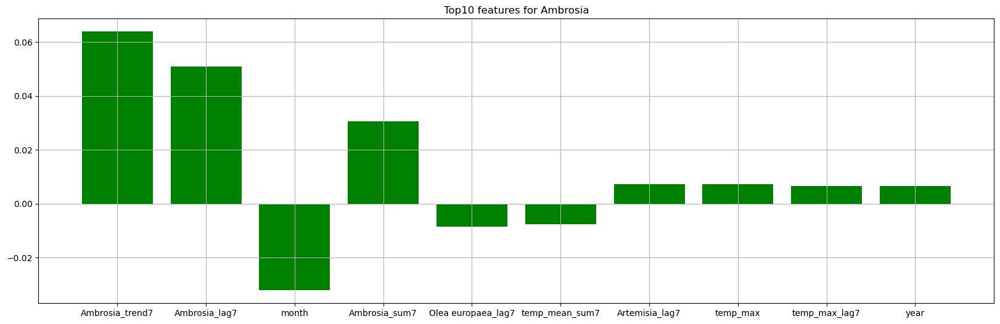

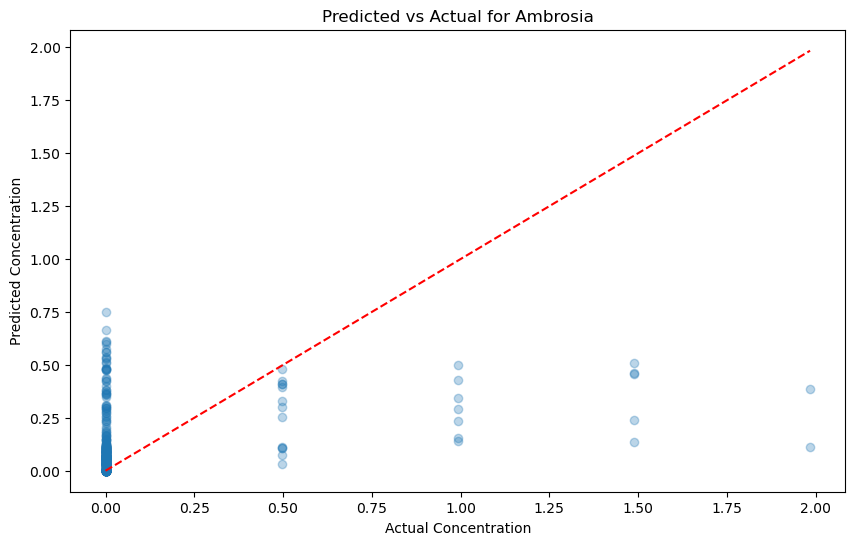

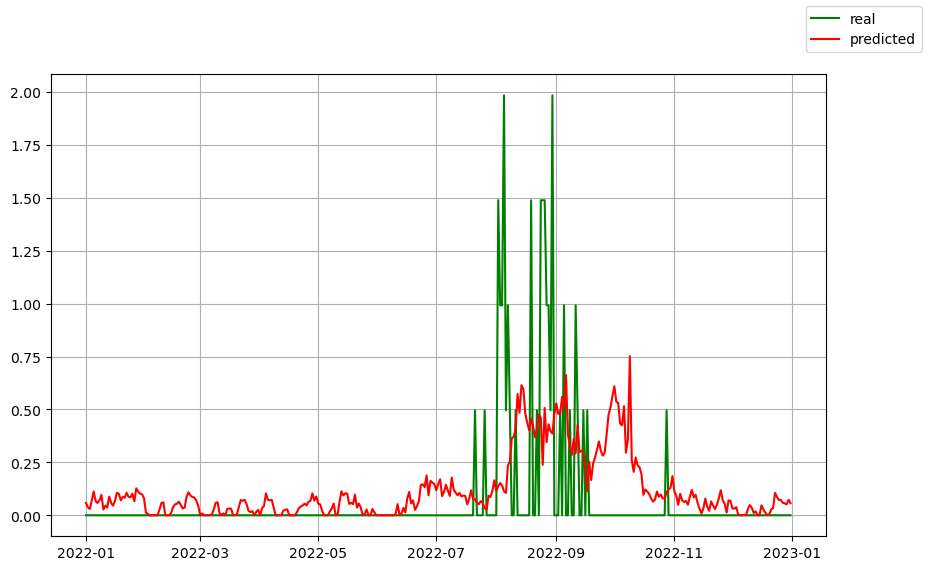

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': None, 'positive': False, 'random_state': None, 'solver': 'auto', 'tol': 0.0001}
Taxon: Artemisia
Tuned R² Score: 0.1154
Tuned Mean Squared Error: 36.7231

[('month', 2.6885358637501056), ('Ambrosia_trend7', -0.5296585735606882), ('Ambrosia_lag7', 0.4420619161121451), ('Artemisia_trend7', 0.3303543873666118), ('Artemisia_lag7', 0.2720622089080005), ('year', 0.13136437619848612), ('Ambrosia_sum7', 0.12675649674648815), ('Olea europaea_lag7', -0.1245105962191576), ('temp_mean_sum7', -0.09973474234186756), ('day', -0.08520162336501748), ('temp_max_lag7', 0.08249756304356919), ('temp_mean_trend7', -0.08209207595910034), ('temp_mean', -0.07714985958133662), ('temp_min_sum7', 0.06857401573740515), ('temp_max_trend7', -0.05420938059223919), ('temp_max_sum7', 0.052450330631727674), ('Olea europaea_trend7', -0.032567067664523414), ('temp_max', 0.02828818

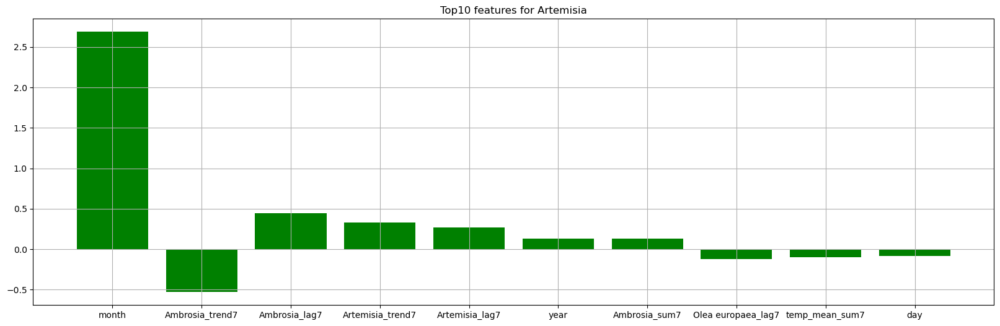

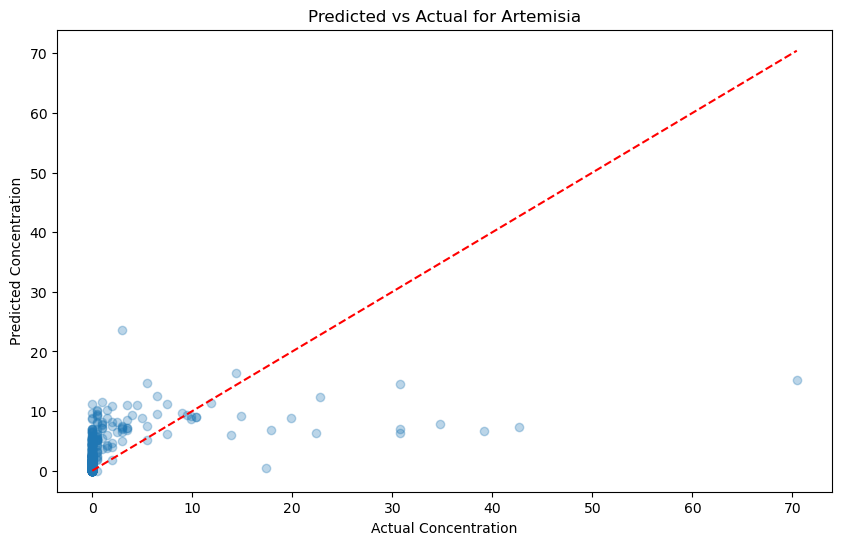

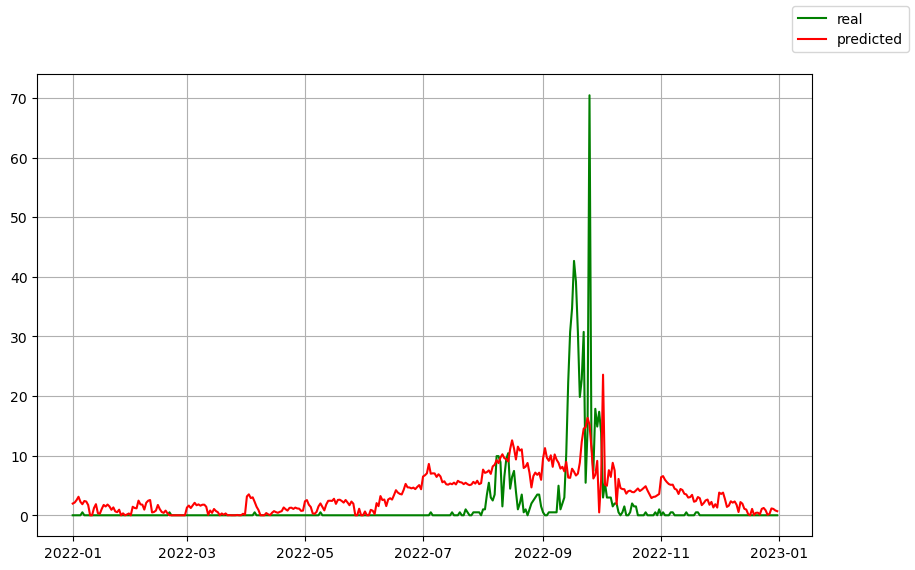

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': None, 'positive': False, 'random_state': None, 'solver': 'auto', 'tol': 0.0001}
Taxon: Betula
Tuned R² Score: 0.4072
Tuned Mean Squared Error: 339.9733

[('month', -3.1721892380544947), ('temp_mean_trend7', -0.4078118907628766), ('Betula_lag7', 0.2814721783444247), ('Betula_trend7', 0.2775322188096463), ('temp_mean', -0.26242028890296015), ('temp_max', 0.260542291009023), ('temp_min_trend7', 0.23018320255360736), ('temp_max_trend7', 0.1856645214138391), ('temp_min_lag7', -0.172252340516941), ('temp_mean_sum7', 0.16341529439669578), ('temp_mean_lag7', 0.14539160571571416), ('Ambrosia_trend7', 0.12017193796315404), ('temp_max_sum7', -0.09128055945217166), ('day', 0.08780960259526543), ('temp_min_sum7', -0.08284728718604513), ('temp_max_lag7', 0.07487777051245408), ('temp_min', 0.05793086703484719), ('Ambrosia_lag7', 0.05656588964328093), ('Fraxin

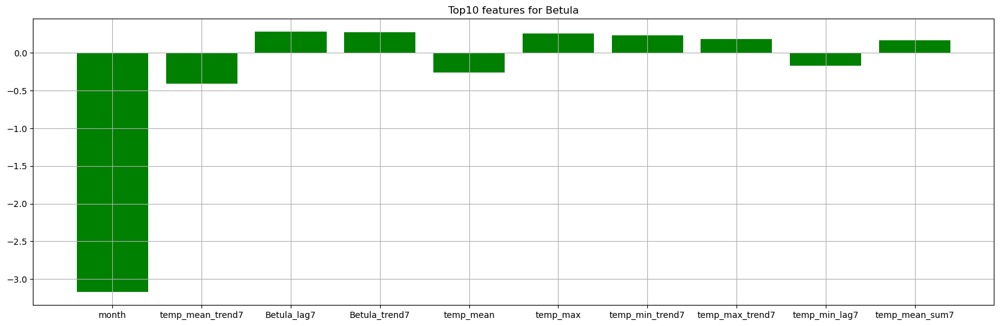

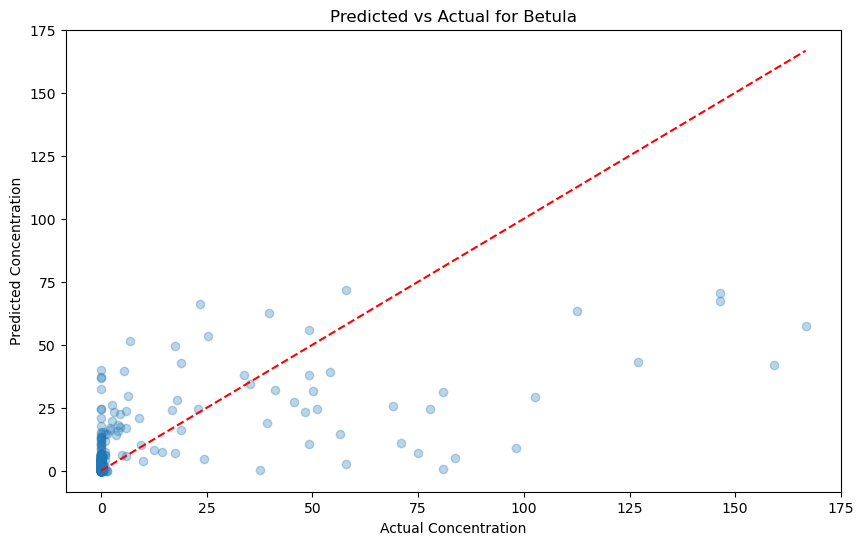

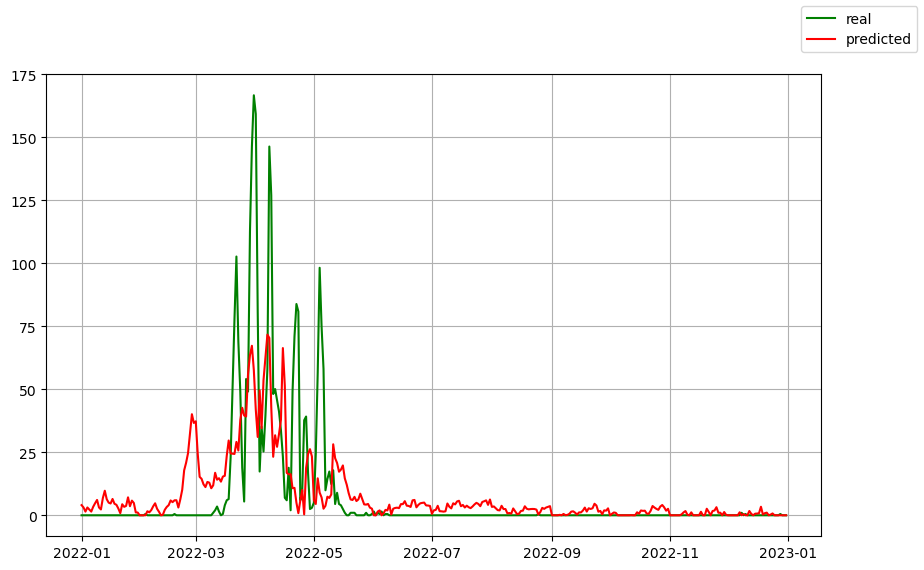

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': None, 'positive': False, 'random_state': None, 'solver': 'auto', 'tol': 0.0001}
Taxon: Corylus
Tuned R² Score: 0.4086
Tuned Mean Squared Error: 188.8988

[('month', -0.3446957122491885), ('Corylus_lag7', 0.2028666265515373), ('temp_mean', -0.1713263536657089), ('temp_min', 0.17048588772926715), ('temp_max', 0.1584130585359473), ('temp_max_trend7', 0.15493350793059618), ('Corylus_trend7', 0.15086655525960285), ('temp_mean_lag7', -0.1316199179470727), ('year', 0.09351720902228498), ('temp_min_lag7', 0.08992466837146543), ('temp_mean_sum7', -0.08564780385280583), ('temp_min_trend7', 0.08056121986718166), ('Olea europaea_lag7', -0.051583375547303655), ('precipitation_lag7', -0.04844926853050309), ('Olea europaea_trend7', -0.048190851354254244), ('Ambrosia_lag7', 0.04156173589285155), ('temp_mean_trend7', -0.03970643498865908), ('precipitation', -0.

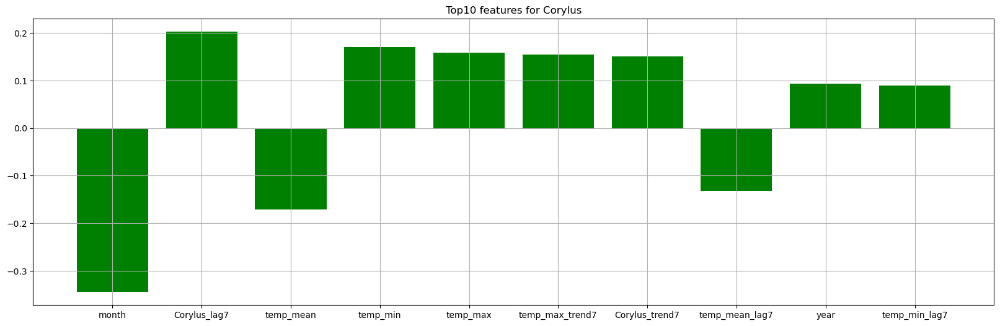

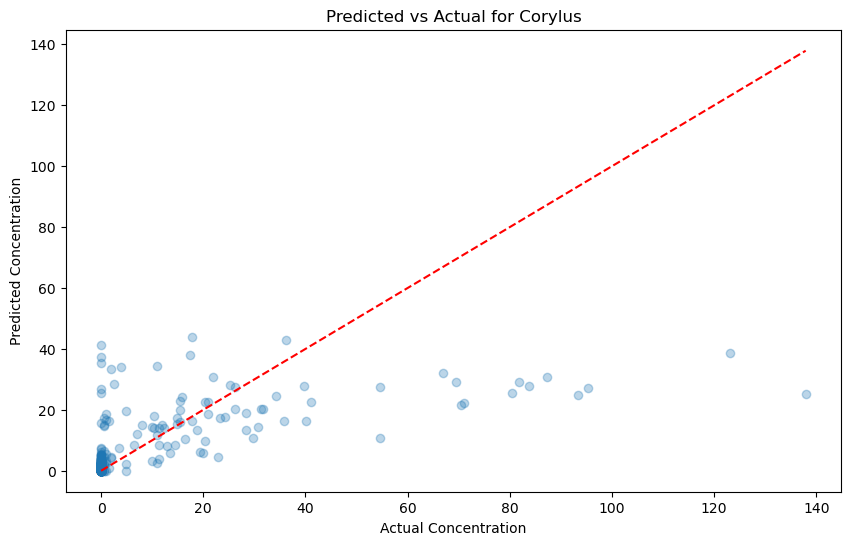

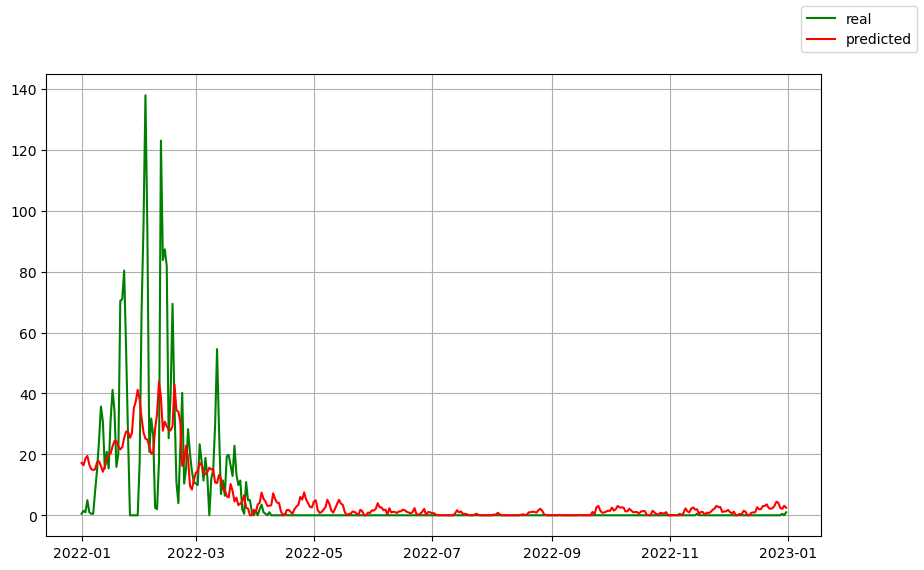

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': None, 'positive': False, 'random_state': None, 'solver': 'auto', 'tol': 0.0001}
Taxon: Cupressaceae, Taxaceae
Tuned R² Score: 0.3477
Tuned Mean Squared Error: 2211.9227

[('month', 2.811584242552625), ('temp_mean', -0.3692765481731251), ('temp_mean_trend7', -0.30484659004788695), ('temp_min_trend7', 0.296142805926783), ('temp_max_trend7', 0.2808539932556524), ('temp_max', 0.2759772929273837), ('temp_min', 0.22310539383098985), ('Corylus_lag7', 0.21712866007974524), ('Cupressaceae, Taxaceae_trend7', 0.21581774039619214), ('Cupressaceae, Taxaceae_lag7', 0.20019084143259633), ('Betula_lag7', -0.16504132444734163), ('Betula_trend7', -0.16491241398122508), ('temp_min_sum7', -0.16311210739574916), ('year', 0.14115587060483098), ('day', -0.1354845024822294), ('temp_mean_sum7', 0.0760323887849339), ('temp_min_lag7', -0.07303740619051889), ('Corylus_sum

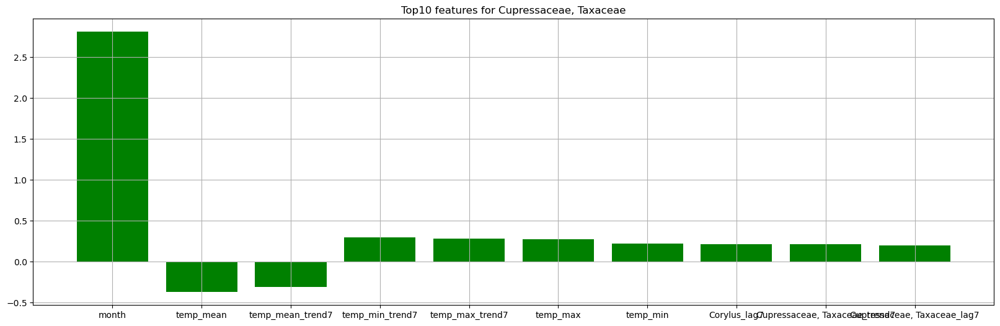

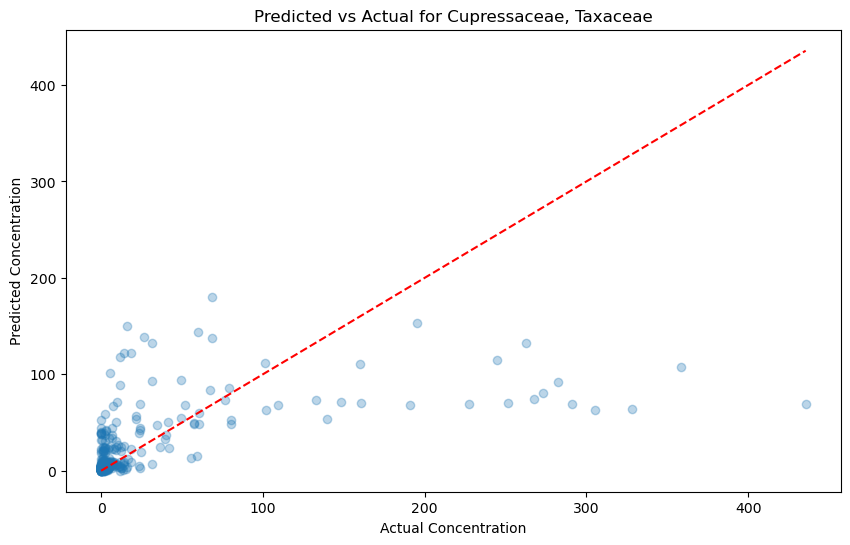

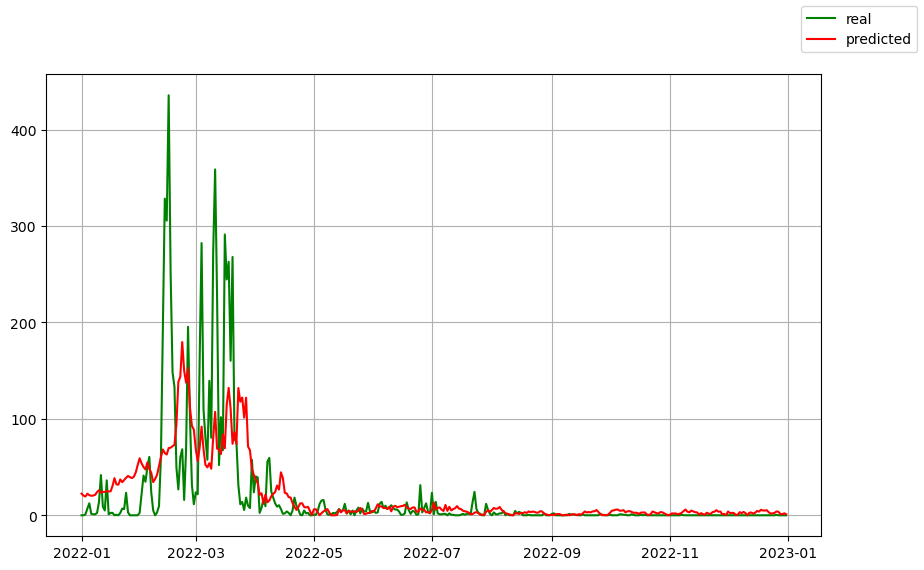

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': None, 'positive': False, 'random_state': None, 'solver': 'auto', 'tol': 0.0001}
Taxon: Fraxinus
Tuned R² Score: 0.2160
Tuned Mean Squared Error: 2019.2202

[('month', -3.4915787792138766), ('temp_mean_trend7', -0.5004109036584317), ('Fraxinus_lag7', 0.36060859653292493), ('temp_mean', -0.3595843647132614), ('Betula_lag7', 0.349679218583261), ('temp_min_lag7', -0.3146830930217061), ('Fraxinus_trend7', 0.30629288346849526), ('temp_max_trend7', 0.28044243006812797), ('temp_min_trend7', 0.2627264769940771), ('temp_max', 0.22963519579751349), ('Betula_trend7', 0.15700274917937845), ('Ambrosia_trend7', 0.15343188672061336), ('temp_mean_lag7', 0.1408265377447515), ('day', 0.10309051183366219), ('precipitation_lag7', 0.10194804976444816), ('Ostrya carpinifolia_trend7', 0.08126266159520415), ('Betula_sum7', -0.07302243503357062), ('temp_mean_sum7', 0.07

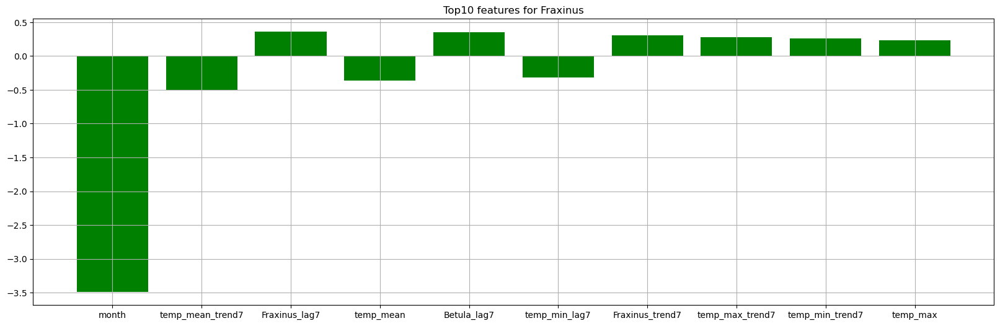

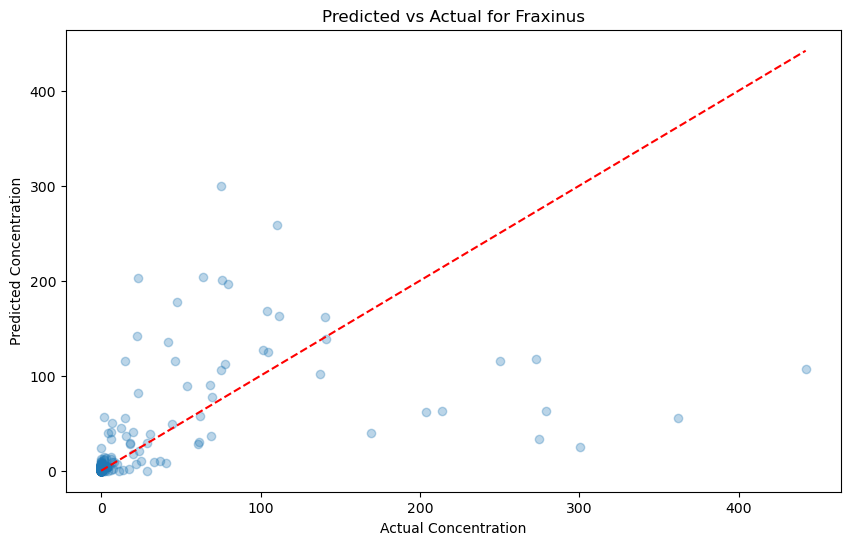

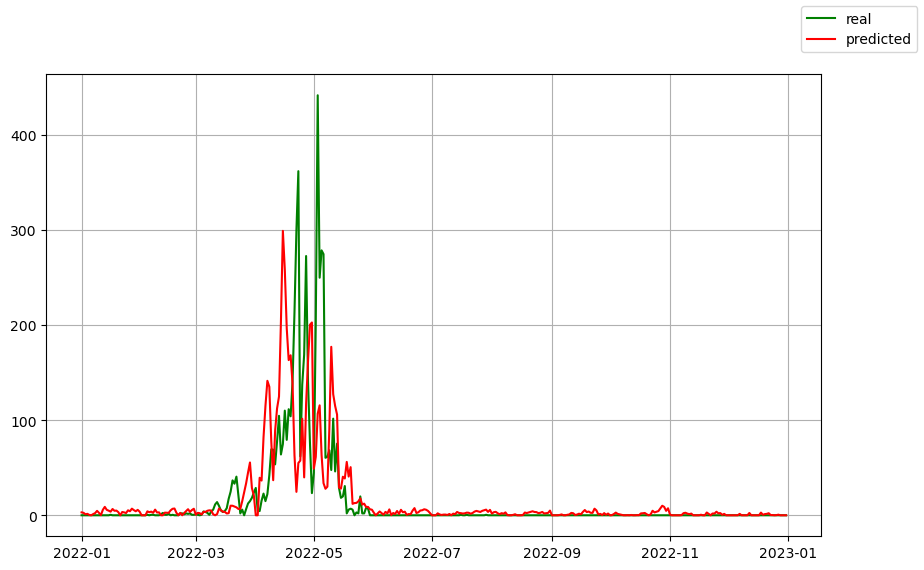

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 0.1, 'copy_X': True, 'fit_intercept': True, 'max_iter': None, 'positive': False, 'random_state': None, 'solver': 'auto', 'tol': 0.0001}
Taxon: Olea europaea
Tuned R² Score: 0.2397
Tuned Mean Squared Error: 8.3987

[('Olea europaea_trend7', 0.4850069469291872), ('month', -0.47857006116278256), ('Olea europaea_lag7', 0.4563272419238095), ('Ambrosia_lag7', -0.0472559868783523), ('Olea europaea_sum7', -0.024507457151495056), ('year', 0.023220735363498772), ('Ambrosia_trend7', -0.018639493056792147), ('temp_mean_sum7', 0.016905126962626214), ('temp_min', -0.016158372253968857), ('Ambrosia_sum7', -0.015983402745086826), ('day', 0.013910083834722628), ('temp_max', 0.011894817356660394), ('temp_min_trend7', -0.009045454141933784), ('temp_mean_trend7', 0.009034273560363511), ('temp_max_lag7', 0.007785761913925015), ('Artemisia_lag7', -0.007123464558277226), ('temp_min_lag7', -0.007112927447836032), ('temp_ma

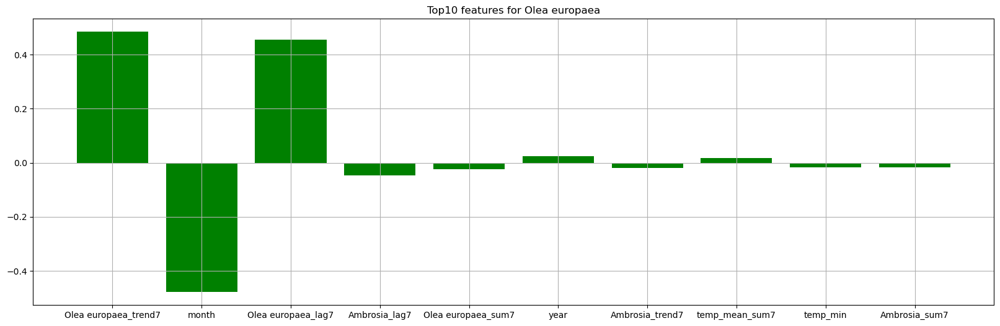

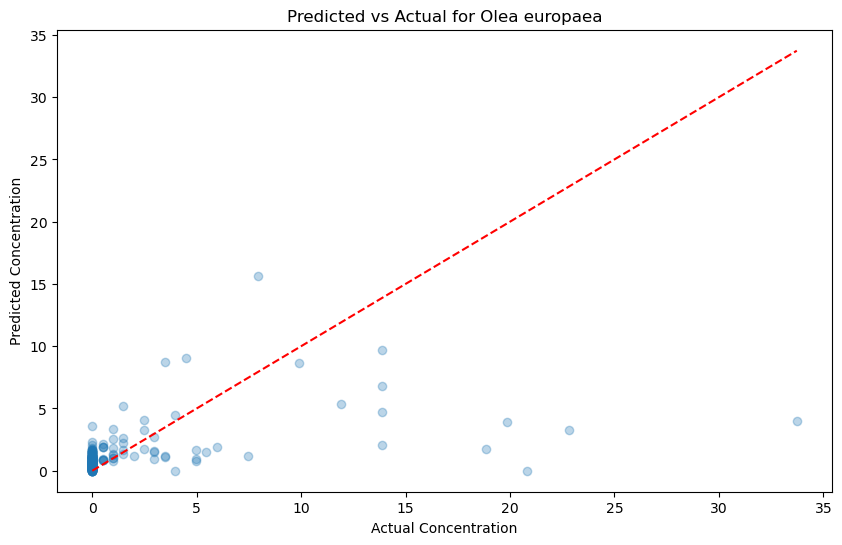

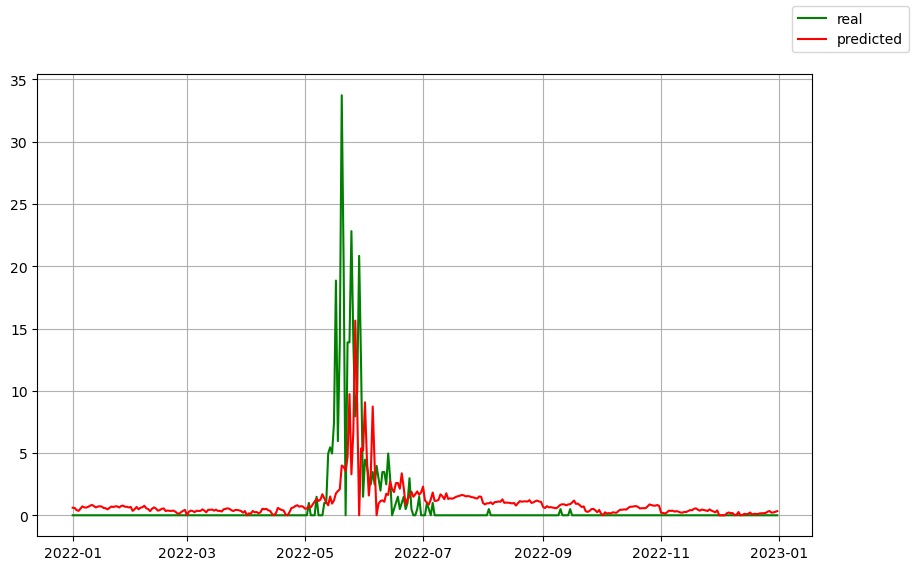

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': None, 'positive': False, 'random_state': None, 'solver': 'auto', 'tol': 0.0001}
Taxon: Ostrya carpinifolia
Tuned R² Score: 0.4811
Tuned Mean Squared Error: 35170.6725

[('month', -4.399094910260466), ('temp_mean_trend7', -2.838465032142141), ('temp_max', 2.160568617730388), ('temp_mean', -2.0980475203604443), ('temp_max_trend7', 2.0470724385428714), ('temp_min_trend7', 1.6415878306149891), ('temp_min', 1.4903198384171805), ('temp_mean_sum7', 1.1939568936430371), ('temp_max_sum7', -0.9558444272297922), ('Betula_trend7', 0.8916387121655522), ('Betula_lag7', 0.7949235860200842), ('Ambrosia_trend7', 0.7657165328191058), ('temp_mean_lag7', 0.7404175444355997), ('Fraxinus_trend7', -0.5255348510477448), ('Fraxinus_lag7', -0.47863366766856325), ('temp_min_sum7', -0.4410759711008462), ('Betula_sum7', 0.372394704849257), ('Ostrya carpinifolia_trend7', 0.

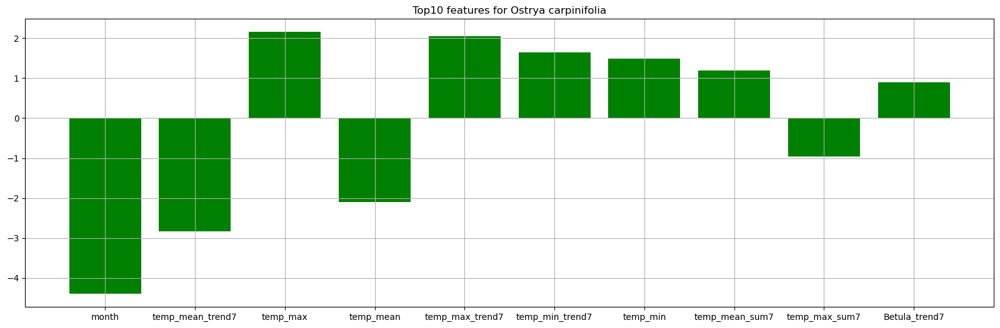

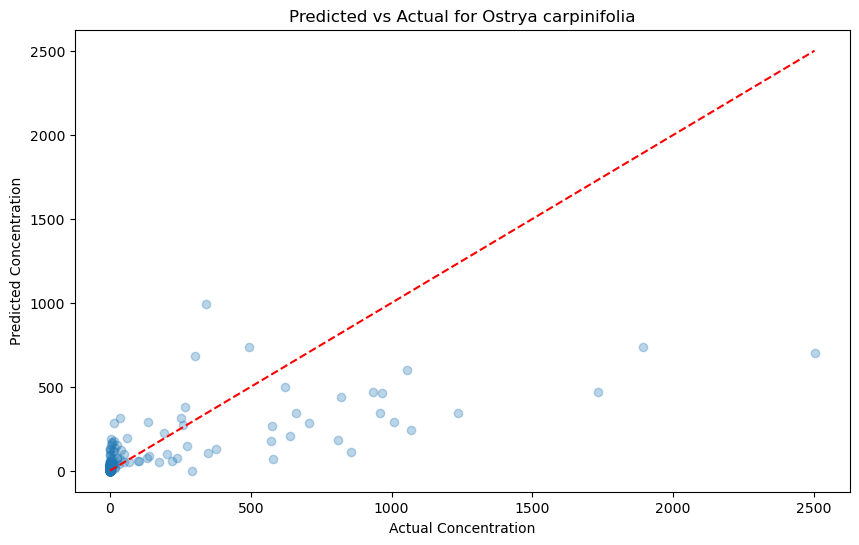

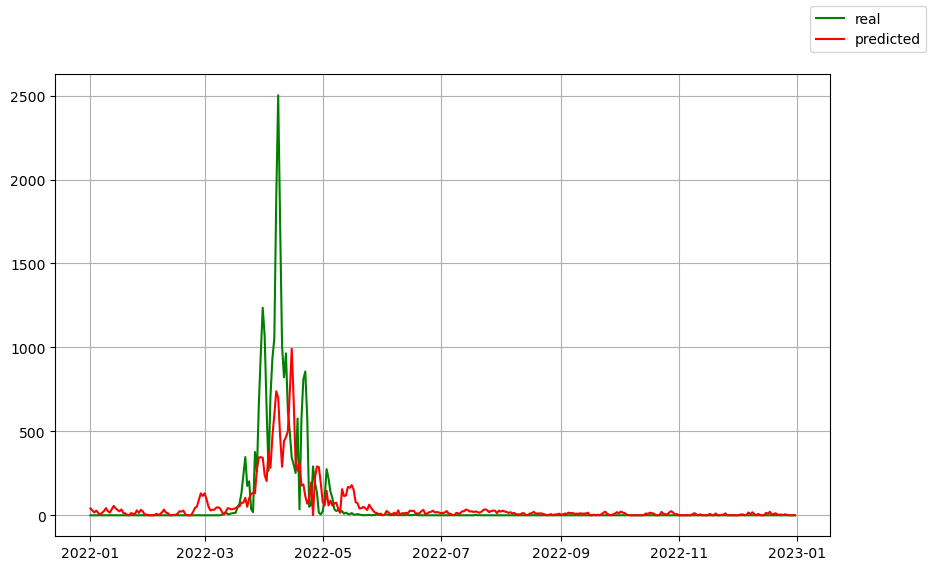

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': None, 'positive': False, 'random_state': None, 'solver': 'auto', 'tol': 0.0001}
Taxon: Poaceae
Tuned R² Score: 0.4078
Tuned Mean Squared Error: 747.8823

[('month', -13.054398194012856), ('temp_min_trend7', 0.614615289469641), ('Ambrosia_lag7', -0.4491661959166444), ('temp_min_lag7', -0.4006503426850665), ('day', 0.38328273894602255), ('year', -0.36954561686524745), ('temp_max_lag7', -0.36793812070138354), ('temp_mean_trend7', -0.36697625540707957), ('Olea europaea_lag7', 0.3207934553300237), ('temp_mean_sum7', 0.3101511618401778), ('Poaceae_trend7', 0.2982756893179287), ('Poaceae_lag7', 0.29305272030787116), ('temp_min_sum7', -0.2622590651342075), ('temp_mean', -0.24957378981950407), ('temp_min', 0.21396496125084588), ('Ambrosia_sum7', -0.19441900288993322), ('temp_max', -0.19318225204716893), ('temp_max_sum7', 0.1784268999844918), ('temp_max_

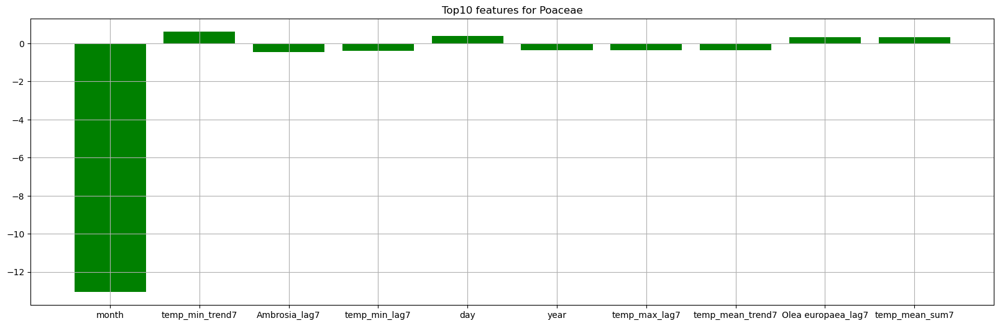

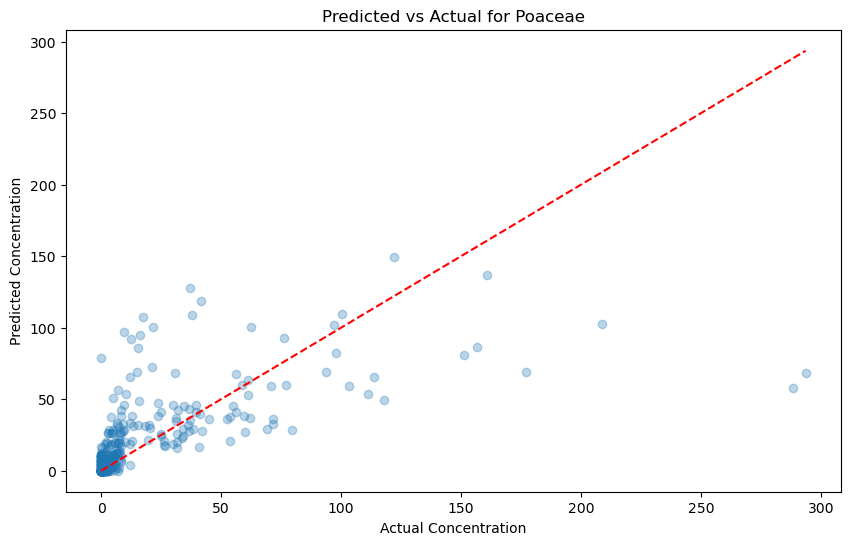

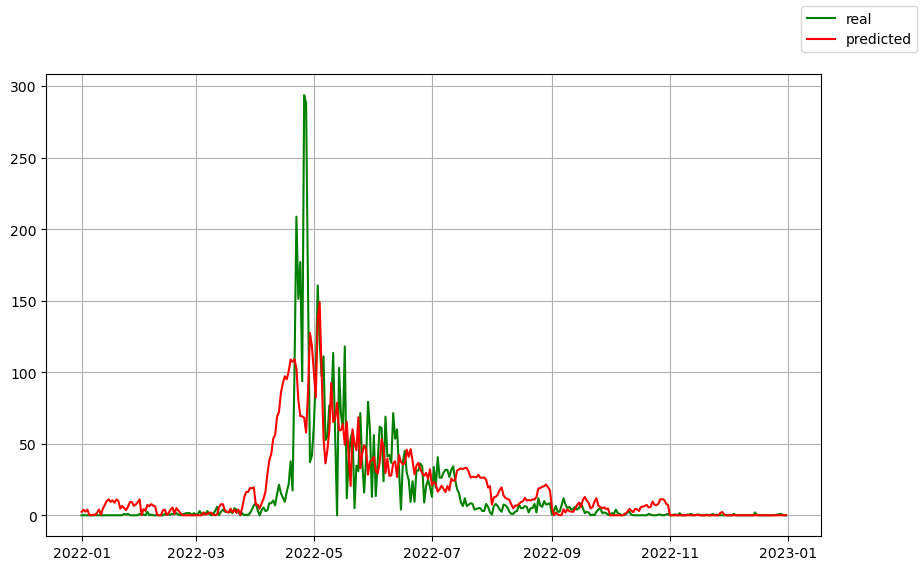

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': None, 'positive': False, 'random_state': None, 'solver': 'auto', 'tol': 0.0001}
Taxon: Urticaceae
Tuned R² Score: 0.5436
Tuned Mean Squared Error: 510.7429

[('Ambrosia_lag7', -5.109435521758349), ('Ambrosia_trend7', -3.1622927731488075), ('temp_mean_trend7', -1.178166559217477), ('month', 0.8311921230094332), ('Ambrosia_sum7', -0.7336495617019518), ('temp_max_lag7', 0.7072955529186524), ('temp_min', 0.687407152943854), ('temp_mean', -0.6206171281473829), ('temp_max', 0.5930720734534206), ('temp_mean_lag7', 0.5575494368701445), ('temp_min_lag7', 0.38995565940275956), ('Urticaceae_trend7', 0.3873867903907552), ('Urticaceae_lag7', 0.36940070792052077), ('precipitation_lag7', 0.31995999782871326), ('temp_min_trend7', 0.29745150217898075), ('Artemisia_trend7', 0.23047140782139036), ('precipitation_sum7', 0.2184411381204285), ('precipitation', 0.196

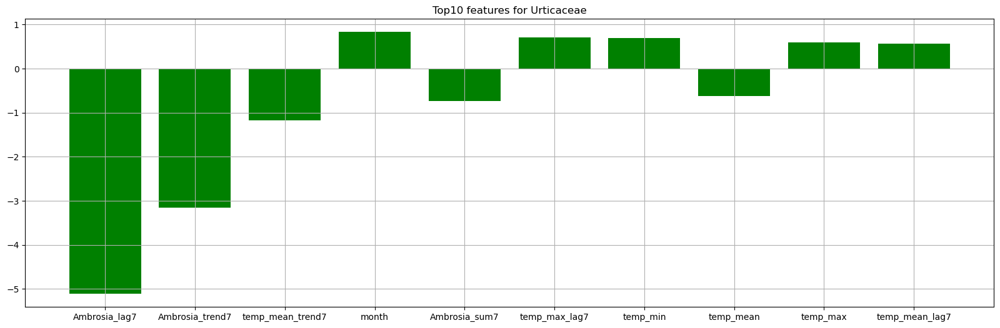

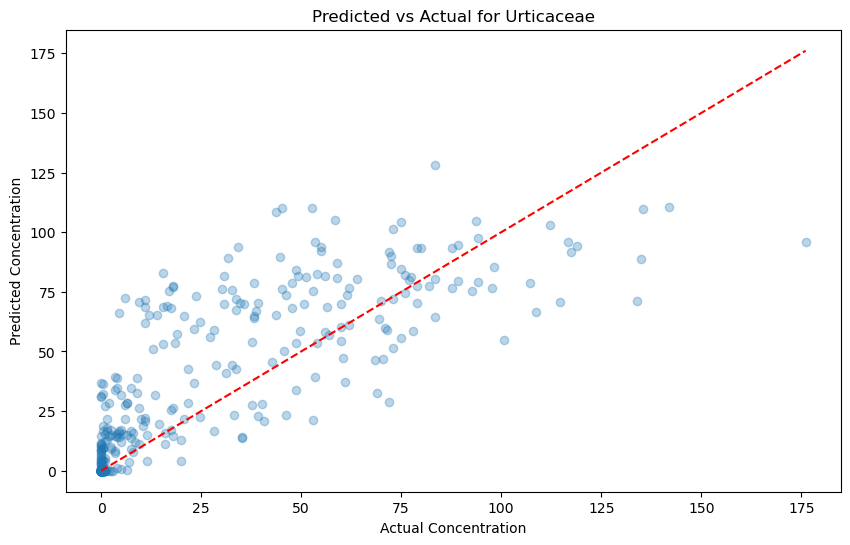

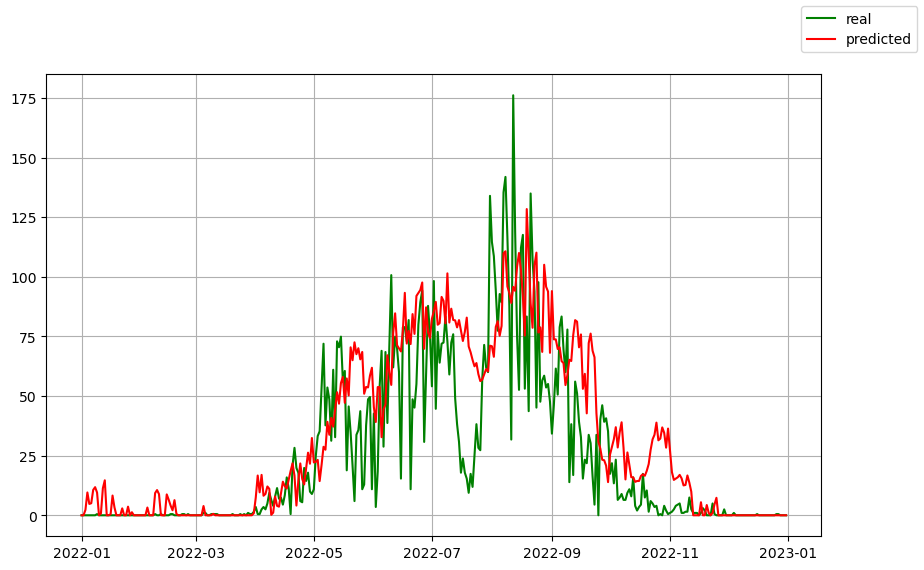

In [6]:
from sklearn.linear_model import Ridge 

# Parameters to choose 
param_grid = {
    "alpha": [1.0, 0.5, 0.1]
}

reg = Ridge() 
ridge_results = {}

# Show best model results for each taxon 
for taxon, best_model in train_model(reg, train_data, features, taxa, param_grid):
    # Extract test data for a specific taxon 
    X_test, y_test = extract_xy(test_data, features, taxon) 

    print("Best parameters: ", best_model.get_params())
    y_pred = best_model.predict(X_test).clip(0) # Negative values are non-sense
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    print(f"Taxon: {taxon}")
    print(f"Tuned R² Score: {r2:.4f}") #Higher is better; measure of how well the model explains variance in the test data
    print(f"Tuned Mean Squared Error: {mse:.4f}\n") #Lower is better; Average squared difference between predicted and actual values 
        
    # Bar plot coefficients  
    coefficients = {col:coef for col, coef in zip(features, best_model.coef_)} 
    # Order based on absolute value (descending) 
    sorted_coeff = list(sorted(coefficients.items(), key=lambda item: abs(item[1]), reverse=True))
    print(sorted_coeff)
    sorted_coeff = sorted_coeff[:10] # Top10
    
    fig, ax = plt.subplots(figsize=(20,6)) 
    ax.set_title(f"Top10 features for {taxon}") 
    ax.bar([item[0] for item in sorted_coeff], [item[1] for item in sorted_coeff], color='green', label='real')
    ax.grid()  
    plt.show() 
    plt.close(fig) 


    plot_pred(y_test, y_pred, test_data['datetime'], taxon)

    # Save the achieved score for this taxon 
    ridge_results[taxon] = r2 

# Store the achieved results in a global results table 
results['ridge'] = ridge_results 

# Lasso regression

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 0.1, 'copy_X': True, 'fit_intercept': True, 'max_iter': 1000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
Taxon: Ambrosia
Tuned R² Score: 0.0490
Tuned Mean Squared Error: 0.0713

[('Ambrosia_sum7', 0.033421266467193615), ('Artemisia_lag7', 0.006959868631220553), ('year', 0.002410262228018302), ('Urticaceae_lag7', 0.001671923814053426), ('Olea europaea_sum7', -0.0014644475966721238), ('Urticaceae_trend7', 0.001059654809609249), ('Artemisia_sum7', 0.0009450211271840478), ('Artemisia_trend7', -0.0009099124977159475), ('temp_mean_sum7', -0.0005404425394179309), ('temp_min_sum7', 0.00020125607168492885), ('Poaceae_lag7', -0.00018737203451860384), ('Urticaceae_sum7', 0.00014393851410381204), ('precipitation_trend7', -7.571413288395959e-05), ('Poaceae_sum7', -6.144458980458831e-05), ('day', 3.964826939341062e-05), ('Corylus_sum7',

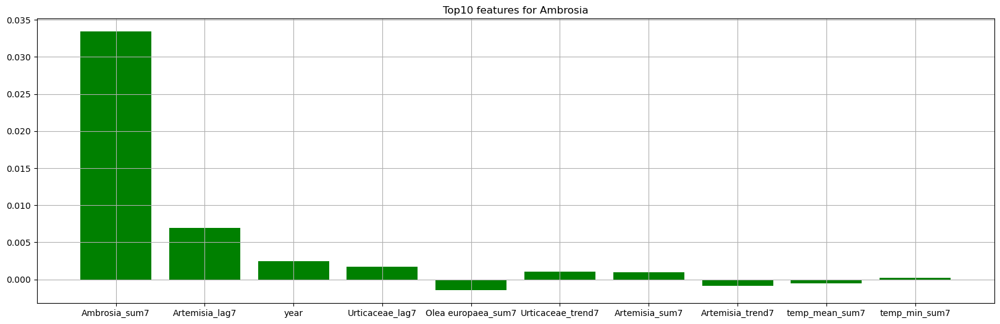

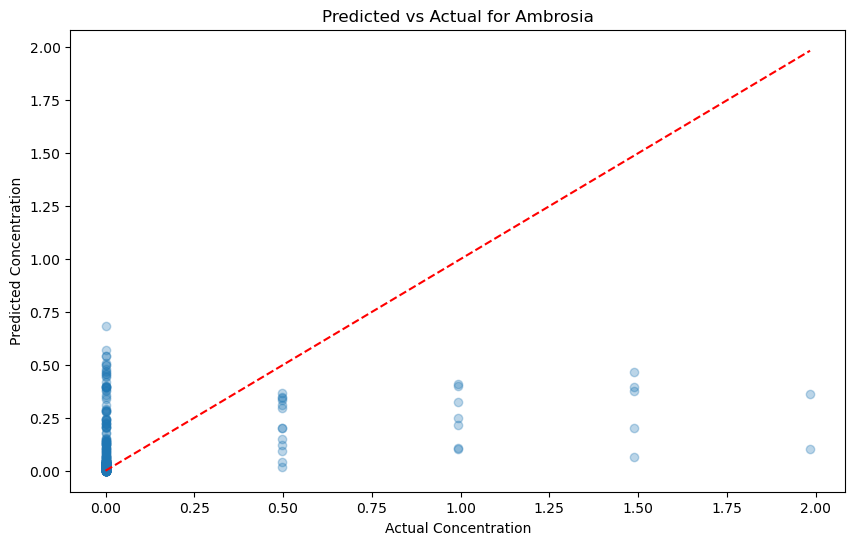

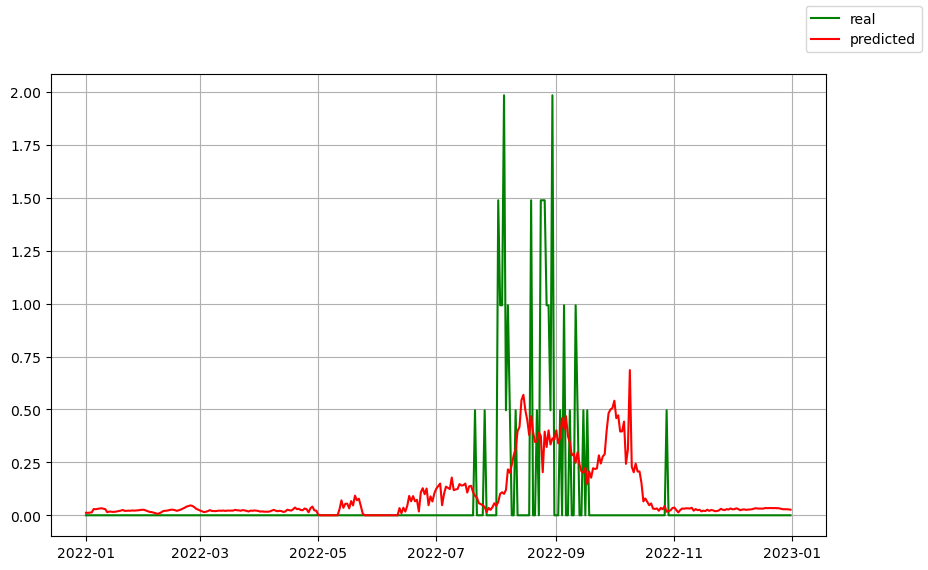

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.631e+02, tolerance: 3.209e+01
  model = cd_fast.enet_coordinate_descent(


Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': 1000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
Taxon: Artemisia
Tuned R² Score: 0.1588
Tuned Mean Squared Error: 34.9219

[('Artemisia_trend7', 0.29633205417155883), ('Artemisia_lag7', 0.21707940900558845), ('Ambrosia_sum7', 0.12893084239129218), ('year', 0.08786186001605154), ('Ambrosia_trend7', -0.08718630778231963), ('temp_max_trend7', -0.05517328059808798), ('Olea europaea_sum7', -0.041744158052820134), ('temp_max_sum7', 0.023325899956143405), ('temp_min_sum7', 0.020450569518835372), ('temp_mean_trend7', -0.016067450601471366), ('temp_mean_sum7', -0.01546696513526112), ('Artemisia_sum7', -0.008599961991358067), ('Poaceae_lag7', -0.005743603692189118), ('precipitation_trend7', 0.004125334375886432), ('day', 0.003821255092209433), ('Urticaceae_sum7', 0.003654310721442105), ('Poaceae_sum7', -0.0022085962292736684), ('Urtica

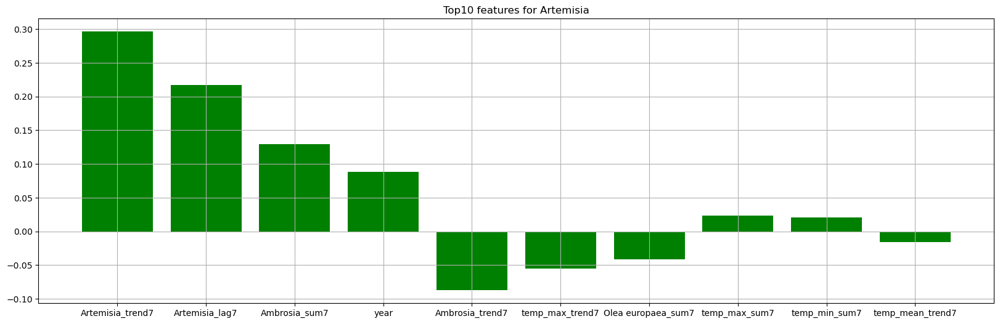

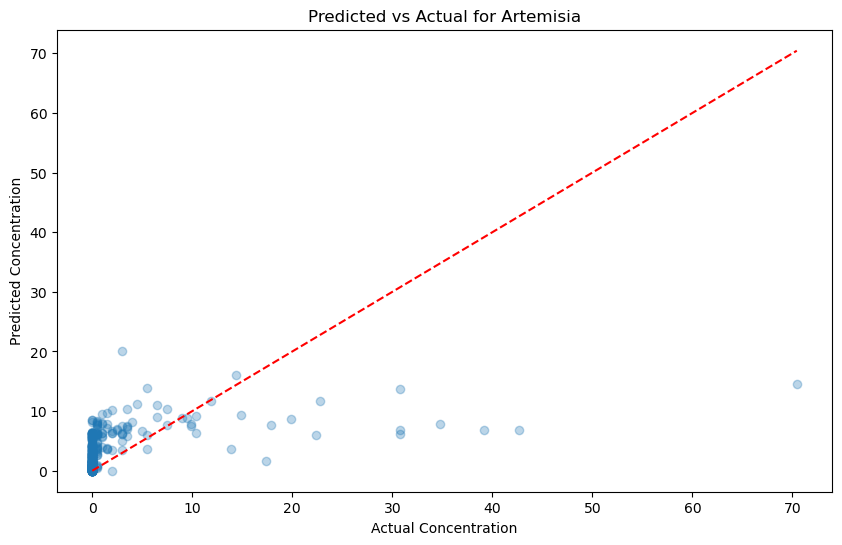

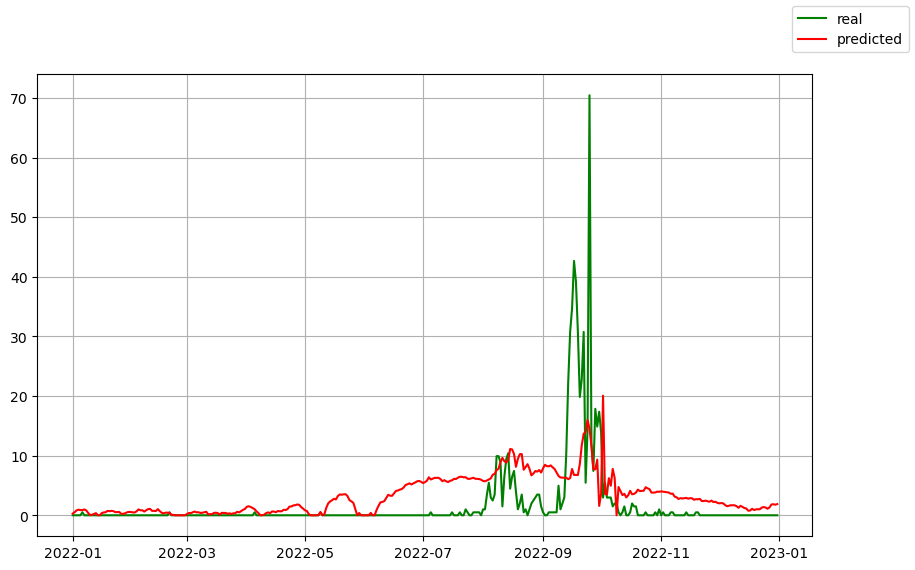

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.054e+03, tolerance: 4.158e+01
  model = cd_fast.enet_coordinate_descent(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.544e+02, tolerance: 4.233e+02
  model = cd_fast.enet_coordinate_descent(


Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': 1000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
Taxon: Betula
Tuned R² Score: 0.4128
Tuned Mean Squared Error: 336.7634

[('Betula_lag7', 0.2654801364483672), ('Betula_trend7', 0.2645483042431547), ('temp_mean_trend7', -0.047365907795612686), ('temp_mean_sum7', 0.044795443282885955), ('Cupressaceae, Taxaceae_lag7', 0.04288451500415271), ('temp_min_sum7', -0.0410517772908532), ('Fraxinus_trend7', -0.03869522293144536), ('Fraxinus_lag7', -0.03856223227150139), ('Betula_sum7', 0.03029614950444411), ('Cupressaceae, Taxaceae_trend7', -0.021960616577785457), ('precipitation_sum7', 0.019354287014826603), ('day', -0.016181309334895214), ('Corylus_lag7', -0.015789109116696072), ('Corylus_sum7', -0.015688490619336266), ('Cupressaceae, Taxaceae_sum7', 0.014893967185715723), ('precipitation', 0.013983791204227223), ('Olea europaea_sum7',

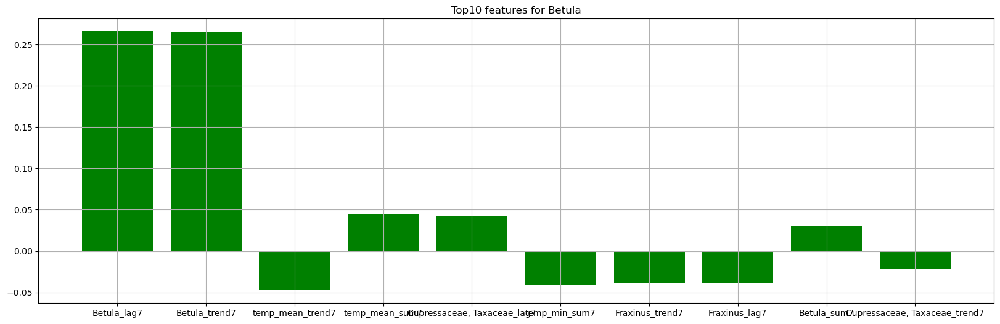

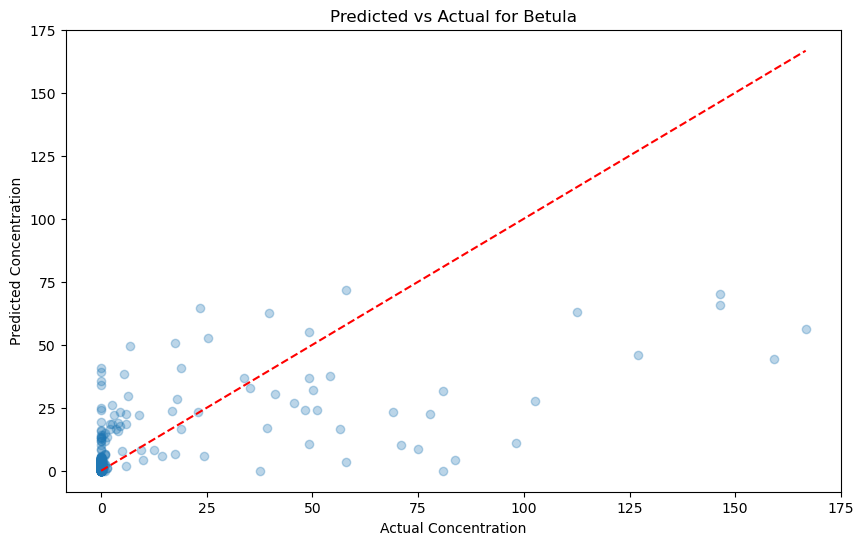

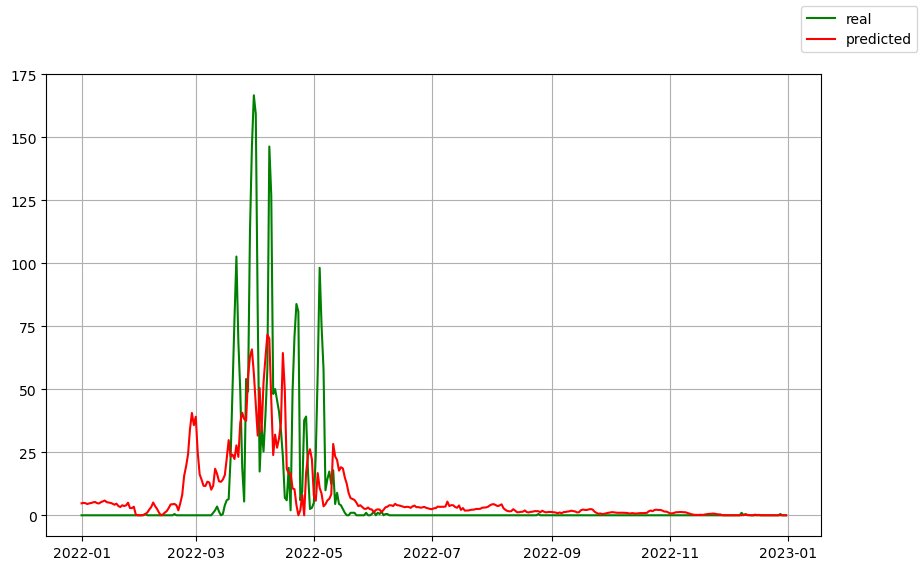

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.428e+02, tolerance: 4.599e+01
  model = cd_fast.enet_coordinate_descent(


Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': 1000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
Taxon: Corylus
Tuned R² Score: 0.4172
Tuned Mean Squared Error: 186.1381

[('Corylus_lag7', 0.18426820292995172), ('temp_max_trend7', 0.15922176678674624), ('Corylus_trend7', 0.13932662530533058), ('temp_mean_sum7', -0.08170890810026528), ('year', 0.06369349180863285), ('day', -0.03915704440824617), ('Corylus_sum7', 0.034519855051016575), ('temp_max_sum7', 0.030730332650963834), ('temp_min_trend7', 0.02635561426973762), ('precipitation_lag7', -0.026225413873725012), ('Cupressaceae, Taxaceae_sum7', -0.010606019113039369), ('Betula_lag7', -0.010078966455093458), ('Olea europaea_sum7', -0.009948063651749543), ('Cupressaceae, Taxaceae_lag7', -0.008396952294704553), ('Betula_trend7', -0.005864713604061667), ('Poaceae_lag7', -0.005306808245223533), ('Urticaceae_trend7', -0.00511321586

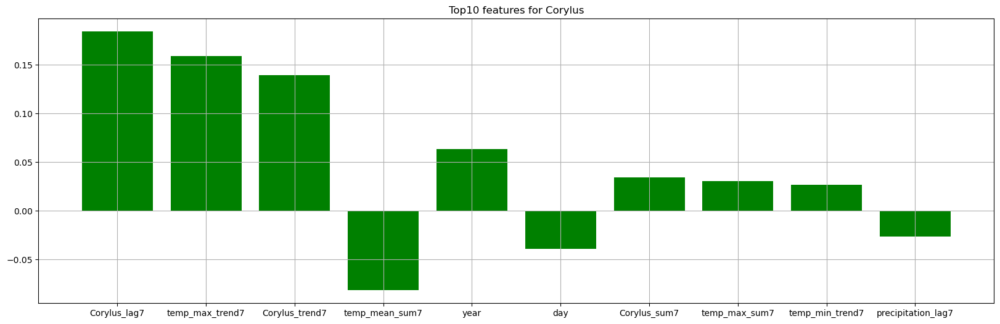

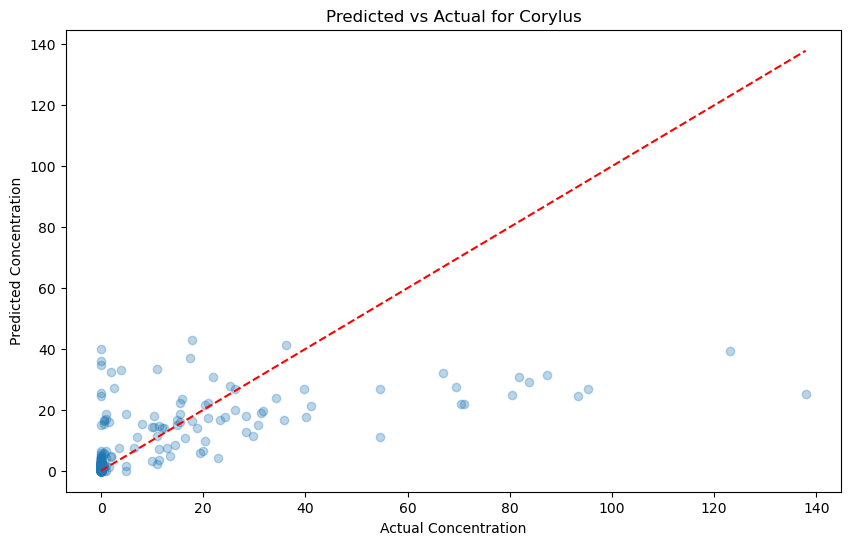

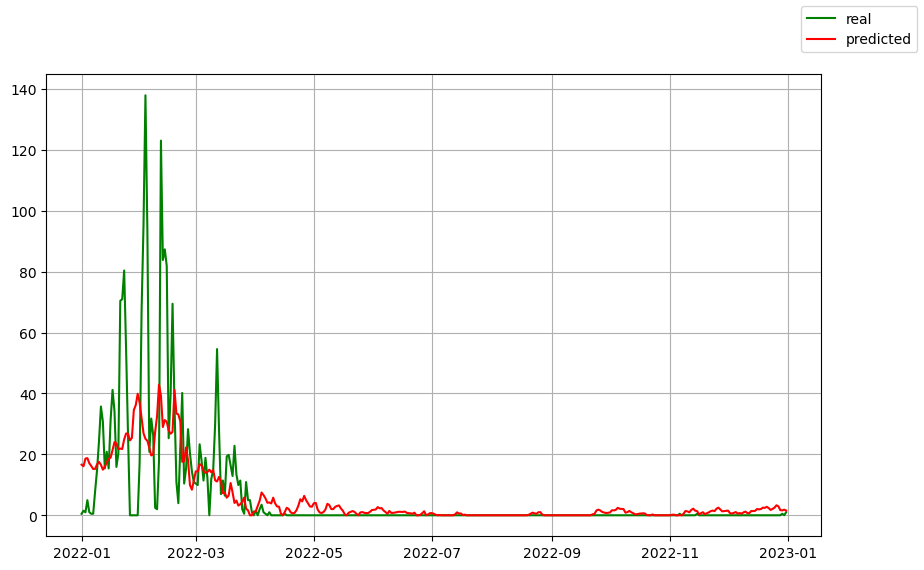

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.054e+04, tolerance: 4.701e+02
  model = cd_fast.enet_coordinate_descent(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.463e+04, tolerance: 7.693e+02
  model = cd_fast.enet_coordinate_descent(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': 1000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
Taxon: Cupressaceae, Taxaceae
Tuned R² Score: 0.3443
Tuned Mean Squared Error: 2223.5844

[('Corylus_lag7', 0.22004181408771534), ('Cupressaceae, Taxaceae_trend7', 0.21287589841063484), ('Cupressaceae, Taxaceae_lag7', 0.19781149713653606), ('temp_max_trend7', 0.16247992667208094), ('Betula_trend7', -0.1474779887398412), ('temp_min_trend7', 0.13533871599775354), ('Betula_lag7', -0.13319055206746164), ('year', 0.13084383647398123), ('temp_min_sum7', -0.12235221332417122), ('Corylus_sum7', 0.0718998366576797), ('temp_max_sum7', 0.05383999210775814), ('day', -0.044424811217365655), ('precipitation_sum7', 0.04160804830784132), ('temp_max', 0.030437090770227833), ('Cupressaceae, Taxaceae_sum7', 0.02915529839892892), ('Olea europaea_sum7', -0.014299120690580746), ('Ostrya carpinifolia_

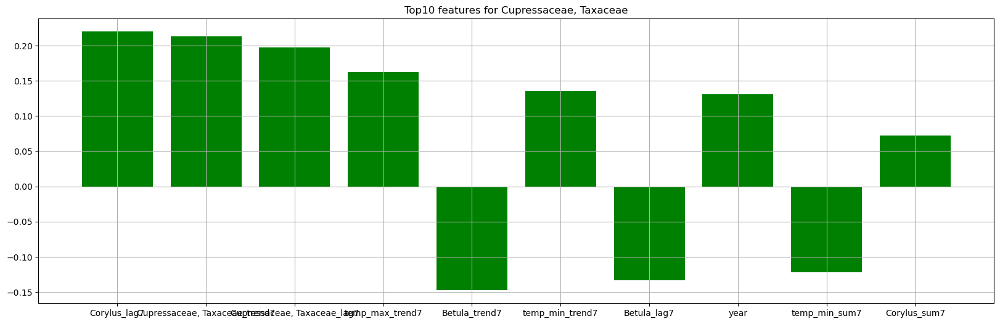

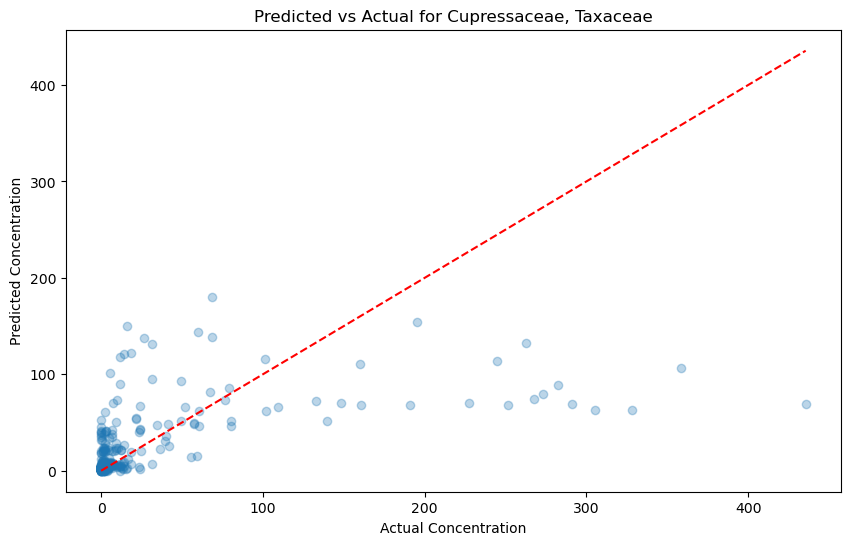

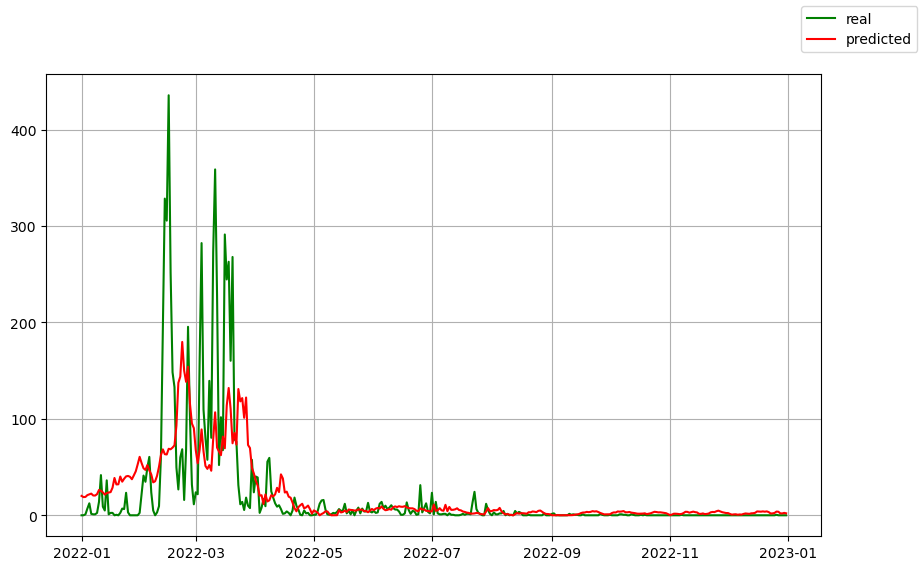

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.235e+02, tolerance: 1.922e+02
  model = cd_fast.enet_coordinate_descent(


Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': 1000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
Taxon: Fraxinus
Tuned R² Score: 0.2230
Tuned Mean Squared Error: 2001.2403

[('Fraxinus_lag7', 0.35270423033674164), ('Betula_lag7', 0.3249515210808439), ('Fraxinus_trend7', 0.3010058294819986), ('temp_max_trend7', 0.15150855148533865), ('Betula_trend7', 0.14131682347544391), ('temp_mean_trend7', -0.12820474587722377), ('precipitation_lag7', 0.08763603531716554), ('Ostrya carpinifolia_trend7', 0.08170974418375662), ('temp_min_lag7', -0.07739973717031357), ('Betula_sum7', -0.07026595837811642), ('precipitation_sum7', 0.055285521637745624), ('temp_max_sum7', 0.04375185212928654), ('Poaceae_lag7', -0.039821014087613356), ('Poaceae_trend7', -0.03677291161529075), ('Ostrya carpinifolia_lag7', 0.03618057123243368), ('year', 0.034458100769744184), ('temp_min_sum7', -0.02743718870142203

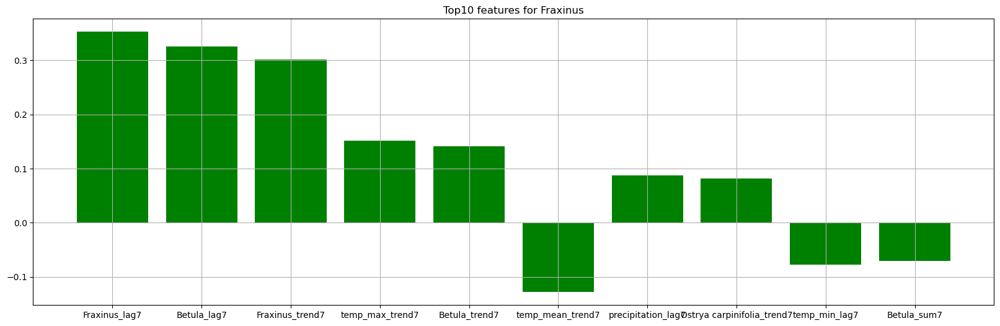

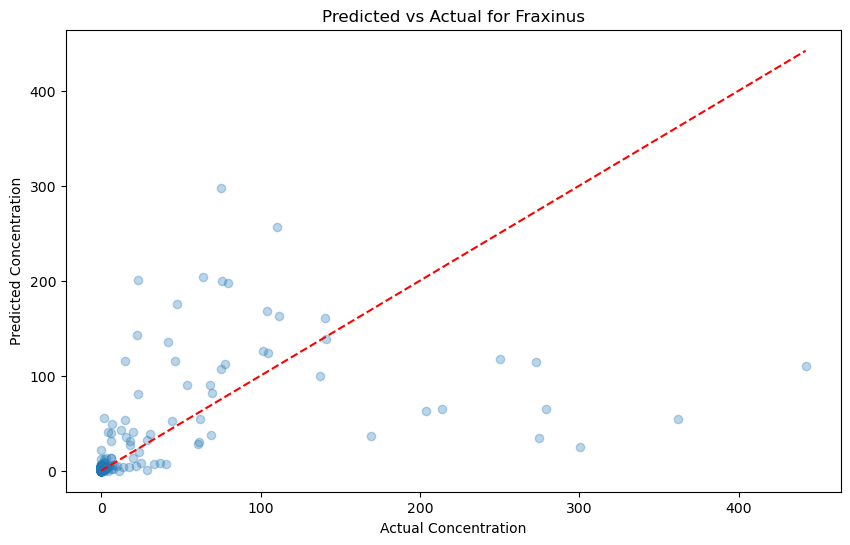

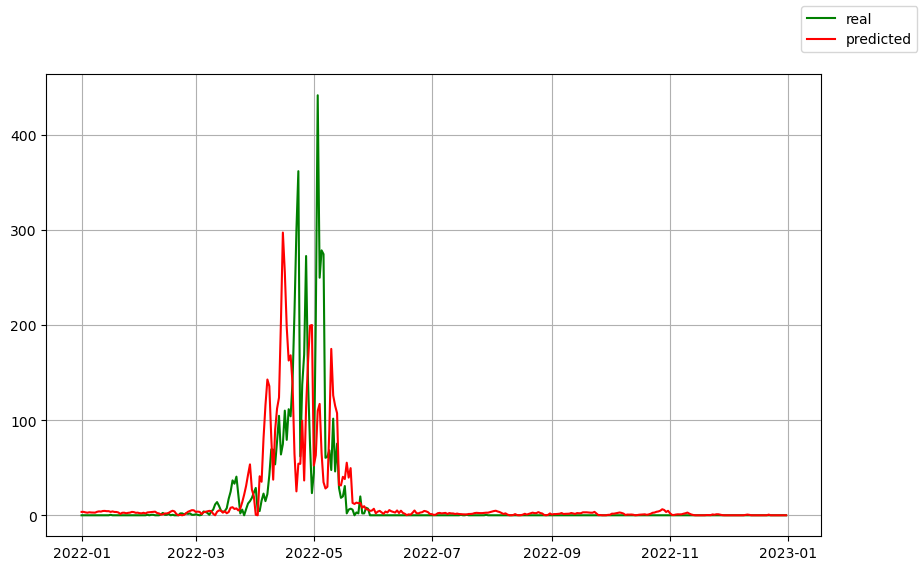

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'alpha': 0.1, 'copy_X': True, 'fit_intercept': True, 'max_iter': 1000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
Taxon: Olea europaea
Tuned R² Score: 0.2317
Tuned Mean Squared Error: 8.4870

[('Olea europaea_trend7', 0.4291453884939813), ('Olea europaea_lag7', 0.3693579469861771), ('year', 0.02273326158368801), ('Ambrosia_sum7', -0.018252863106870645), ('Olea europaea_sum7', -0.013151283958652109), ('temp_mean_sum7', 0.011777862628492631), ('temp_min_sum7', -0.005618042199975043), ('precipitation', -0.00351511987410877), ('Artemisia_lag7', -0.002758045419934809), ('day', -0.0017884443054129067), ('Artemisia_sum7', -0.0016580691680653128), ('temp_max_sum7', -0.001396146731476899), ('Artemisia_trend7', -0.0013190071224925424), ('temp_max_trend7', 0.0012208536991549503), ('Poaceae_lag7', 0.0012039914417222534), ('Fraxinus_lag7', 0.00

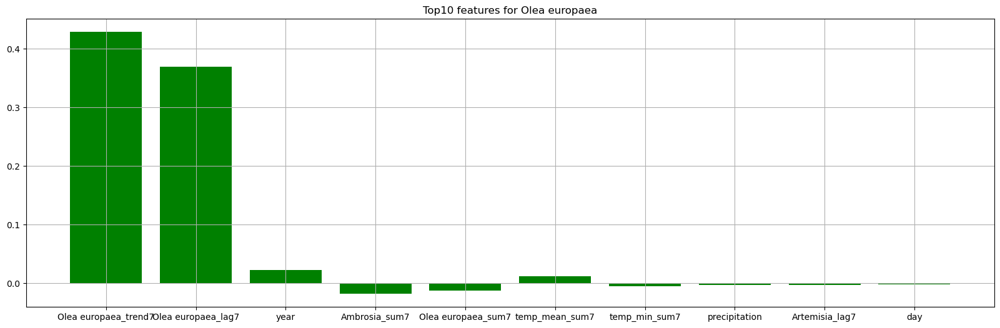

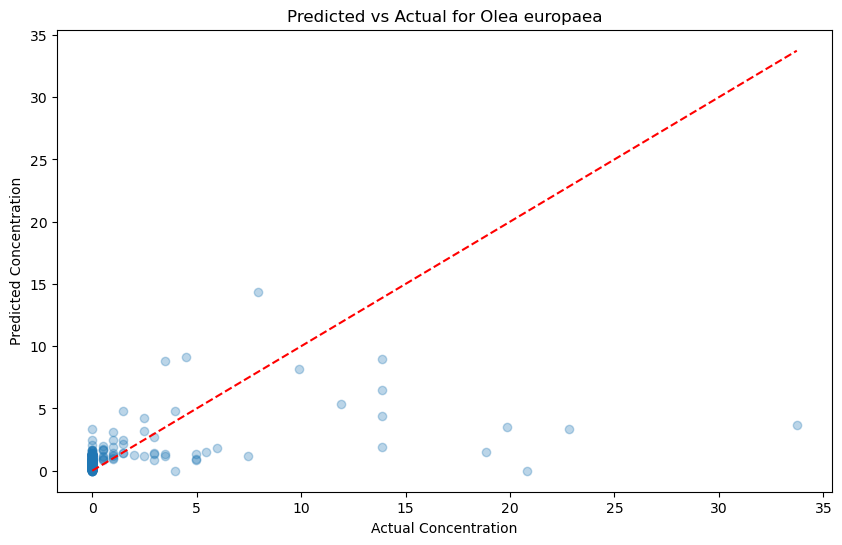

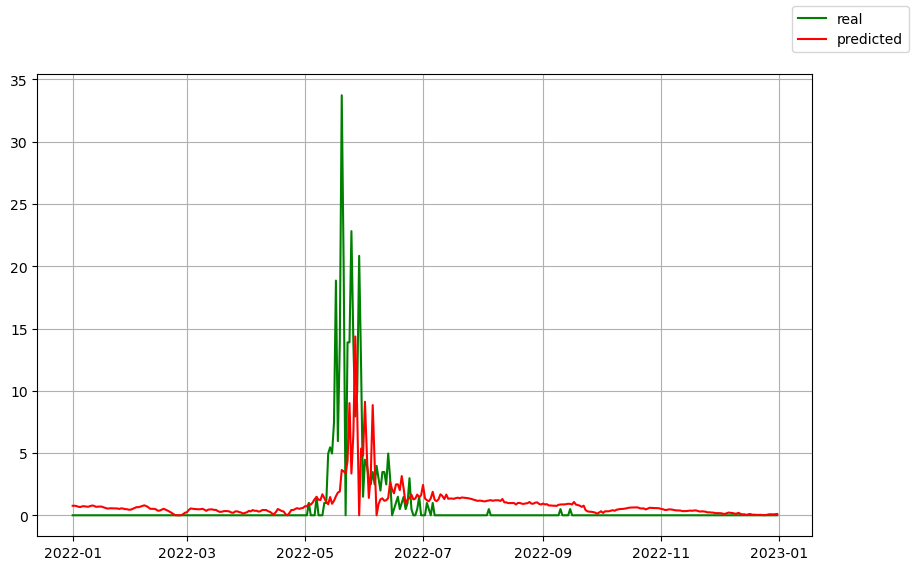

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.509e+03, tolerance: 2.147e+03
  model = cd_fast.enet_coordinate_descent(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.289e+06, tolerance: 2.147e+03
  model = cd_fast.enet_coordinate_descent(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': 1000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
Taxon: Ostrya carpinifolia
Tuned R² Score: 0.4818
Tuned Mean Squared Error: 35127.1649

[('temp_mean_trend7', -3.5316016807104322), ('temp_max_trend7', 1.880990582192656), ('temp_min_trend7', 1.7317746094261555), ('temp_max', 1.661350302126576), ('temp_mean_sum7', 0.9065851297104326), ('Betula_trend7', 0.8743918403177184), ('temp_max_sum7', -0.8216339457606152), ('Betula_lag7', 0.7707286306497846), ('Fraxinus_trend7', -0.5235625008603694), ('temp_min', 0.496790333791915), ('Fraxinus_lag7', -0.4753575388365019), ('Betula_sum7', 0.3746219560343379), ('Ostrya carpinifolia_trend7', 0.36977604523936), ('Ostrya carpinifolia_lag7', 0.35331065324931243), ('temp_min_sum7', -0.27572469380820847), ('Cupressaceae, Taxaceae_trend7', -0.25819566538883604), ('year', -0.1742752178008647), ('Ole

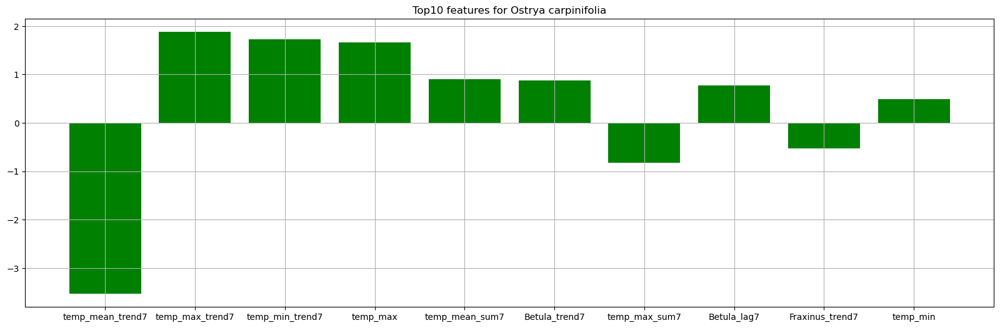

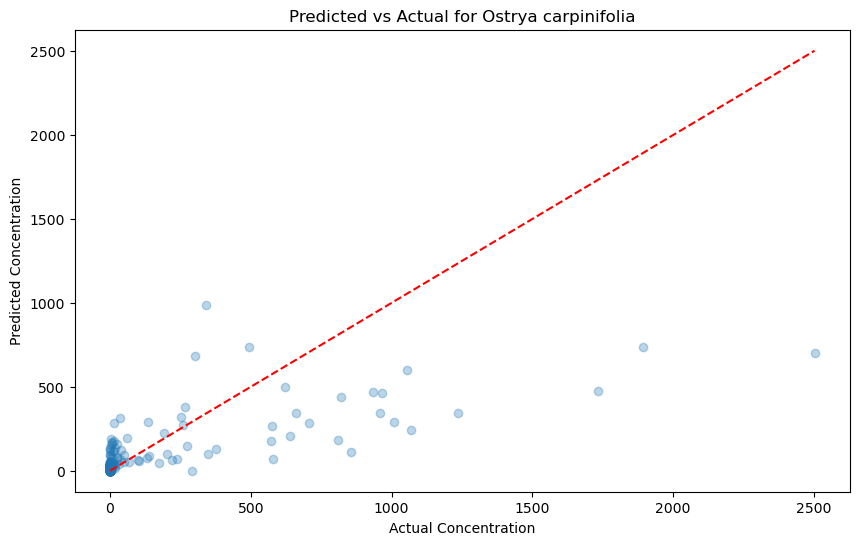

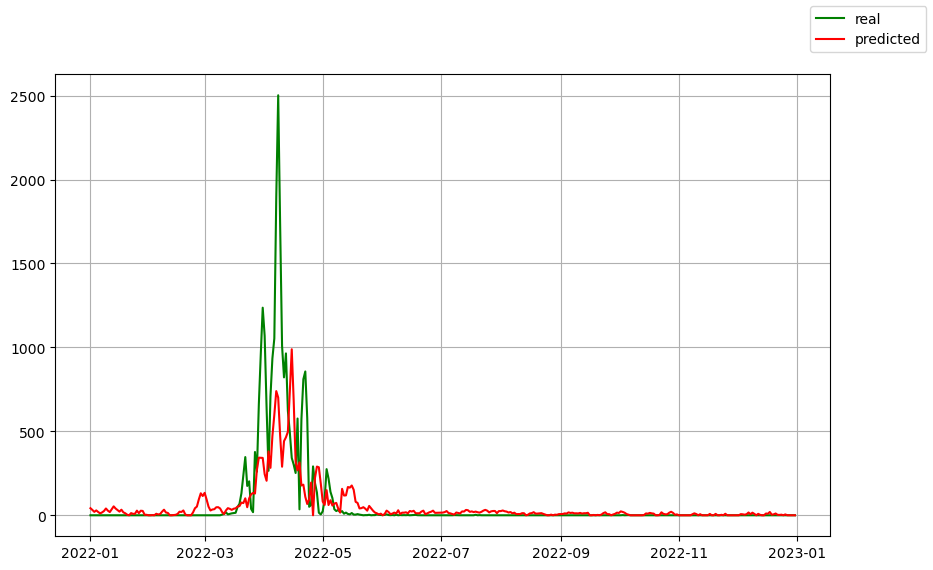

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.579e+03, tolerance: 1.379e+03
  model = cd_fast.enet_coordinate_descent(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.682e+06, tolerance: 1.379e+03
  model = cd_fast.enet_coordinate_descent(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': 1000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
Taxon: Poaceae
Tuned R² Score: 0.4033
Tuned Mean Squared Error: 753.5633

[('month', -1.2712790095829098), ('temp_min_trend7', 0.47581339854839577), ('year', -0.334540314383858), ('Poaceae_trend7', 0.29597166625144267), ('Poaceae_lag7', 0.29170177386766233), ('Ambrosia_sum7', -0.23421174117240154), ('temp_min_sum7', -0.2328006967136664), ('temp_mean_sum7', 0.22676500881294281), ('temp_max_lag7', -0.1888822745481026), ('temp_max_sum7', 0.15280337629896779), ('temp_min_lag7', -0.1425382848066939), ('Olea europaea_sum7', 0.09582144102619777), ('Betula_lag7', -0.042967304430144265), ('Fraxinus_trend7', 0.04231750606955979), ('Betula_trend7', -0.040866248099658914), ('Urticaceae_lag7', -0.03447070791154972), ('Corylus_lag7', -0.033802526926474376), ('Corylus_trend7', -0.0320008034949

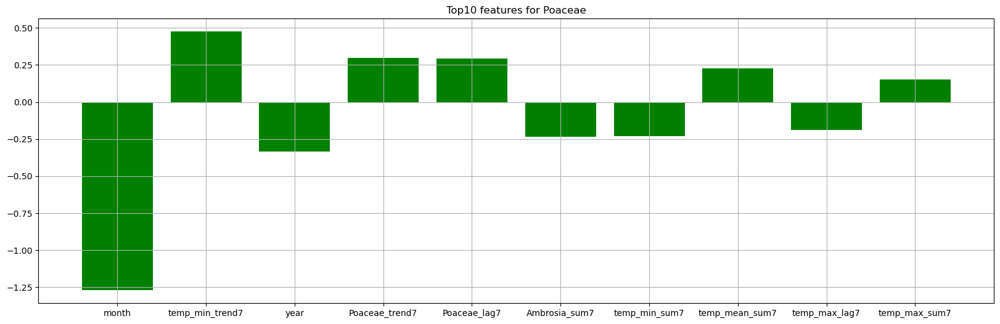

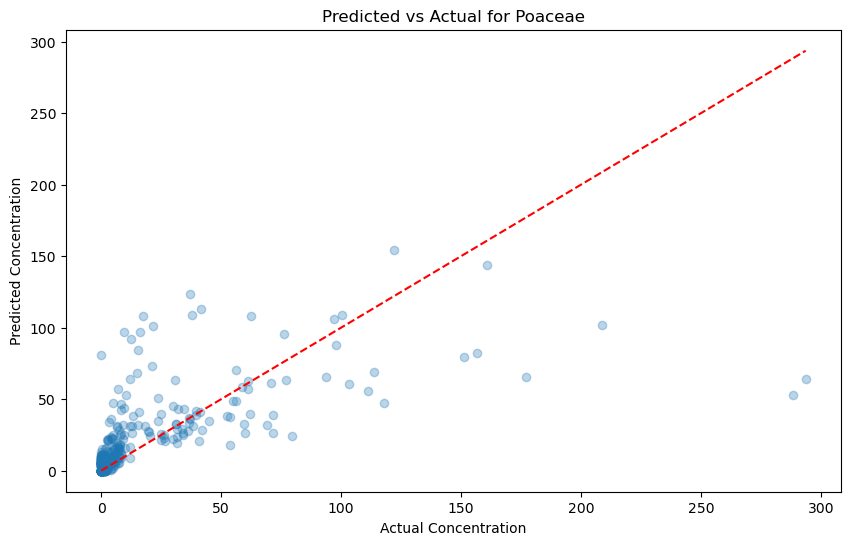

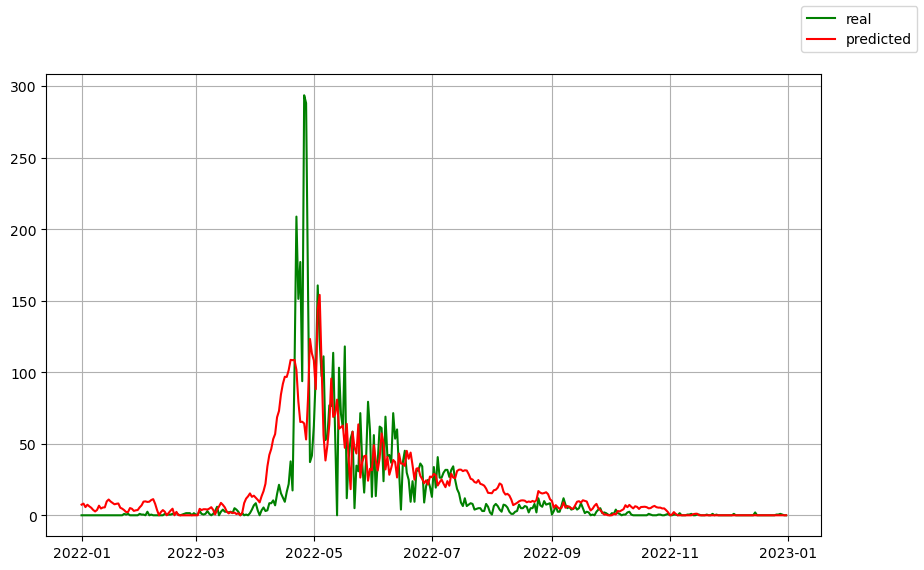

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.699e+03, tolerance: 1.340e+03
  model = cd_fast.enet_coordinate_descent(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.503e+06, tolerance: 1.340e+03
  model = cd_fast.enet_coordinate_descent(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

Best parameters:  {'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': 1000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}
Taxon: Urticaceae
Tuned R² Score: 0.5445
Tuned Mean Squared Error: 509.7708

[('temp_mean_trend7', -1.4645507910884337), ('Ambrosia_sum7', -1.241290463497246), ('temp_max_lag7', 0.7216367958341275), ('temp_min', 0.6533557211139505), ('precipitation_lag7', 0.41695980089849227), ('Urticaceae_trend7', 0.3806513531684865), ('Urticaceae_lag7', 0.3570304870466769), ('Artemisia_trend7', 0.23096157056059335), ('Ambrosia_lag7', -0.2302345873258387), ('precipitation_sum7', 0.224142434906717), ('temp_max', 0.20220351733436792), ('temp_mean_lag7', 0.17394835220714125), ('temp_max_sum7', 0.13058077895157688), ('temp_mean_sum7', -0.09903956703392267), ('year', -0.08005515508363857), ('Olea europaea_sum7', -0.07187027066869203), ('Olea europaea_trend7', -0.07144711121743023), ('day', -0.054176

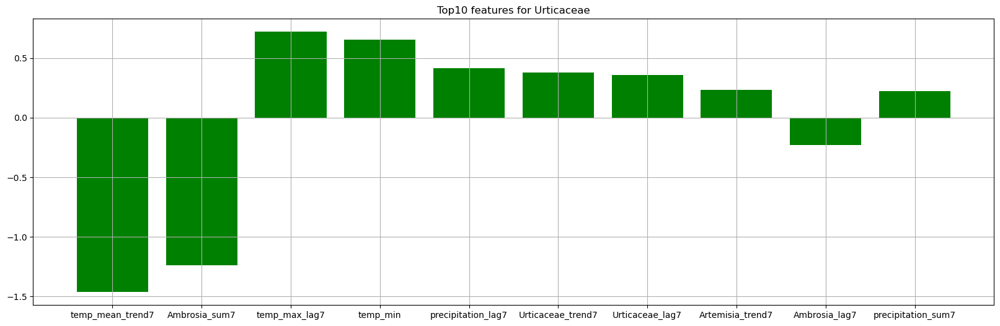

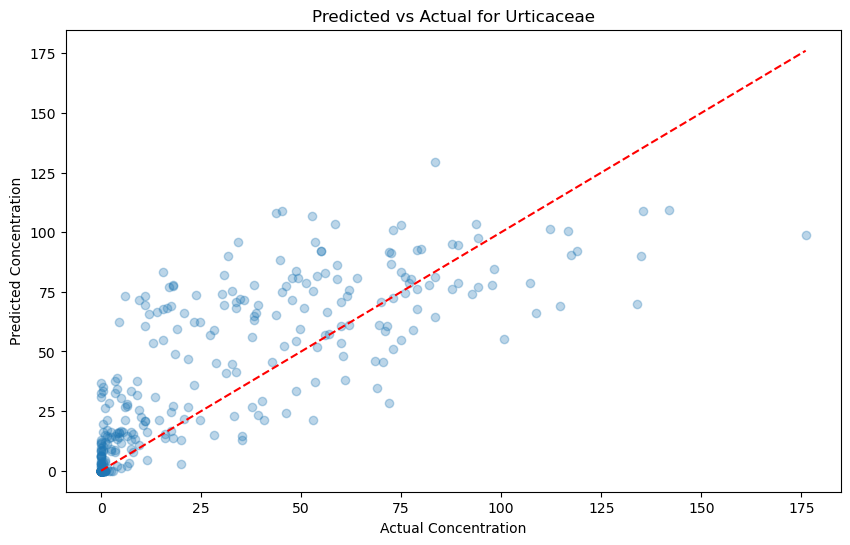

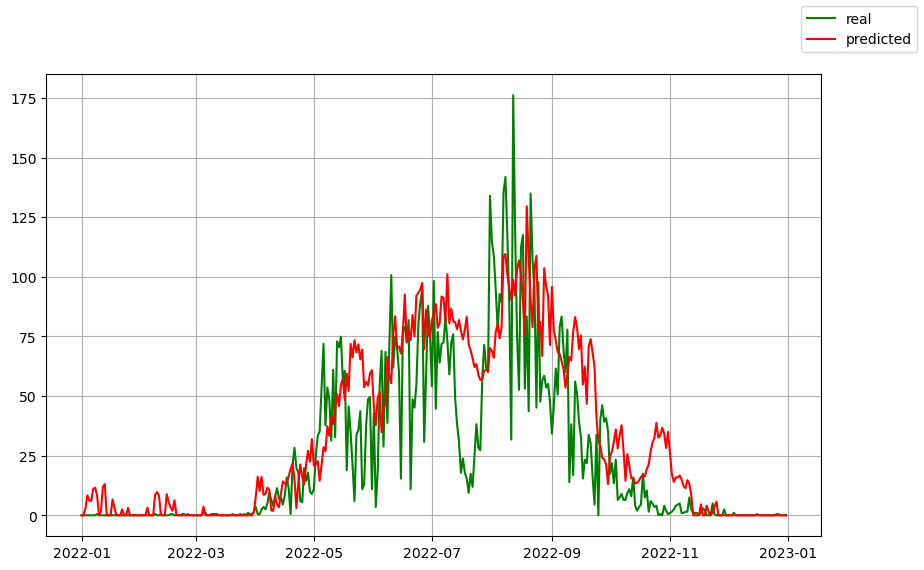

In [7]:
from sklearn.linear_model import Lasso  

# Parameters to choose 
param_grid = {
    "alpha": [1.0, 0.5, 0.1]
}

reg = Lasso() 
lasso_results = {}

# Show best model results for each taxon 
for taxon, best_model in train_model(reg, train_data, features, taxa, param_grid):
    # Extract test data for a specific taxon 
    X_test, y_test = extract_xy(test_data, features, taxon) 

    print("Best parameters: ", best_model.get_params())
    y_pred = best_model.predict(X_test).clip(0) # Negative values are non-sense
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    print(f"Taxon: {taxon}")
    print(f"Tuned R² Score: {r2:.4f}") #Higher is better; measure of how well the model explains variance in the test data
    print(f"Tuned Mean Squared Error: {mse:.4f}\n") #Lower is better; Average squared difference between predicted and actual values 
        
    # Bar plot coefficients  
    coefficients = {col:coef for col, coef in zip(features, best_model.coef_)} 
    # Order based on absolute value (descending) 
    sorted_coeff = list(sorted(coefficients.items(), key=lambda item: abs(item[1]), reverse=True))
    print(sorted_coeff)
    sorted_coeff = sorted_coeff[:10] # Top10
    
    fig, ax = plt.subplots(figsize=(20,6)) 
    ax.set_title(f"Top10 features for {taxon}") 
    ax.bar([item[0] for item in sorted_coeff], [item[1] for item in sorted_coeff], color='green', label='real')
    ax.grid()  
    plt.show() 
    plt.close(fig) 


    plot_pred(y_test, y_pred, test_data['datetime'], taxon)

    # Save the achieved score for this taxon 
    lasso_results[taxon] = r2 

# Store the achieved results in a global results table 
results['lasso'] = lasso_results 

# Linear Support Vector Machines 

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/

Best parameters:  {'C': 1.0, 'dual': 'auto', 'epsilon': 0.0, 'fit_intercept': True, 'intercept_scaling': 1.0, 'loss': 'epsilon_insensitive', 'max_iter': 1000, 'random_state': None, 'tol': 0.0001, 'verbose': 0}
Taxon: Ambrosia
Tuned R² Score: 0.0719
Tuned Mean Squared Error: 0.0695

[('Ambrosia_trend7', 0.04201675893852189), ('Ambrosia_sum7', 0.033130096259187836), ('Ambrosia_lag7', 0.01842936561252515), ('Olea europaea_lag7', -0.008246402756667387), ('temp_max', 0.006261539063534081), ('temp_max_lag7', 0.005600329032102413), ('Artemisia_lag7', 0.005246811523216361), ('Olea europaea_trend7', -0.004325712884953622), ('temp_min_lag7', 0.003708291793206004), ('temp_mean_sum7', -0.0033439195579901774), ('month', -0.002797364425883748), ('temp_min', 0.0026841363098942046), ('Urticaceae_lag7', 0.0025241190849871293), ('temp_mean_trend7', -0.0019934341102244117), ('temp_min_sum7', 0.0015174223260943434), ('temp_mean_lag7', 0.0014361013423072725), ('temp_min_trend7', -0.0010241554833110935), ('

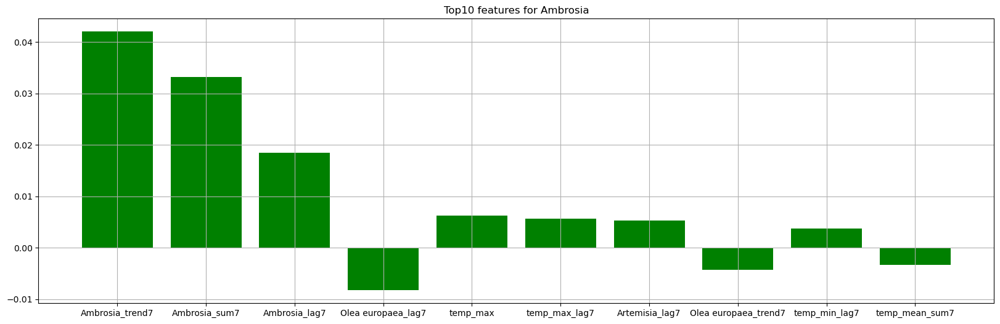

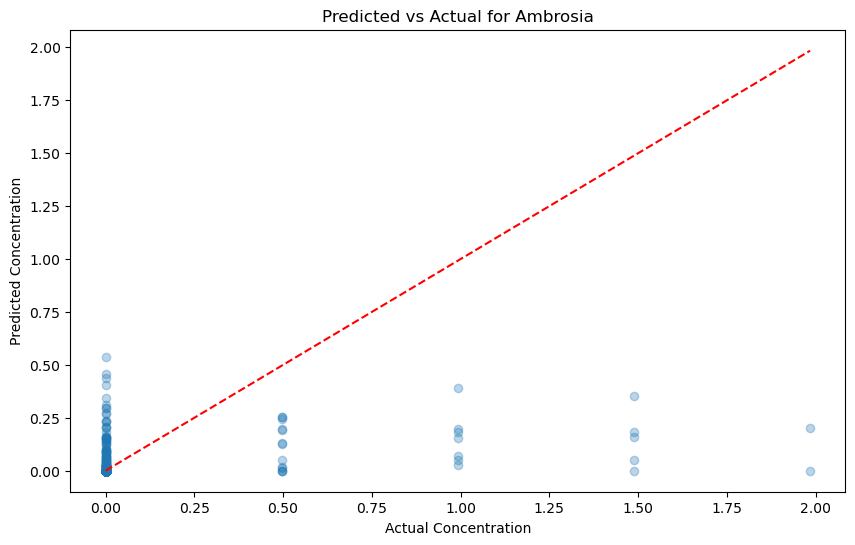

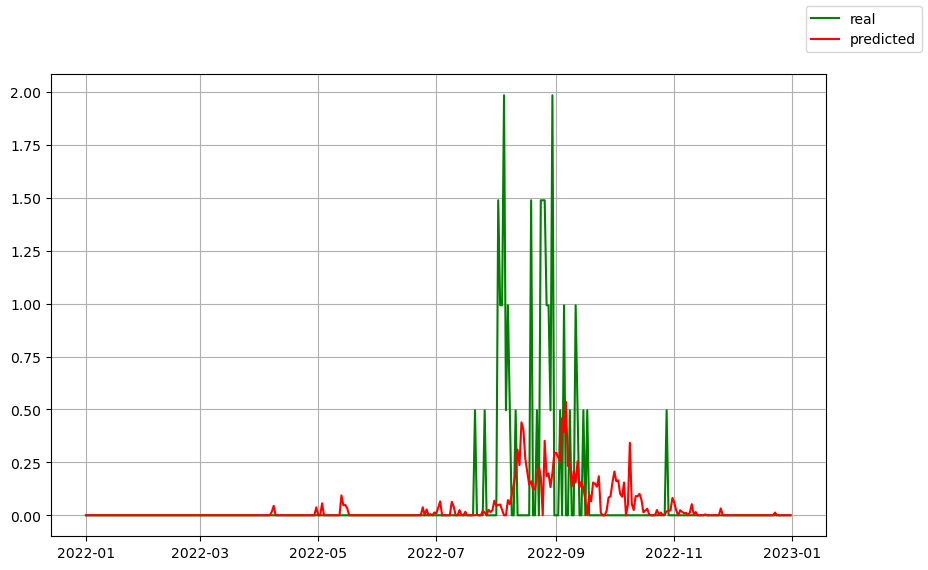

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/

Best parameters:  {'C': 2.0, 'dual': 'auto', 'epsilon': 0.0, 'fit_intercept': True, 'intercept_scaling': 1.0, 'loss': 'epsilon_insensitive', 'max_iter': 1000, 'random_state': None, 'tol': 0.0001, 'verbose': 0}
Taxon: Artemisia
Tuned R² Score: 0.2073
Tuned Mean Squared Error: 32.9084

[('Ambrosia_trend7', -0.5533044972627772), ('Ambrosia_lag7', 0.433567734031902), ('Artemisia_trend7', 0.3238311130860761), ('month', 0.32024844893627574), ('Artemisia_lag7', 0.2758803786491766), ('Ambrosia_sum7', 0.1757824625795153), ('Olea europaea_lag7', -0.09627971220506133), ('temp_mean_trend7', -0.08282259641186059), ('temp_max_lag7', 0.06024494221403658), ('temp_mean_lag7', 0.054305510094163956), ('temp_min_lag7', -0.04202537155121517), ('temp_min_trend7', 0.03928526685752697), ('temp_max_trend7', -0.03439960772797139), ('temp_mean', -0.02851708631770229), ('temp_max_sum7', 0.026273490464746866), ('temp_max', 0.02584533448605457), ('Olea europaea_trend7', -0.024998960376631515), ('Olea europaea_sum7'

/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


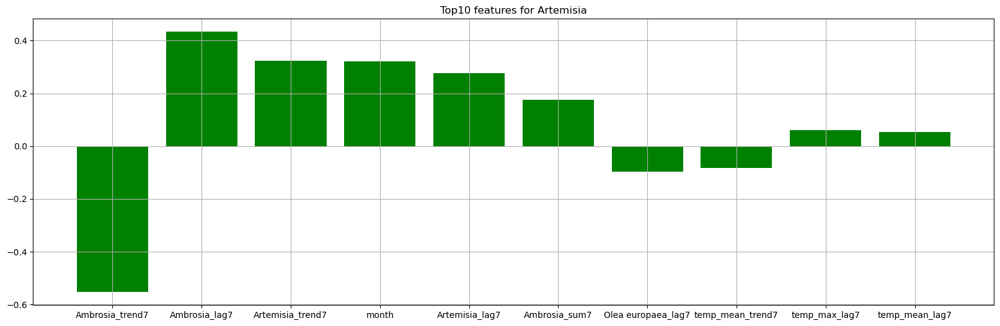

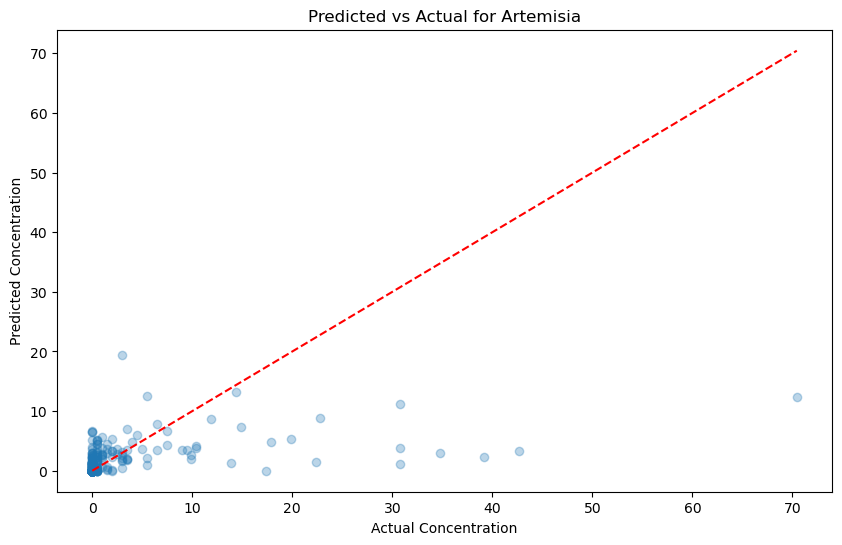

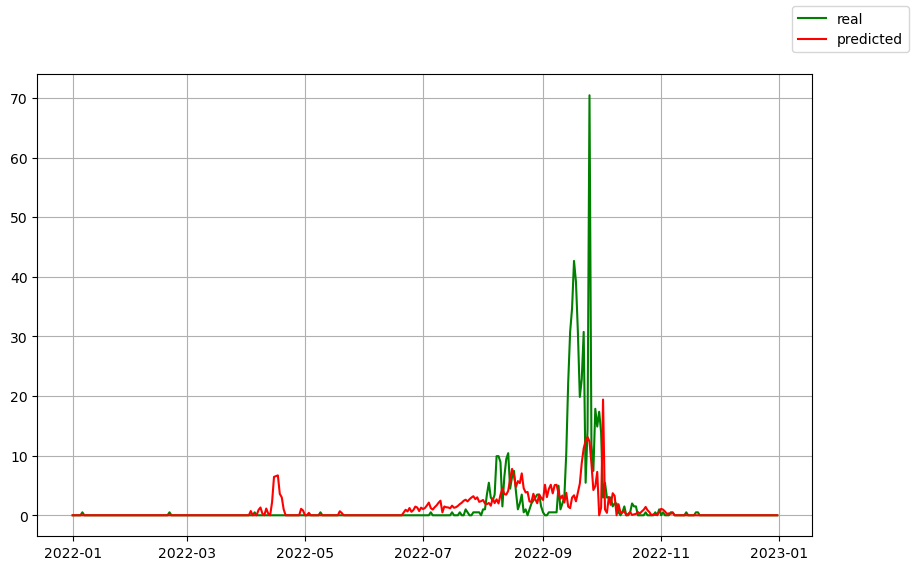

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/

Best parameters:  {'C': 0.5, 'dual': 'auto', 'epsilon': 0.0, 'fit_intercept': True, 'intercept_scaling': 1.0, 'loss': 'epsilon_insensitive', 'max_iter': 1000, 'random_state': None, 'tol': 0.0001, 'verbose': 0}
Taxon: Betula
Tuned R² Score: 0.2544
Tuned Mean Squared Error: 427.6162

[('month', -0.5722002077809455), ('temp_mean_trend7', -0.31546403262751666), ('Betula_lag7', 0.27164248999093454), ('temp_max', 0.2650897785680757), ('Betula_trend7', 0.247612380321908), ('temp_mean', -0.2190785862601022), ('temp_min_trend7', 0.19398357972782385), ('temp_min_lag7', -0.1867176088599549), ('temp_max_lag7', 0.15965305764184481), ('temp_mean_sum7', 0.11193510283694418), ('temp_max_trend7', 0.10543672092632053), ('temp_mean_lag7', 0.09638544636743449), ('temp_max_sum7', -0.08444039983607624), ('Ambrosia_trend7', 0.07157809332946068), ('Betula_sum7', 0.06847833730612754), ('Cupressaceae, Taxaceae_lag7', 0.0437612816881726), ('Fraxinus_trend7', -0.042748152670938934), ('temp_min_sum7', -0.039272082

/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


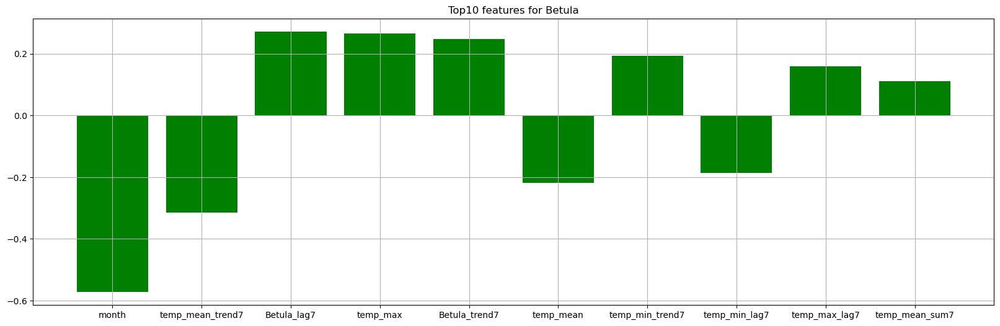

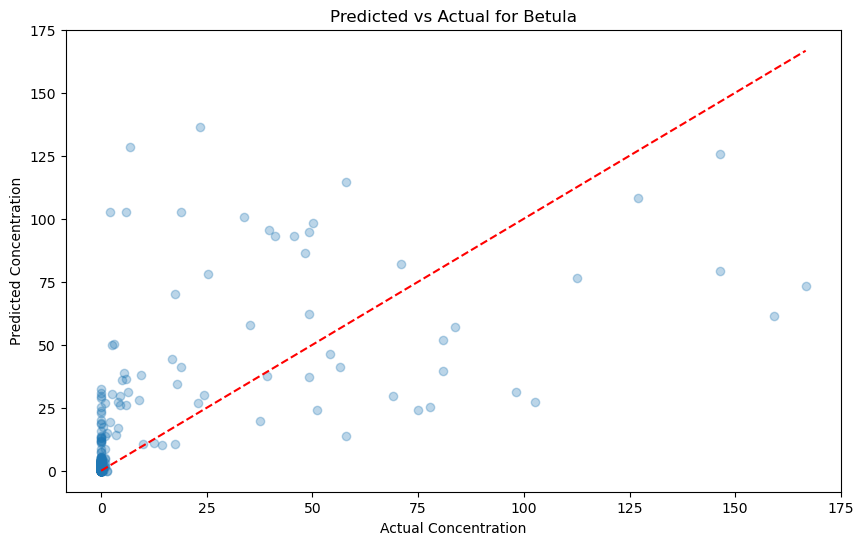

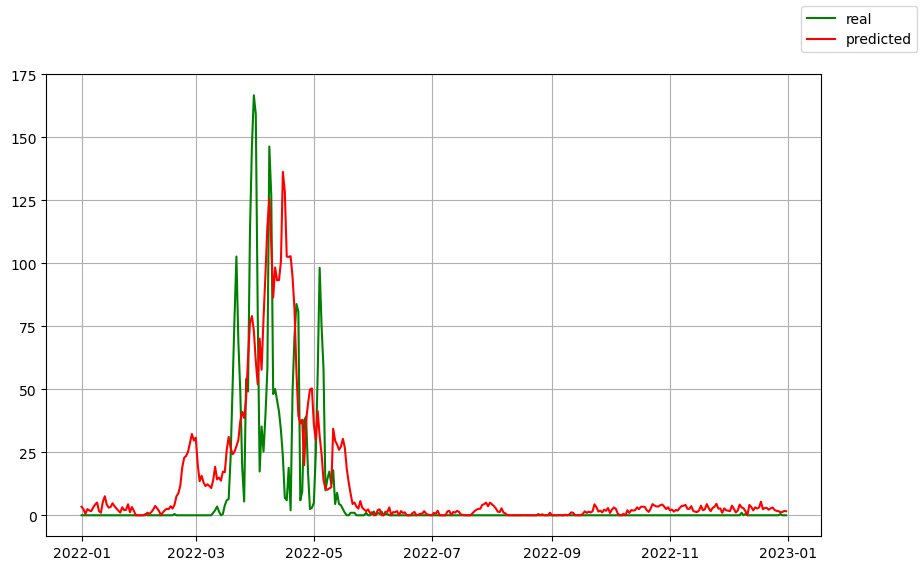

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/

Best parameters:  {'C': 2.0, 'dual': 'auto', 'epsilon': 0.0, 'fit_intercept': True, 'intercept_scaling': 1.0, 'loss': 'epsilon_insensitive', 'max_iter': 1000, 'random_state': None, 'tol': 0.0001, 'verbose': 0}
Taxon: Corylus
Tuned R² Score: 0.3882
Tuned Mean Squared Error: 195.4033

[('Corylus_lag7', 0.19965513563202814), ('temp_max_trend7', 0.19743388468893286), ('temp_max', 0.17572115967758767), ('temp_min', 0.1693228499097378), ('Corylus_trend7', 0.15249627362742535), ('temp_mean', -0.1370568494741297), ('temp_min_trend7', 0.115499930602769), ('temp_mean_lag7', -0.08631836598112104), ('temp_min_sum7', -0.06739970269057126), ('temp_min_lag7', 0.05382291930692829), ('temp_mean_trend7', -0.05073848349297973), ('Olea europaea_trend7', -0.05019272424248302), ('month', -0.048341665043318854), ('Betula_lag7', -0.04762453691802369), ('Corylus_sum7', 0.0469200656607564), ('day', -0.04609778752462509), ('precipitation_lag7', -0.04089950029051635), ('Betula_trend7', -0.03491941135310823), ('pr

/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


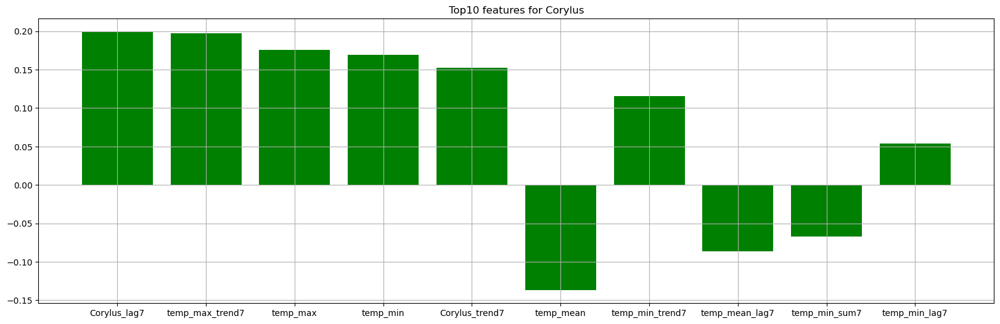

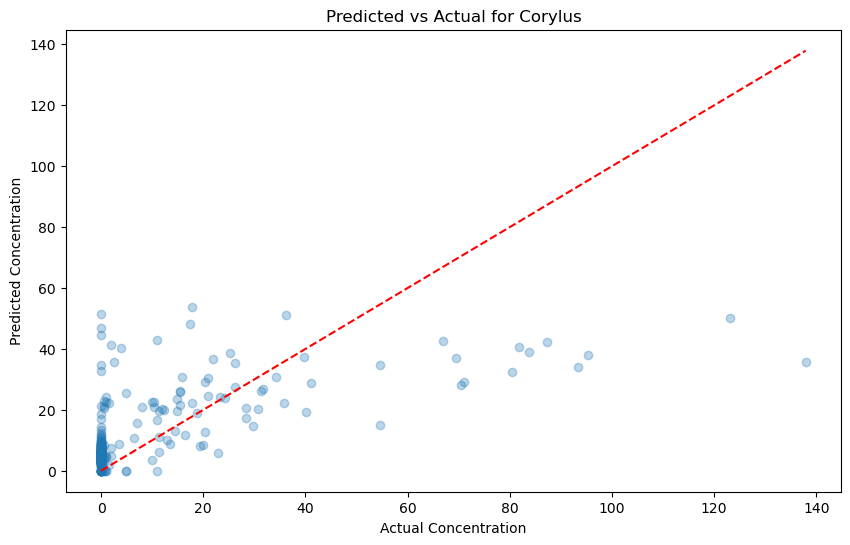

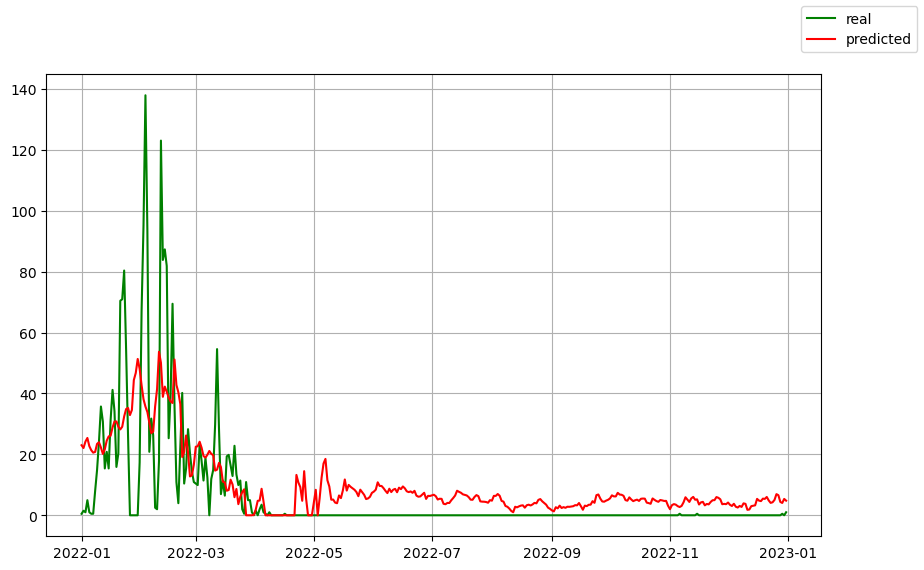

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/

Best parameters:  {'C': 2.0, 'dual': 'auto', 'epsilon': 0.0, 'fit_intercept': True, 'intercept_scaling': 1.0, 'loss': 'epsilon_insensitive', 'max_iter': 1000, 'random_state': None, 'tol': 0.0001, 'verbose': 0}
Taxon: Cupressaceae, Taxaceae
Tuned R² Score: 0.0475
Tuned Mean Squared Error: 3229.7335

[('temp_min_trend7', 0.3586008873678879), ('temp_max', 0.3485556938926877), ('temp_mean_trend7', -0.33732966195899583), ('temp_max_trend7', 0.33174762656288354), ('month', 0.28776571347907814), ('temp_mean', -0.28128170756858334), ('Cupressaceae, Taxaceae_trend7', 0.24120737519469737), ('temp_min', 0.2315954586511046), ('Betula_trend7', -0.22466511219676608), ('Corylus_lag7', 0.2239360950251068), ('temp_min_sum7', -0.20356702905933502), ('Betula_lag7', -0.20003867974533193), ('Cupressaceae, Taxaceae_lag7', 0.17644288099520186), ('temp_mean_sum7', 0.13818853068839865), ('temp_min_lag7', -0.1270054287166624), ('Corylus_sum7', 0.08080807304983788), ('Olea europaea_trend7', -0.07348844955073897)

/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


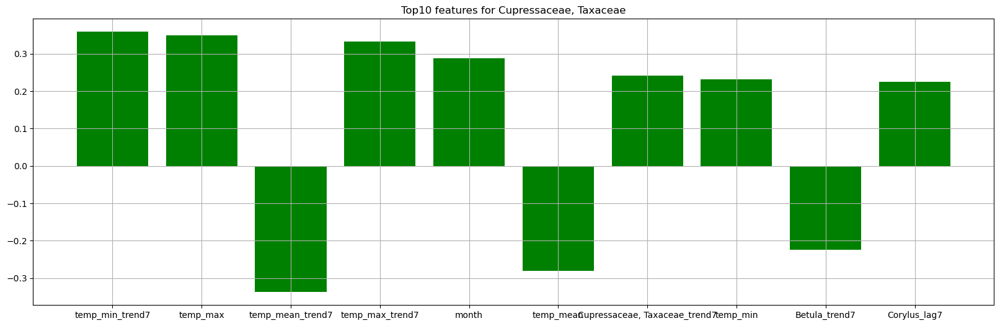

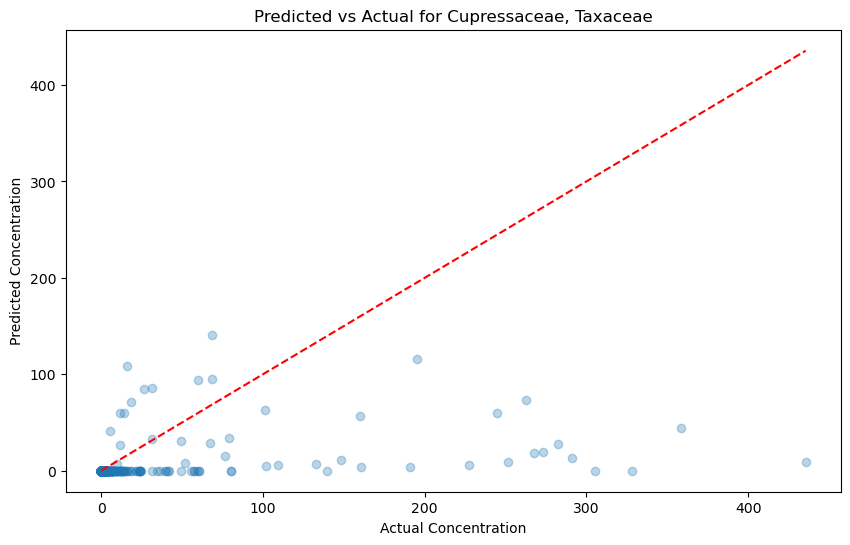

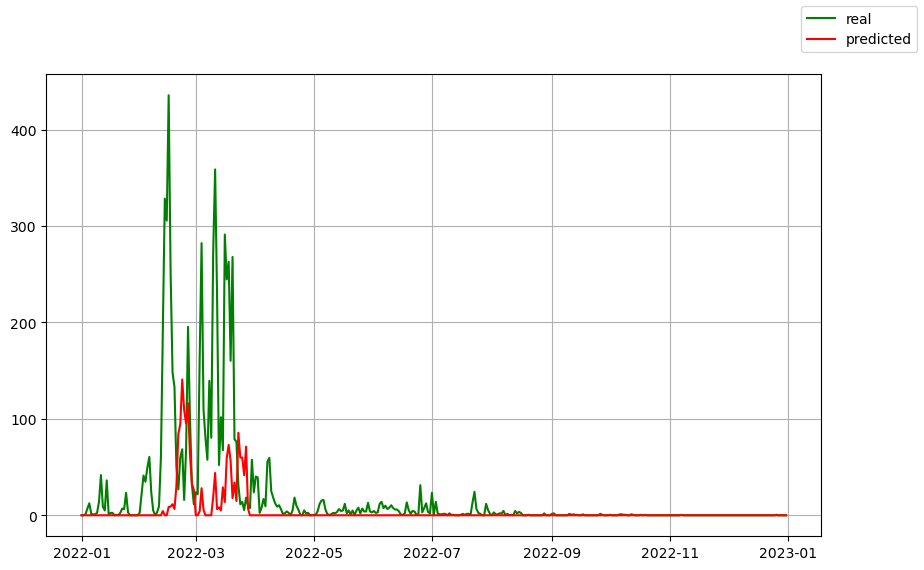

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/

Best parameters:  {'C': 0.5, 'dual': 'auto', 'epsilon': 0.0, 'fit_intercept': True, 'intercept_scaling': 1.0, 'loss': 'epsilon_insensitive', 'max_iter': 1000, 'random_state': None, 'tol': 0.0001, 'verbose': 0}
Taxon: Fraxinus
Tuned R² Score: -0.4868
Tuned Mean Squared Error: 3829.4031

[('Fraxinus_trend7', 0.30965713039809606), ('Fraxinus_lag7', 0.24199480500626838), ('temp_max', 0.1961564074348076), ('month', -0.13764893735203393), ('temp_max_trend7', 0.12467568858640053), ('temp_mean_trend7', -0.11698136837998391), ('temp_mean_lag7', 0.07354721172439982), ('temp_max_lag7', 0.07148071884841148), ('Ambrosia_trend7', 0.04899659532985277), ('Betula_lag7', 0.04883999554484472), ('temp_min_trend7', 0.04724590293572721), ('temp_mean', -0.04343415665557662), ('Ostrya carpinifolia_sum7', 0.03935035090382112), ('Ambrosia_lag7', -0.03922252120118936), ('temp_max_sum7', -0.037859936991197274), ('temp_min_lag7', -0.03773501685038315), ('Ostrya carpinifolia_trend7', 0.03664117348198047), ('Ostrya 

/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


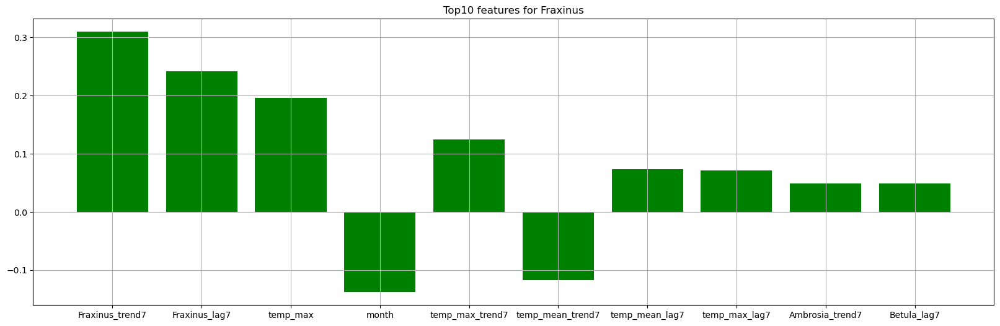

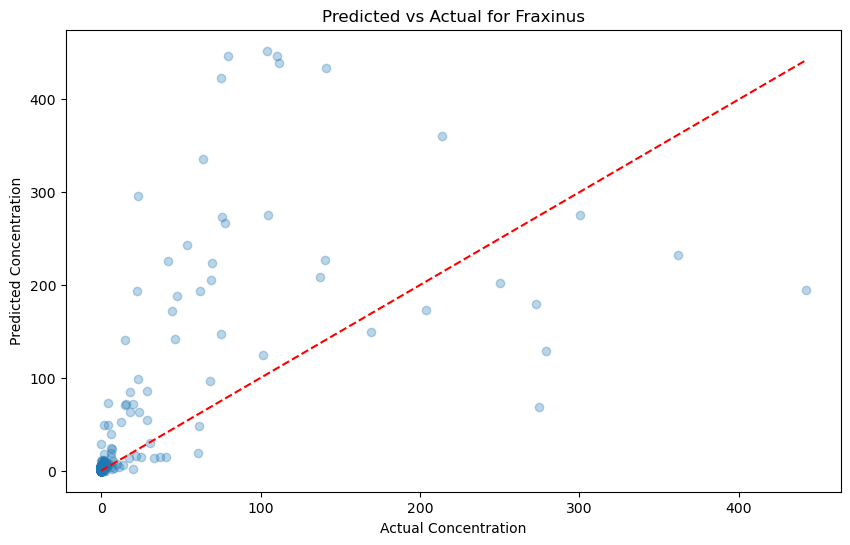

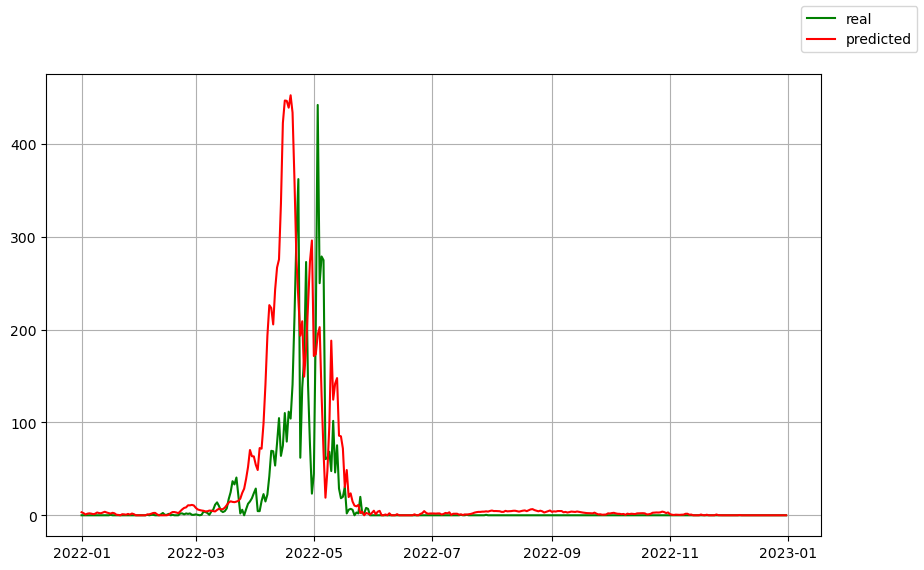

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/

Best parameters:  {'C': 0.5, 'dual': 'auto', 'epsilon': 0.0, 'fit_intercept': True, 'intercept_scaling': 1.0, 'loss': 'epsilon_insensitive', 'max_iter': 1000, 'random_state': None, 'tol': 0.0001, 'verbose': 0}
Taxon: Olea europaea
Tuned R² Score: 0.3137
Tuned Mean Squared Error: 7.5808

[('Olea europaea_trend7', 0.4527573013314791), ('Olea europaea_lag7', 0.4130961917095756), ('month', -0.07148628351811334), ('temp_mean_sum7', 0.024575920517622373), ('temp_min', -0.023418849763916266), ('Olea europaea_sum7', -0.01857404075176233), ('Ambrosia_lag7', -0.01755128188455106), ('Ambrosia_sum7', -0.015870223894317338), ('temp_min_lag7', -0.015503494593020061), ('temp_mean', 0.015023624201911199), ('temp_min_sum7', -0.012154368517830779), ('temp_max', 0.011598746430812526), ('temp_mean_trend7', 0.011308160574825286), ('temp_max_sum7', -0.009416197373138402), ('temp_min_trend7', -0.007915355170896941), ('temp_max_trend7', 0.007080107183408463), ('Artemisia_lag7', -0.005372937163937335), ('temp_

/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


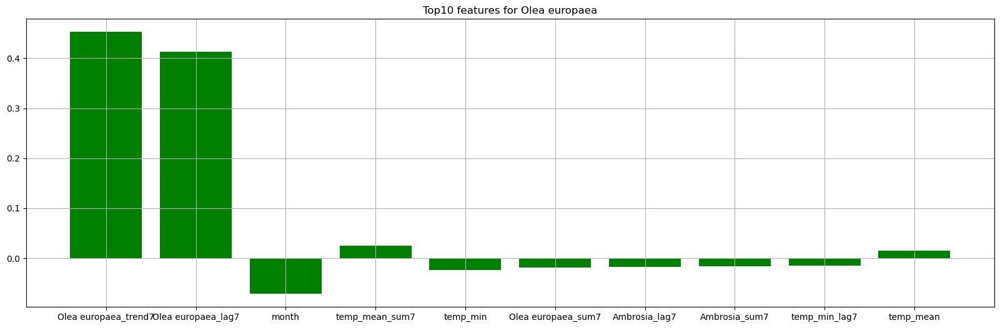

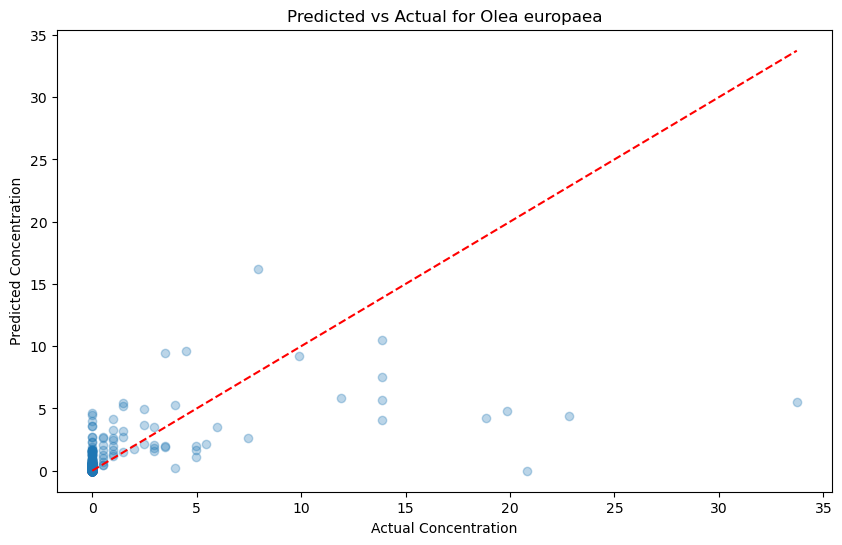

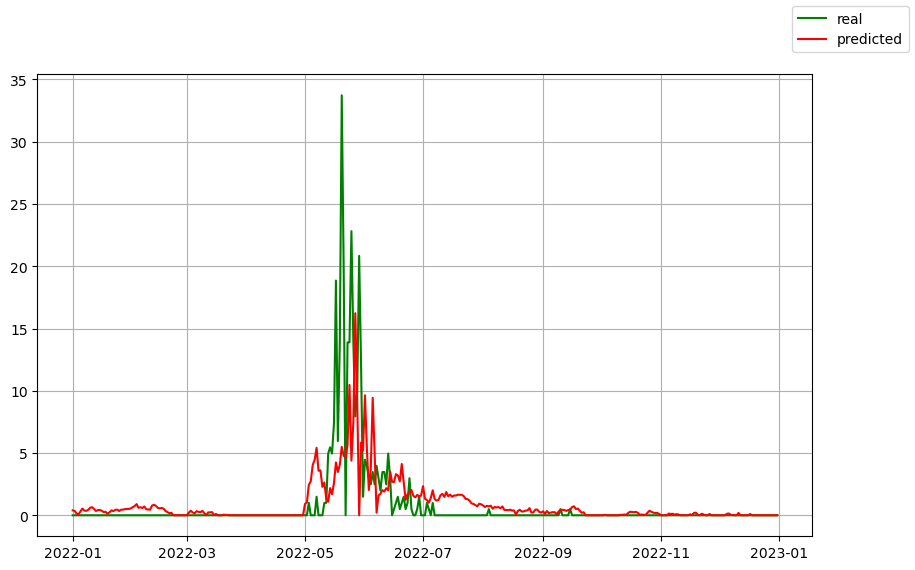

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/

Best parameters:  {'C': 1.0, 'dual': 'auto', 'epsilon': 0.0, 'fit_intercept': True, 'intercept_scaling': 1.0, 'loss': 'epsilon_insensitive', 'max_iter': 1000, 'random_state': None, 'tol': 0.0001, 'verbose': 0}
Taxon: Ostrya carpinifolia
Tuned R² Score: 0.0127
Tuned Mean Squared Error: 66925.3368

[('temp_max', 2.1685191859625936), ('temp_mean_trend7', -1.7758904547240648), ('temp_mean', -1.7746171745004988), ('month', -1.5483765137477923), ('temp_max_trend7', 1.1784085775094981), ('temp_min_trend7', 1.0379292464231638), ('temp_min', 1.03454114584971), ('Betula_trend7', 0.9942827395999144), ('temp_max_lag7', 0.9901106084531848), ('temp_max_sum7', -0.83467060245273), ('Betula_lag7', 0.8198031773427287), ('temp_mean_sum7', 0.7820464425049097), ('Betula_sum7', 0.5912271009489202), ('Fraxinus_trend7', -0.5343170614861532), ('Ostrya carpinifolia_lag7', 0.41652113261281803), ('Fraxinus_lag7', -0.3885065912657179), ('Ambrosia_trend7', 0.32775074953412375), ('Ostrya carpinifolia_trend7', 0.3247

/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


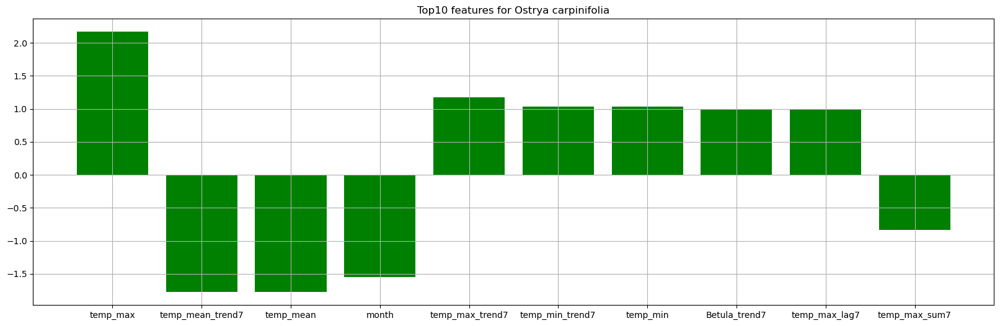

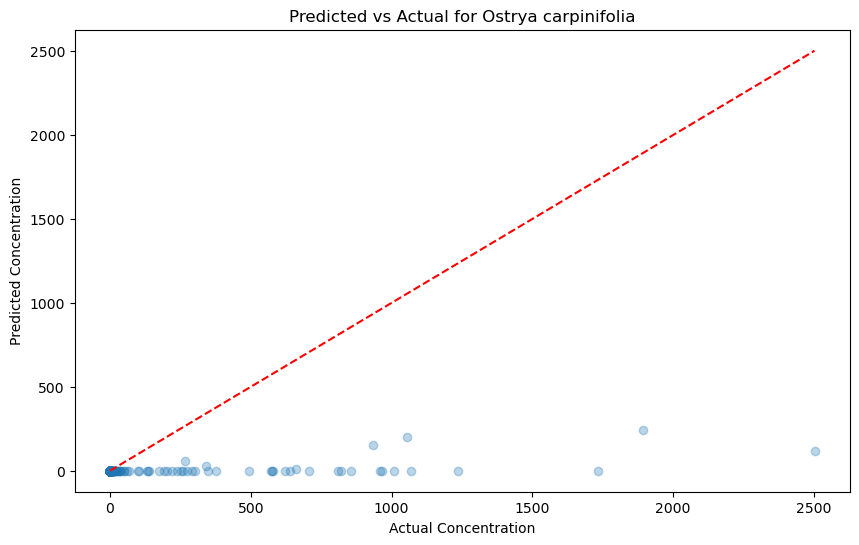

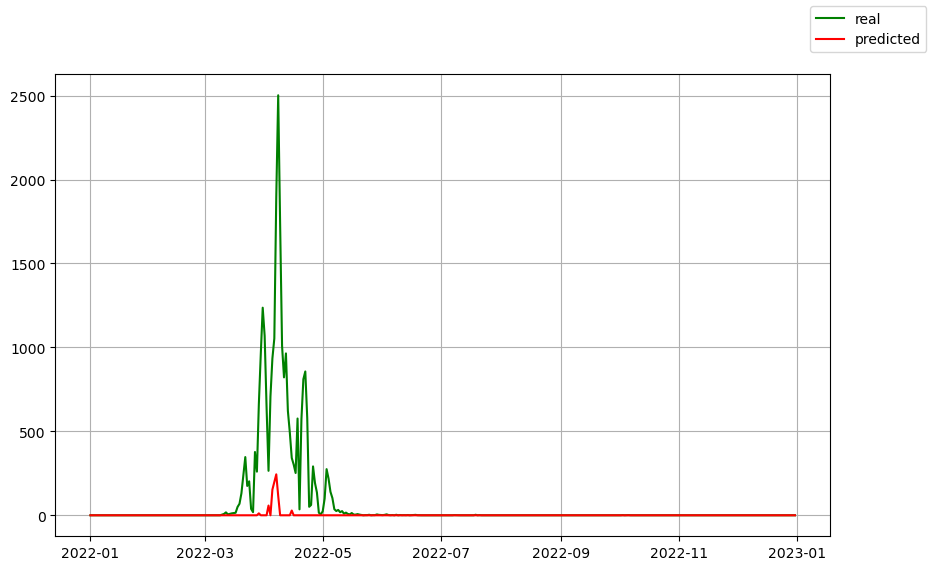

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/

Best parameters:  {'C': 2.0, 'dual': 'auto', 'epsilon': 0.0, 'fit_intercept': True, 'intercept_scaling': 1.0, 'loss': 'epsilon_insensitive', 'max_iter': 1000, 'random_state': None, 'tol': 0.0001, 'verbose': 0}
Taxon: Poaceae
Tuned R² Score: -1.5475
Tuned Mean Squared Error: 3217.2961

[('month', -1.1682509057248807), ('Poaceae_lag7', 0.3106153841790691), ('temp_min_trend7', 0.2882676366834863), ('temp_mean_trend7', -0.2563789466868393), ('Ambrosia_lag7', -0.25389352174979984), ('Poaceae_trend7', 0.23660932420714129), ('Ambrosia_sum7', -0.23561908310020432), ('Olea europaea_lag7', 0.2191910405790052), ('Fraxinus_trend7', 0.18941229978308619), ('temp_min_lag7', -0.183269799203999), ('temp_mean', -0.17092060792960542), ('Betula_lag7', -0.16679070444401747), ('temp_max_trend7', 0.15253364049149226), ('temp_max_lag7', -0.12816981412713413), ('temp_max_sum7', 0.12136036667120985), ('Olea europaea_trend7', 0.11842482540108654), ('temp_min', 0.10499783747947868), ('Olea europaea_sum7', 0.09089

/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


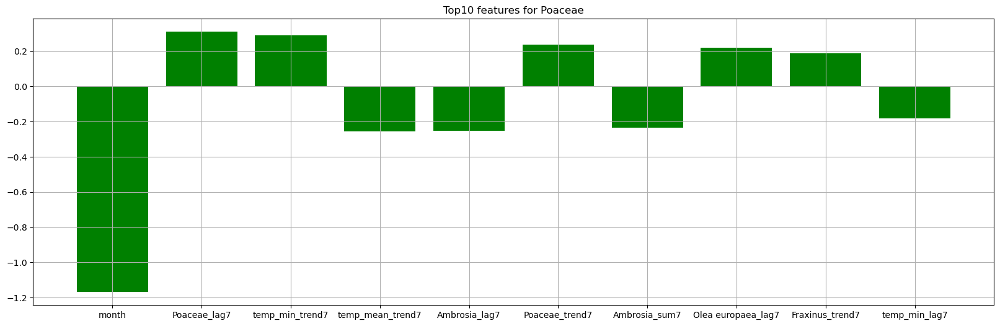

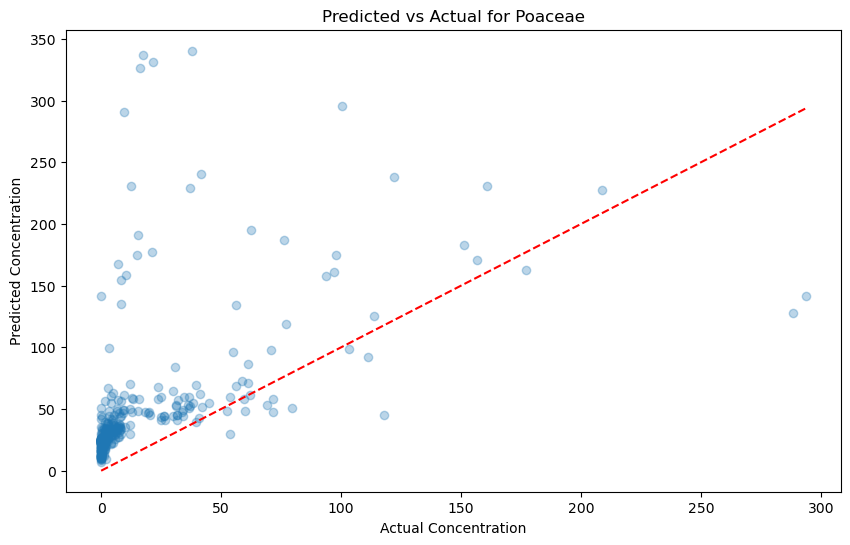

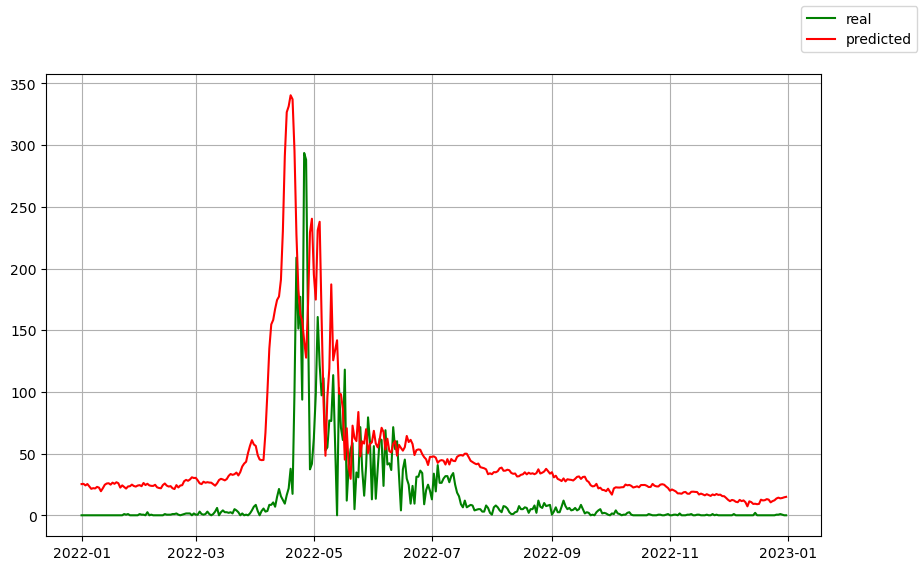

Fitting 5 folds for each of 3 candidates, totalling 15 fits


/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/petek/anaconda3/envs/pollini/

Best parameters:  {'C': 2.0, 'dual': 'auto', 'epsilon': 0.0, 'fit_intercept': True, 'intercept_scaling': 1.0, 'loss': 'epsilon_insensitive', 'max_iter': 1000, 'random_state': None, 'tol': 0.0001, 'verbose': 0}
Taxon: Urticaceae
Tuned R² Score: -0.0327
Tuned Mean Squared Error: 1155.6752

[('Ambrosia_lag7', -1.4941232250059173), ('Ambrosia_sum7', -1.0549935079115875), ('temp_mean_trend7', -1.0357545906744936), ('Ambrosia_trend7', -0.7776535861281596), ('temp_max_lag7', 0.6867606133517261), ('temp_min', 0.6182820375565643), ('temp_max', 0.5537817828400182), ('temp_mean_lag7', 0.5404272872035188), ('temp_mean', -0.49532730347076037), ('Urticaceae_lag7', 0.4015304843983858), ('Urticaceae_trend7', 0.36573817470602793), ('temp_min_lag7', 0.34239989730873627), ('precipitation_lag7', 0.2930475245627773), ('temp_min_trend7', 0.2758821402477093), ('precipitation', 0.21079360773537495), ('Olea europaea_trend7', -0.20976933122543392), ('precipitation_sum7', 0.20655652612148634), ('temp_mean_sum7',

/home/petek/anaconda3/envs/pollini/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


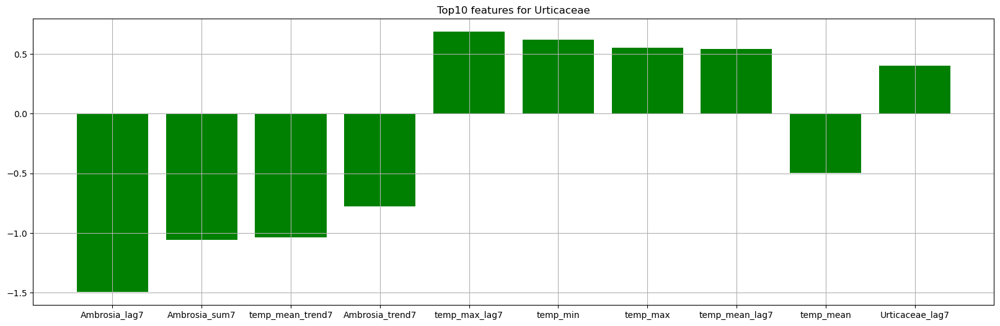

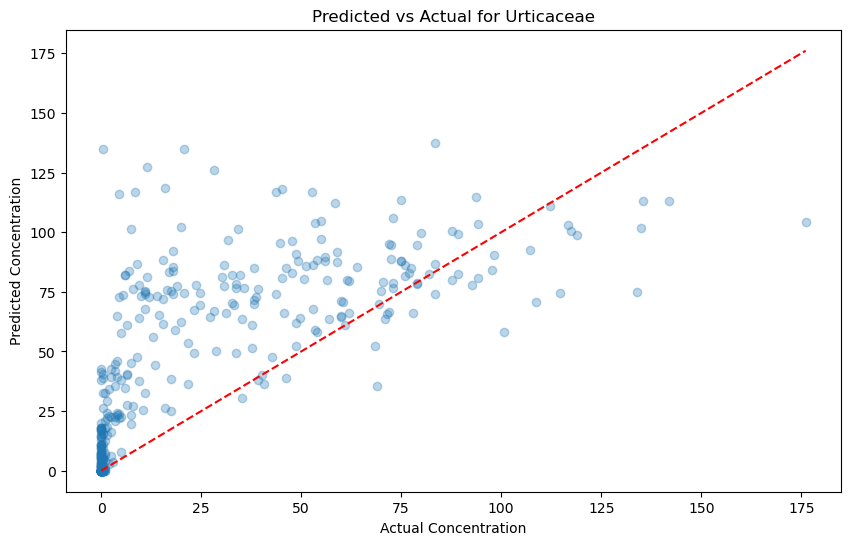

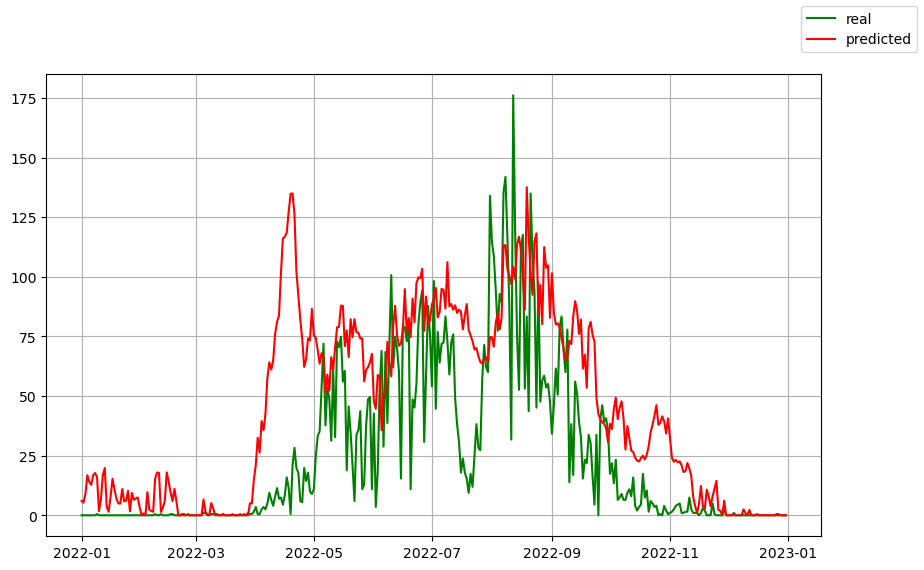

In [8]:
from sklearn.svm import LinearSVR 

# Parameters to choose 
param_grid = {
    "C": [2.0, 1.0, 0.5],
}

reg = LinearSVR() 
linear_svr_results = {}

# Show best model results for each taxon 
for taxon, best_model in train_model(reg, train_data, features, taxa, param_grid):
    # Extract test data for a specific taxon 
    X_test, y_test = extract_xy(test_data, features, taxon) 

    print("Best parameters: ", best_model.get_params())
    y_pred = best_model.predict(X_test).clip(0) # Negative values are non-sense
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    print(f"Taxon: {taxon}")
    print(f"Tuned R² Score: {r2:.4f}") #Higher is better; measure of how well the model explains variance in the test data
    print(f"Tuned Mean Squared Error: {mse:.4f}\n") #Lower is better; Average squared difference between predicted and actual values 
        
    # Bar plot coefficients  
    coefficients = {col:coef for col, coef in zip(features, best_model.coef_)} 
    # Order based on absolute value (descending) 
    sorted_coeff = list(sorted(coefficients.items(), key=lambda item: abs(item[1]), reverse=True))
    print(sorted_coeff)
    sorted_coeff = sorted_coeff[:10] # Top10
    
    fig, ax = plt.subplots(figsize=(20,6)) 
    ax.set_title(f"Top10 features for {taxon}") 
    ax.bar([item[0] for item in sorted_coeff], [item[1] for item in sorted_coeff], color='green', label='real')
    ax.grid()  
    plt.show() 
    plt.close(fig) 

    
    plot_pred(y_test, y_pred, test_data['datetime'], taxon)
    
    # Save the achieved score for this taxon 
    linear_svr_results[taxon] = r2 

# Store the achieved results in a global results table 
results['Linear SVR'] = linear_svr_results 

# K neighbors

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Taxon: Ambrosia
Tuned R² Score: -0.0766
Tuned Mean Squared Error: 0.0807



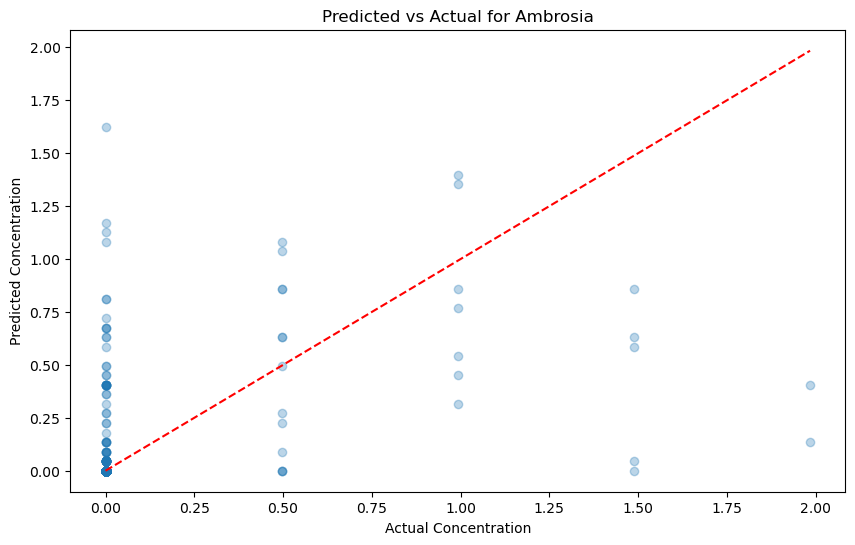

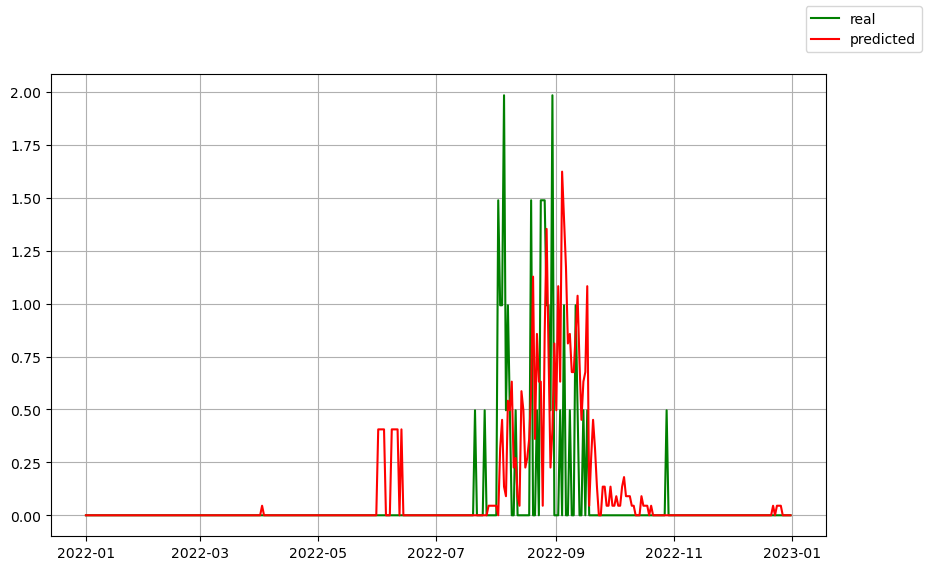

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Taxon: Artemisia
Tuned R² Score: -0.5506
Tuned Mean Squared Error: 64.3732



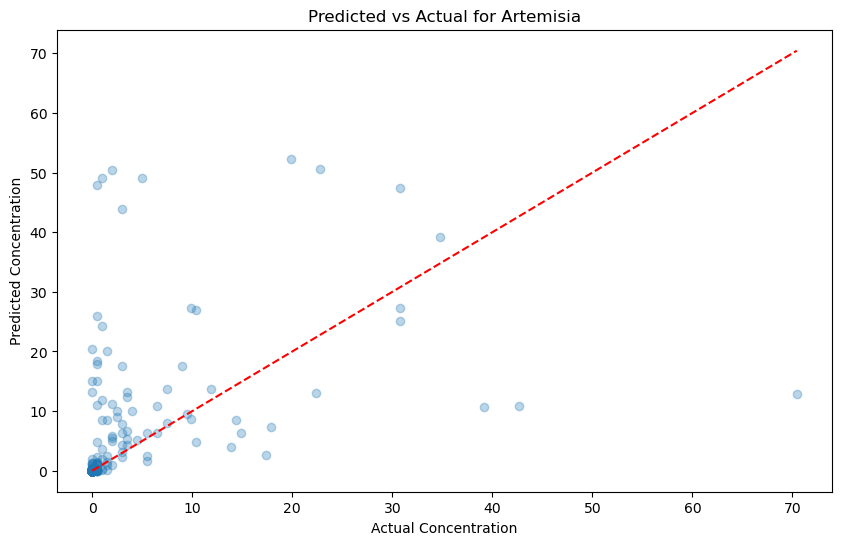

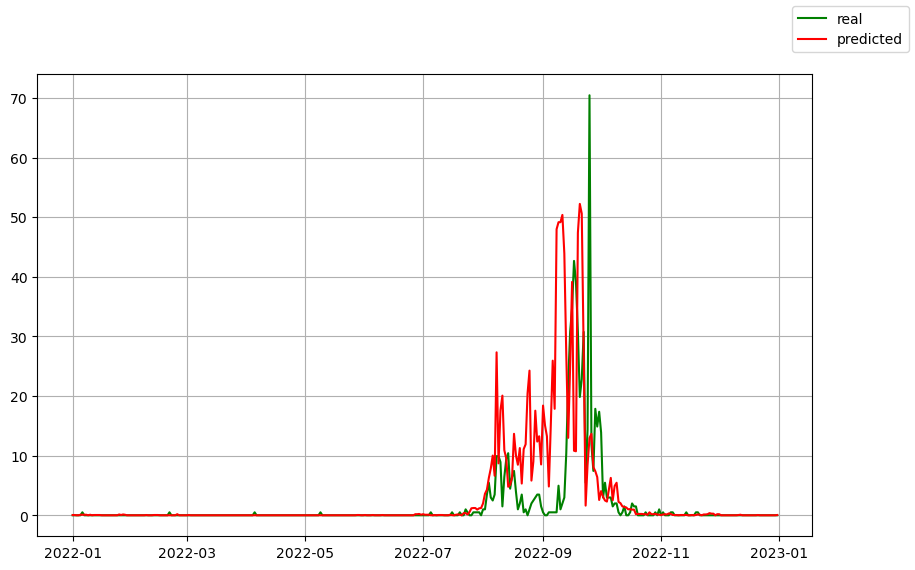

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Taxon: Betula
Tuned R² Score: 0.3368
Tuned Mean Squared Error: 380.3499



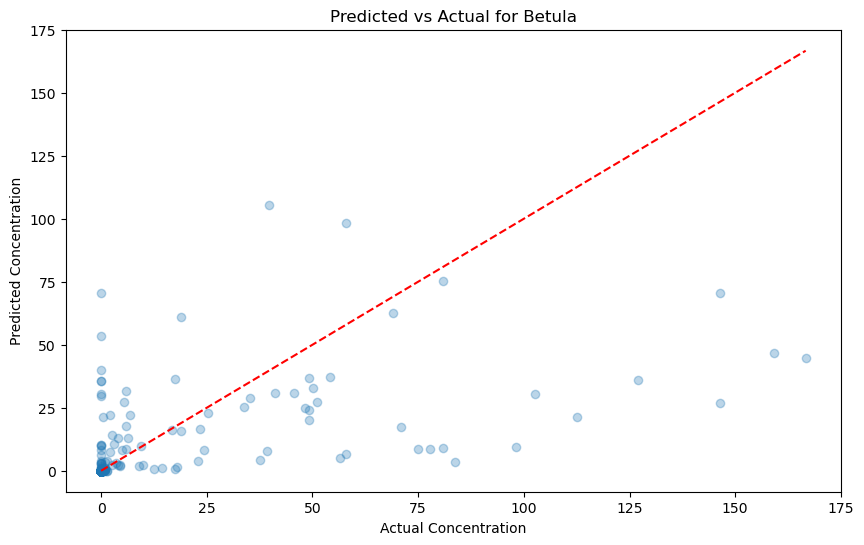

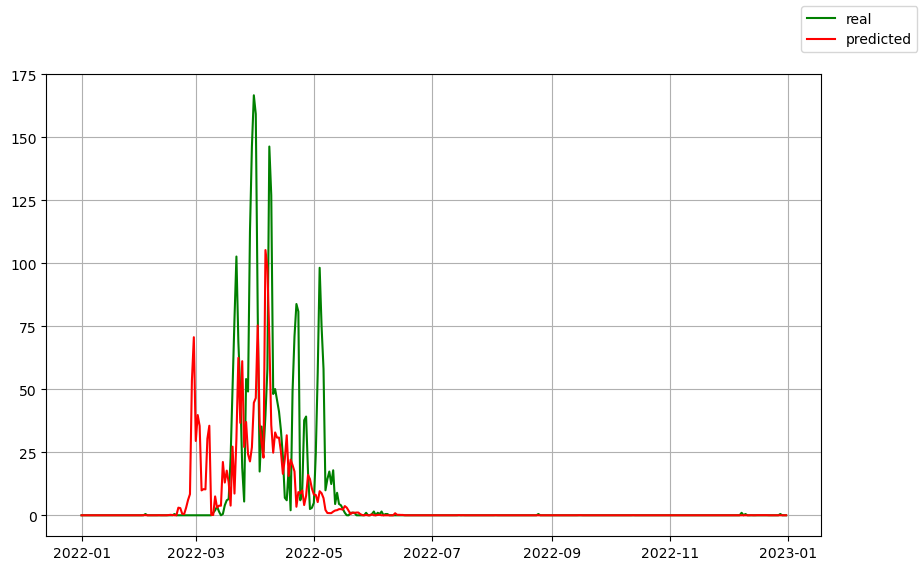

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Taxon: Corylus
Tuned R² Score: 0.1100
Tuned Mean Squared Error: 284.2789



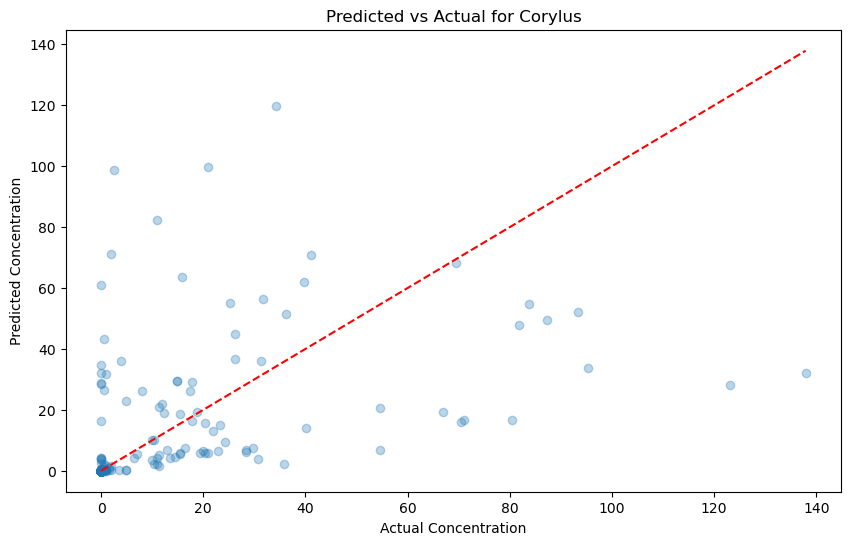

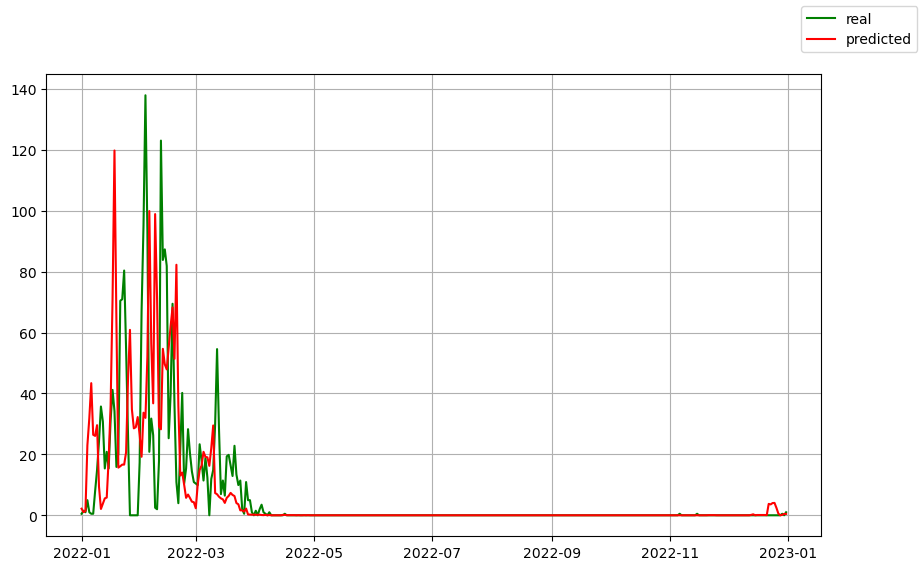

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Taxon: Cupressaceae, Taxaceae
Tuned R² Score: 0.5622
Tuned Mean Squared Error: 1484.5296



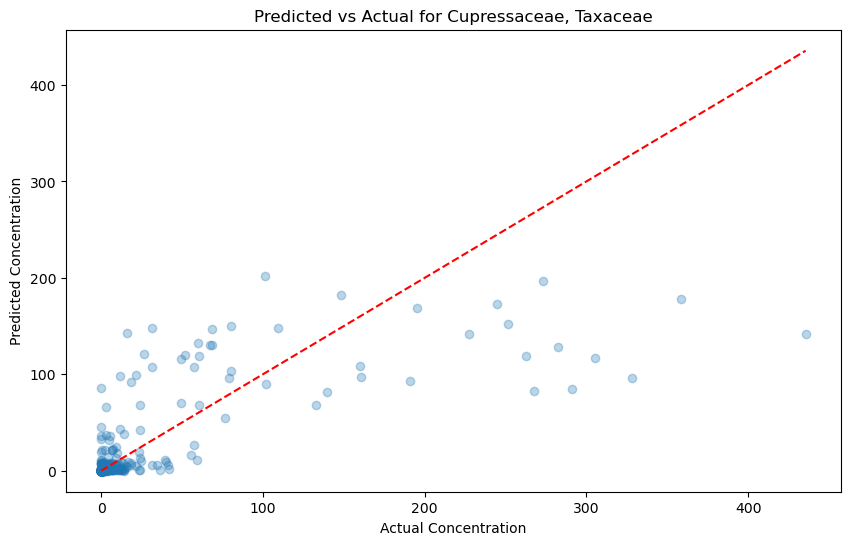

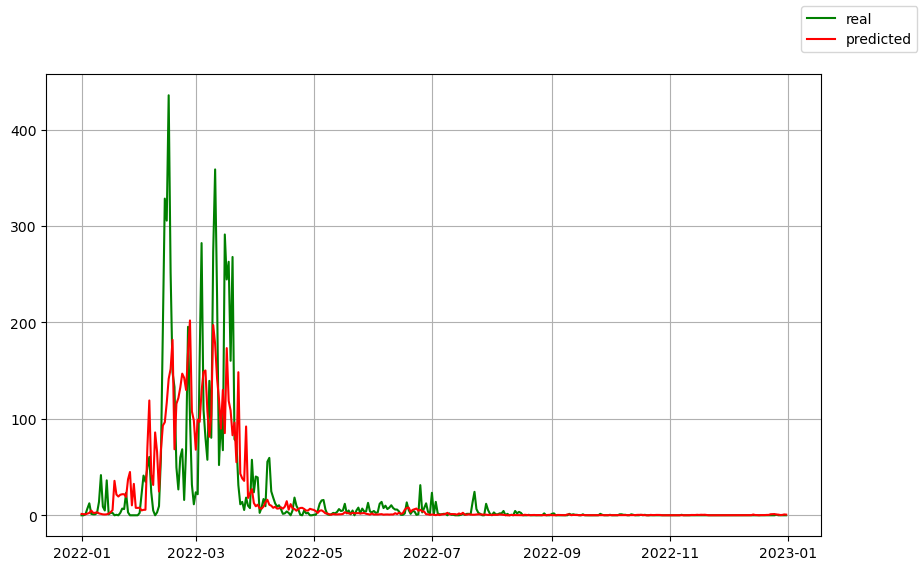

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Taxon: Fraxinus
Tuned R² Score: 0.2057
Tuned Mean Squared Error: 2045.6885



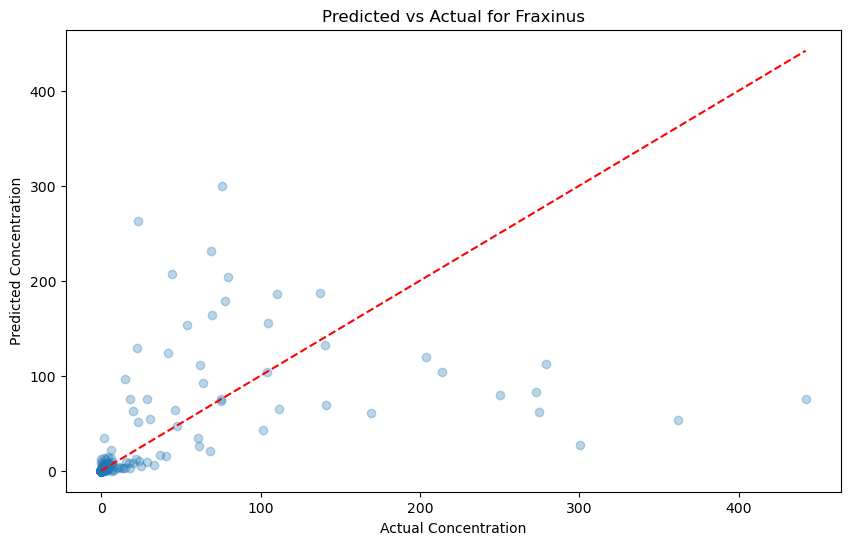

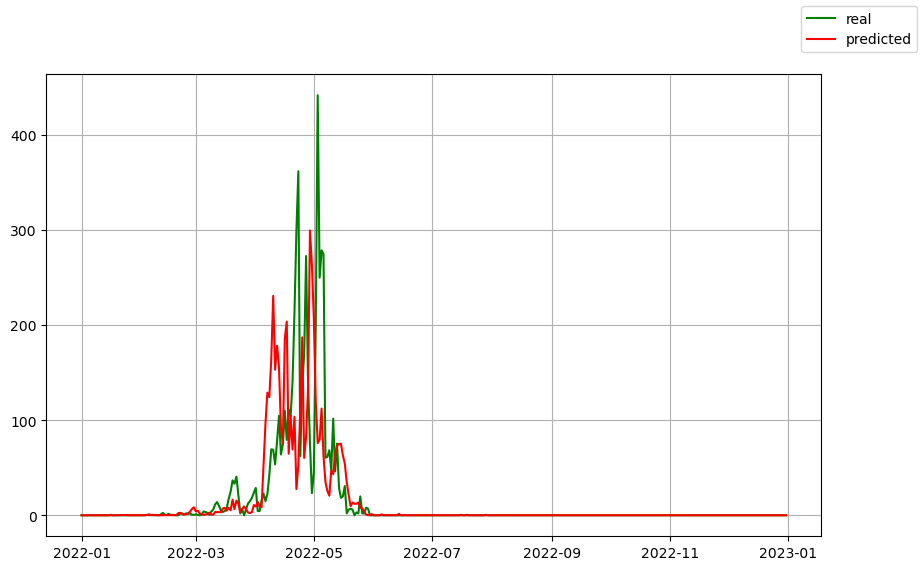

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Taxon: Olea europaea
Tuned R² Score: 0.1661
Tuned Mean Squared Error: 9.2115



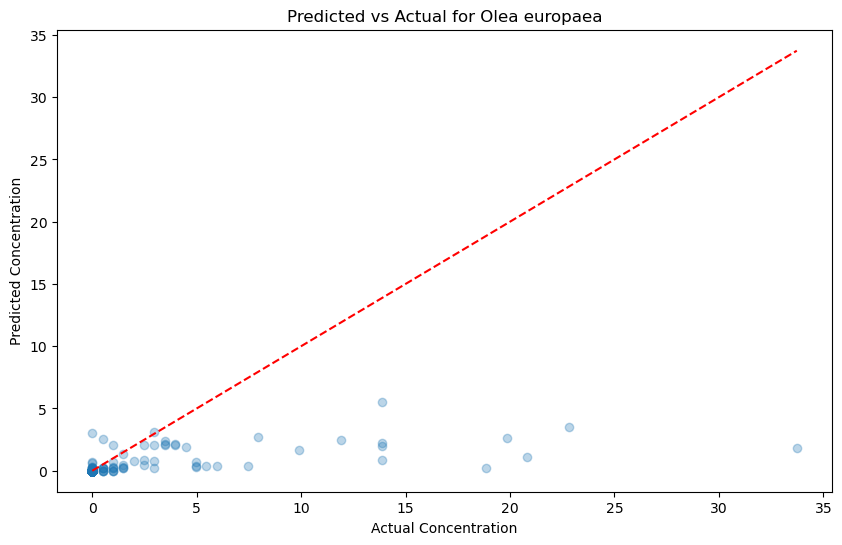

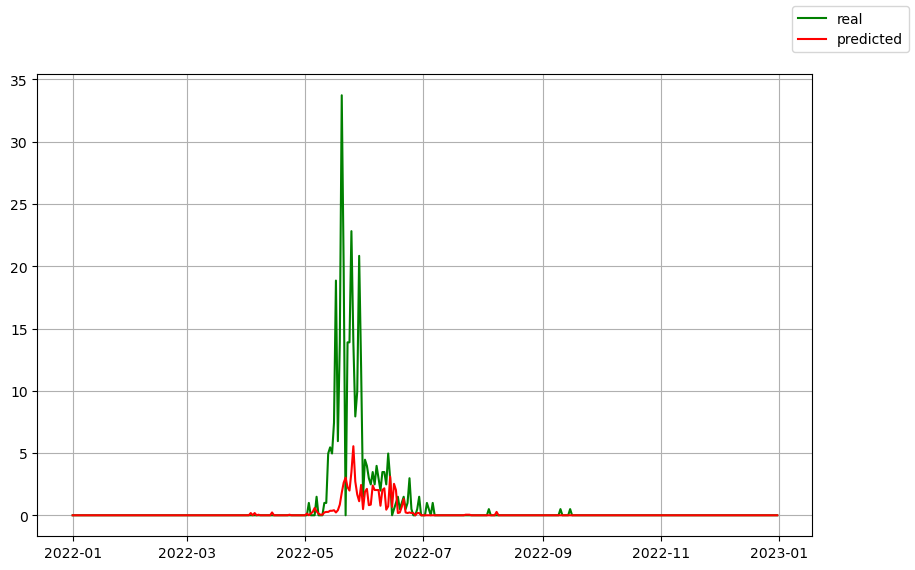

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Taxon: Ostrya carpinifolia
Tuned R² Score: 0.5083
Tuned Mean Squared Error: 33331.7508



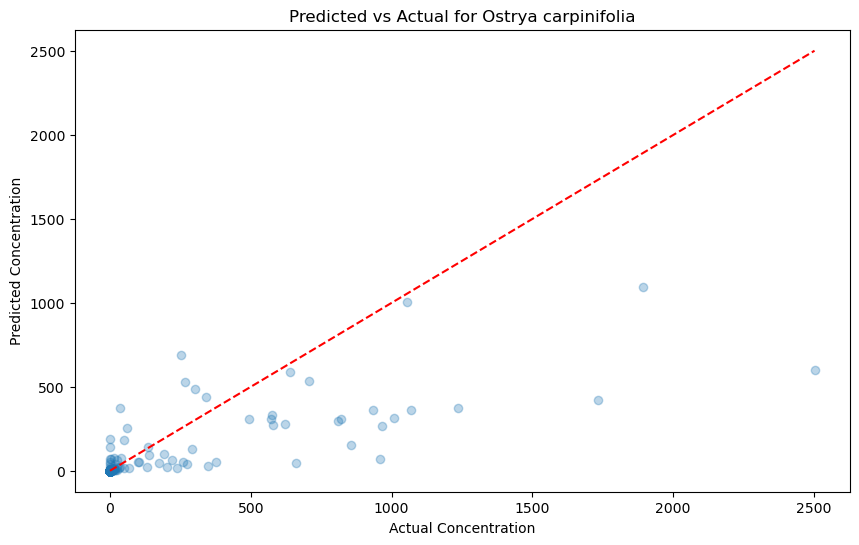

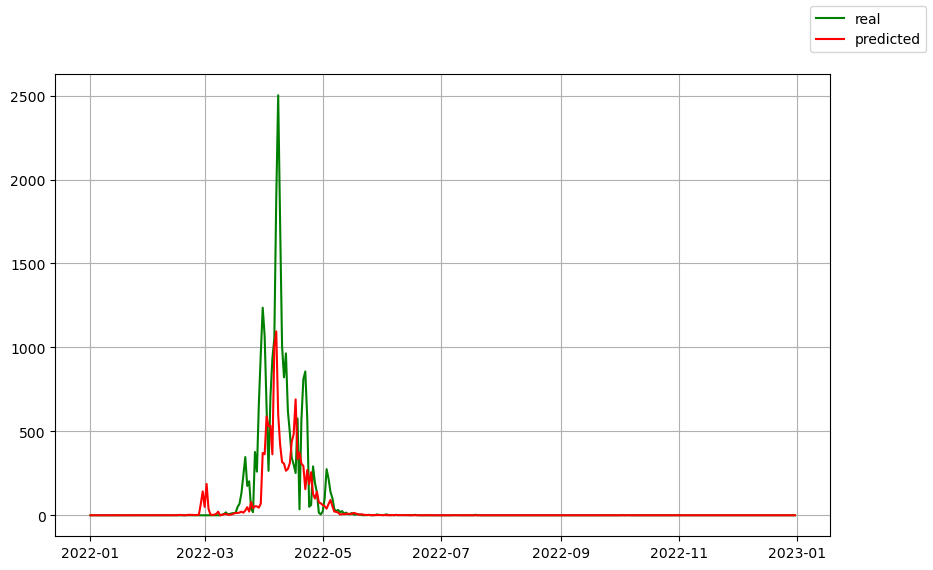

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Taxon: Poaceae
Tuned R² Score: -0.1834
Tuned Mean Squared Error: 1494.5240



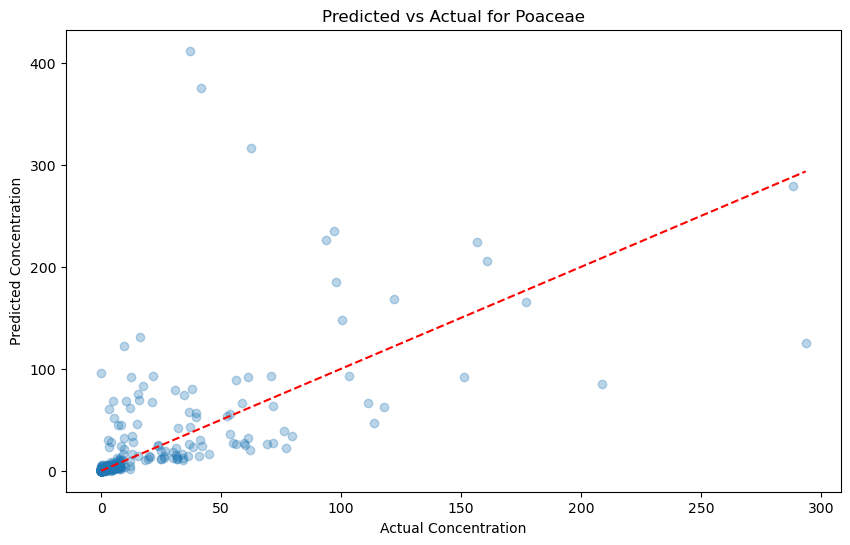

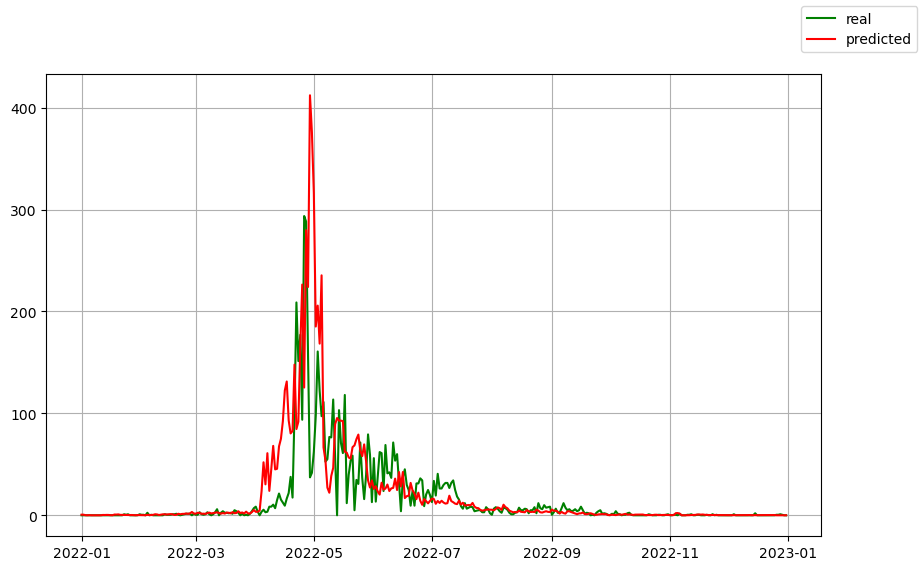

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters:  {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 11, 'p': 2, 'weights': 'uniform'}
Taxon: Urticaceae
Tuned R² Score: 0.3191
Tuned Mean Squared Error: 761.9412



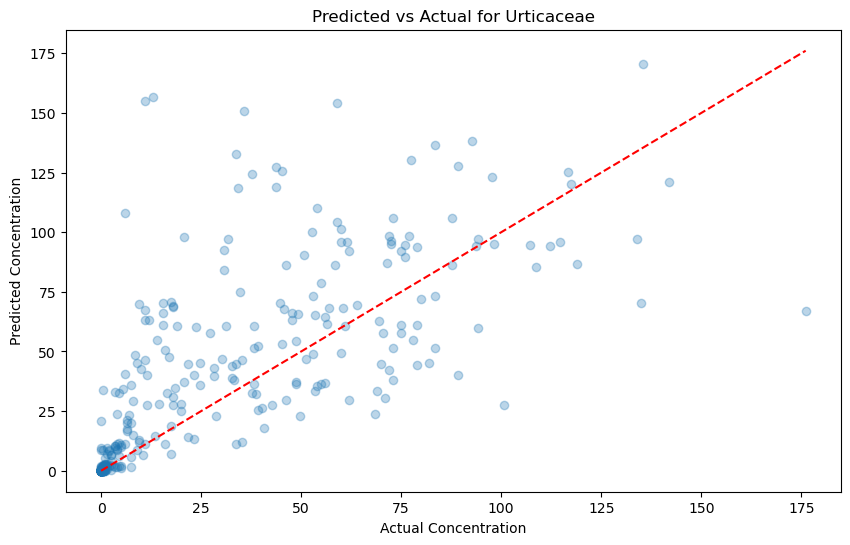

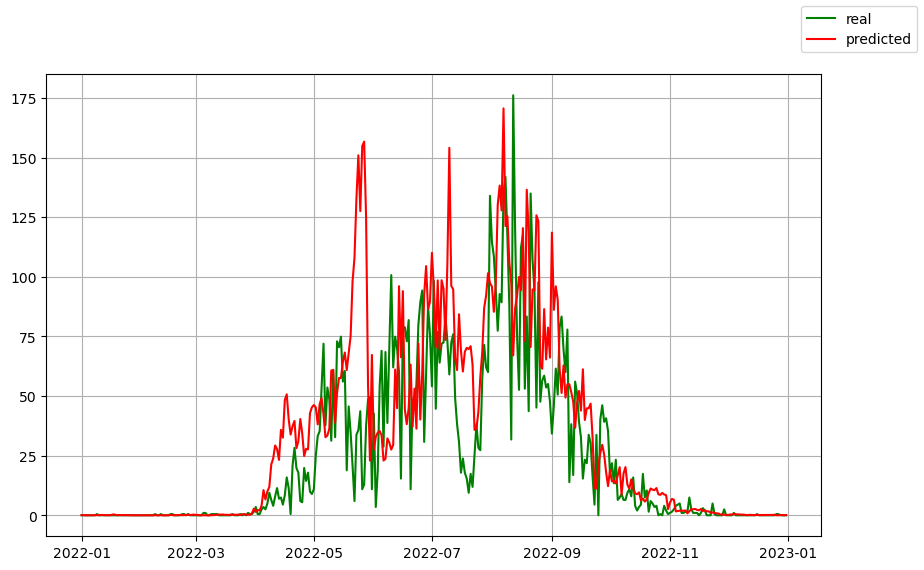

In [9]:
from sklearn.neighbors import KNeighborsRegressor 

# Parameters to choose 
param_grid = {
    "n_neighbors": [11, 5, 3] 
}

reg = KNeighborsRegressor() 
k_results = {}

# Show best model results for each taxon 
for taxon, best_model in train_model(reg, train_data, features, taxa, param_grid):
    # Extract test data for a specific taxon 
    X_test, y_test = extract_xy(test_data, features, taxon) 

    print("Best parameters: ", best_model.get_params())
    y_pred = best_model.predict(X_test).clip(0) # Negative values are non-sense
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    print(f"Taxon: {taxon}")
    print(f"Tuned R² Score: {r2:.4f}") #Higher is better; measure of how well the model explains variance in the test data
    print(f"Tuned Mean Squared Error: {mse:.4f}\n") #Lower is better; Average squared difference between predicted and actual values 
        
    # Note: there is no model parameters to display 

    plot_pred(y_test, y_pred, test_data['datetime'], taxon)

    # Save the achieved score for this taxon 
    k_results[taxon] = r2 

# Store the achieved results in a global results table 
results['K neighbors'] = k_results 

# Gradient boosting

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best parameters:  {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 20, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 50, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Taxon: Ambrosia
Tuned R² Score: -5.1781
Tuned Mean Squared Error: 0.4629



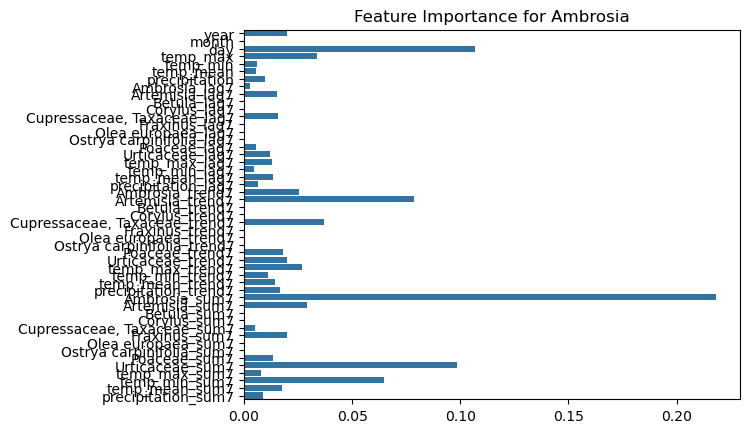

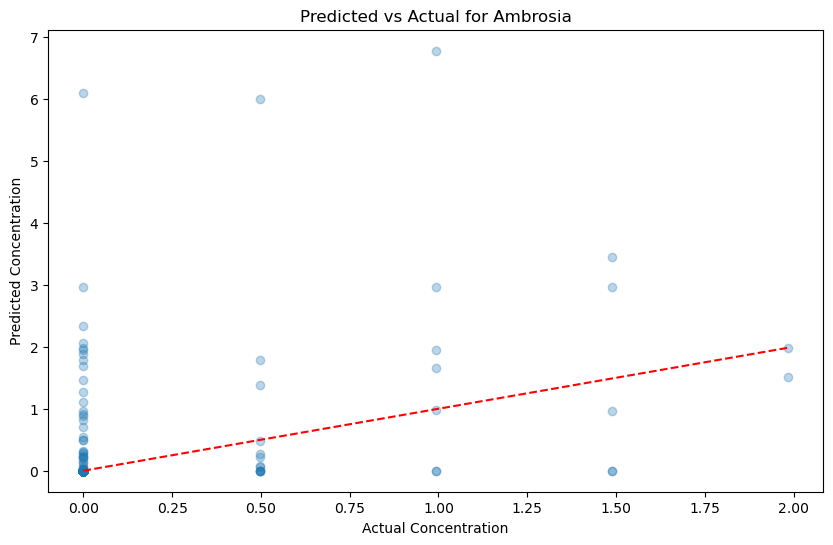

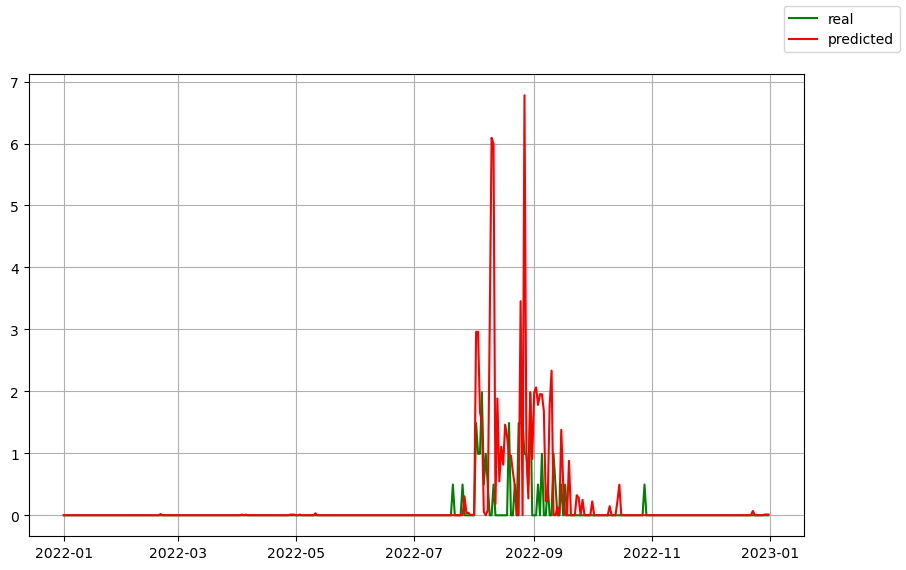

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best parameters:  {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 50, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Taxon: Artemisia
Tuned R² Score: -5.7322
Tuned Mean Squared Error: 279.4926



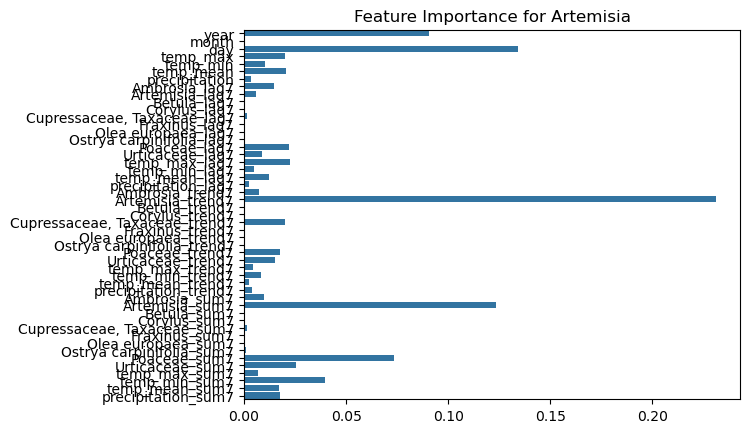

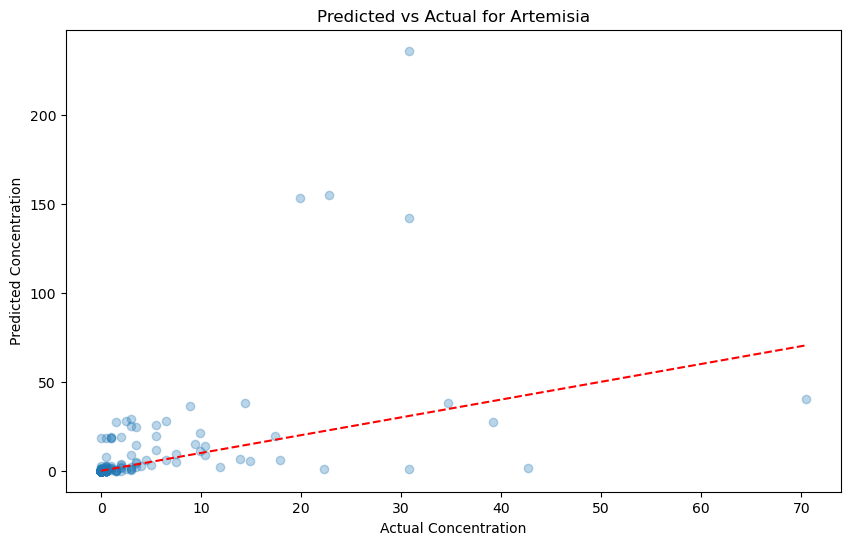

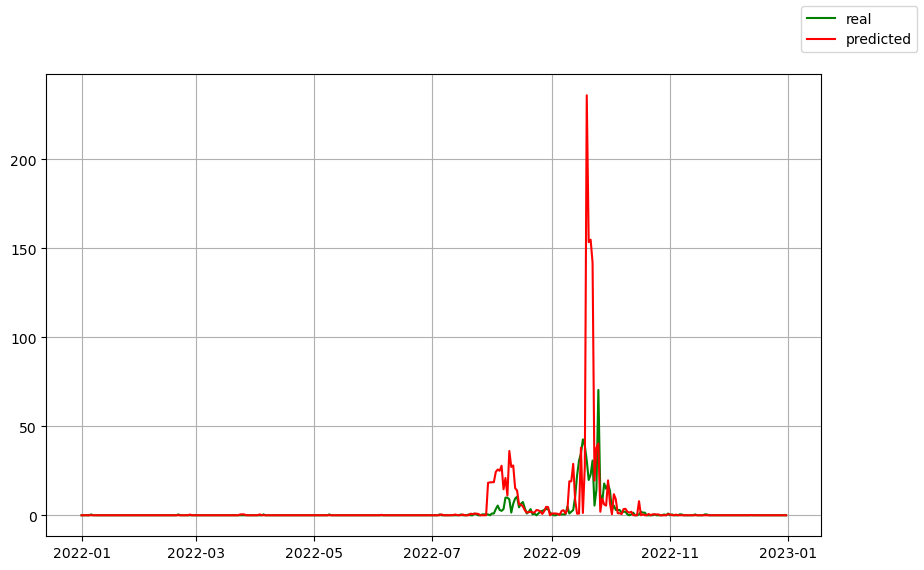

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best parameters:  {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 20, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Taxon: Betula
Tuned R² Score: -0.3409
Tuned Mean Squared Error: 769.0646



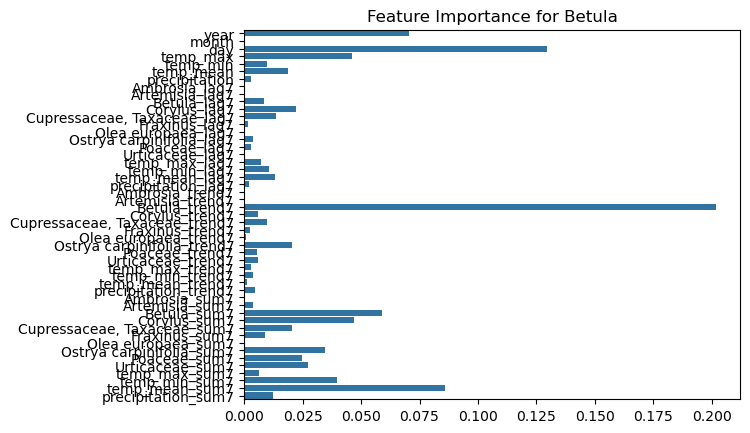

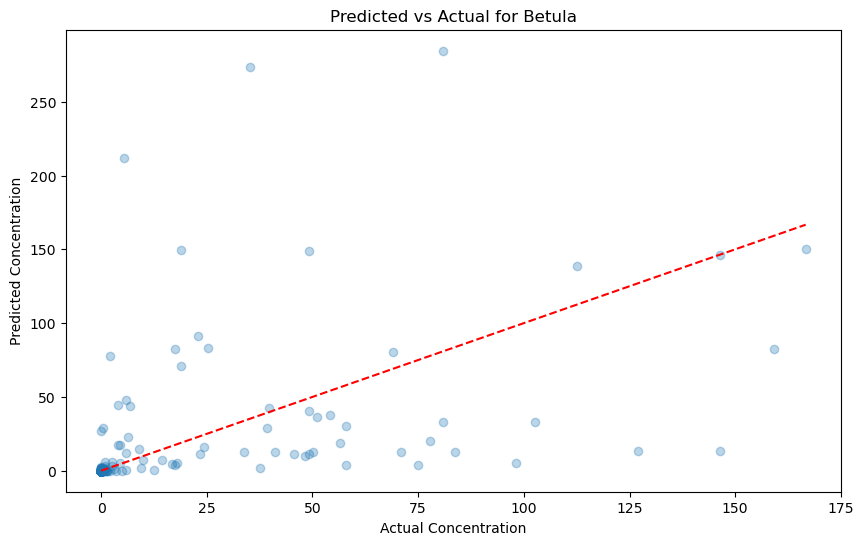

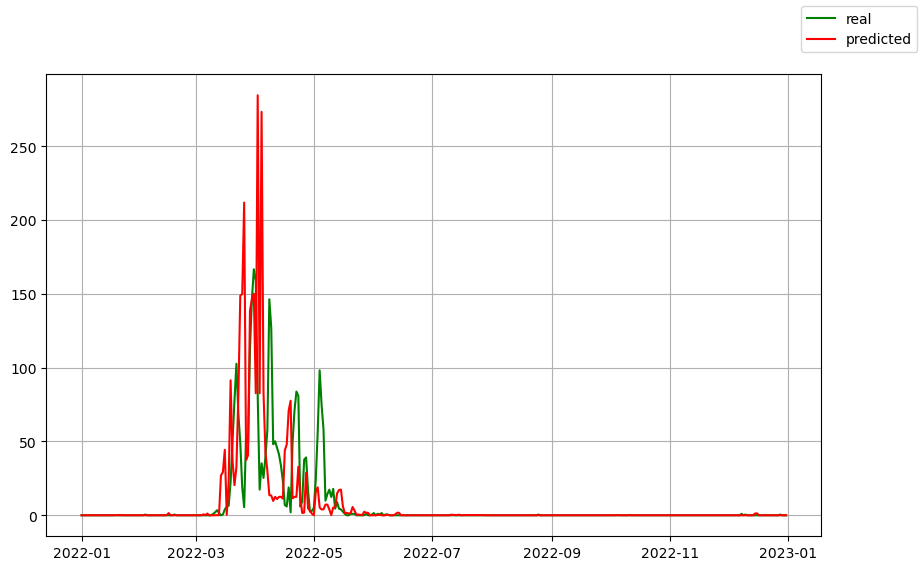

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best parameters:  {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 20, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Taxon: Corylus
Tuned R² Score: -4.4902
Tuned Mean Squared Error: 1753.6036



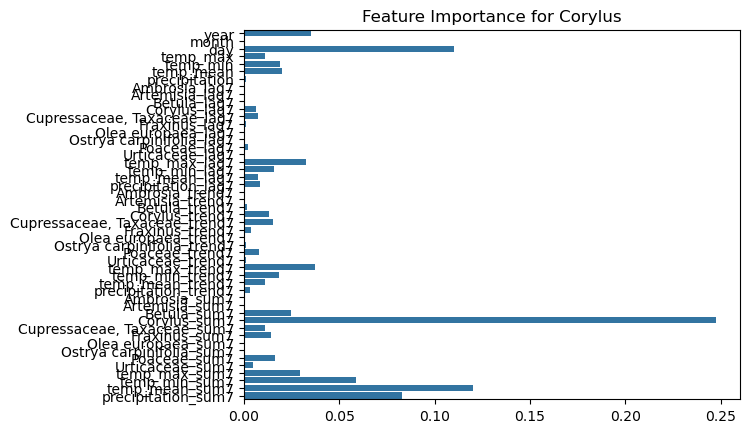

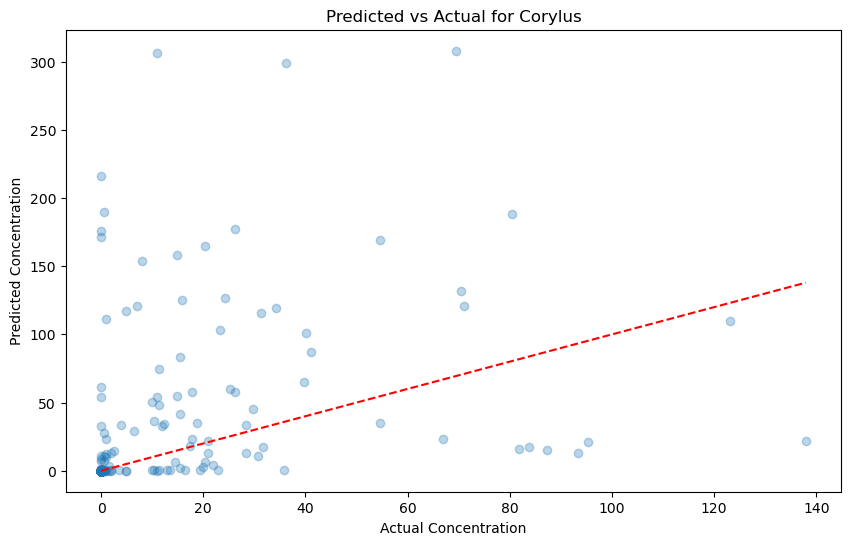

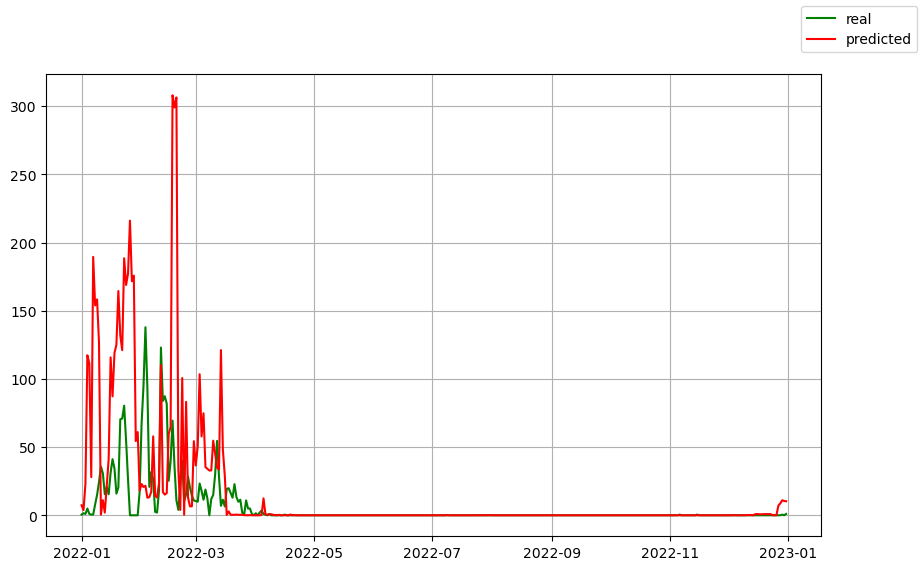

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best parameters:  {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 20, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 50, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Taxon: Cupressaceae, Taxaceae
Tuned R² Score: 0.1513
Tuned Mean Squared Error: 2877.9419



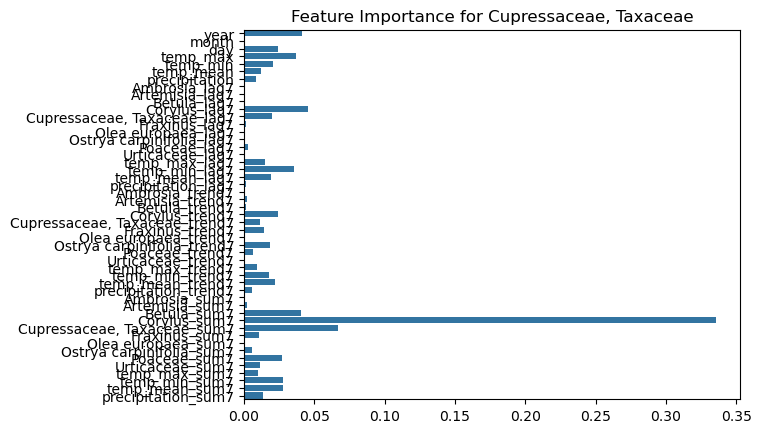

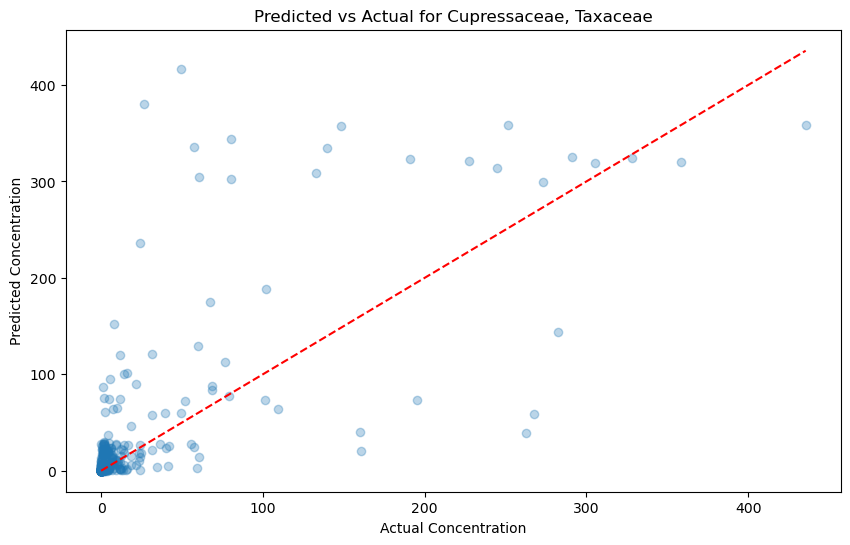

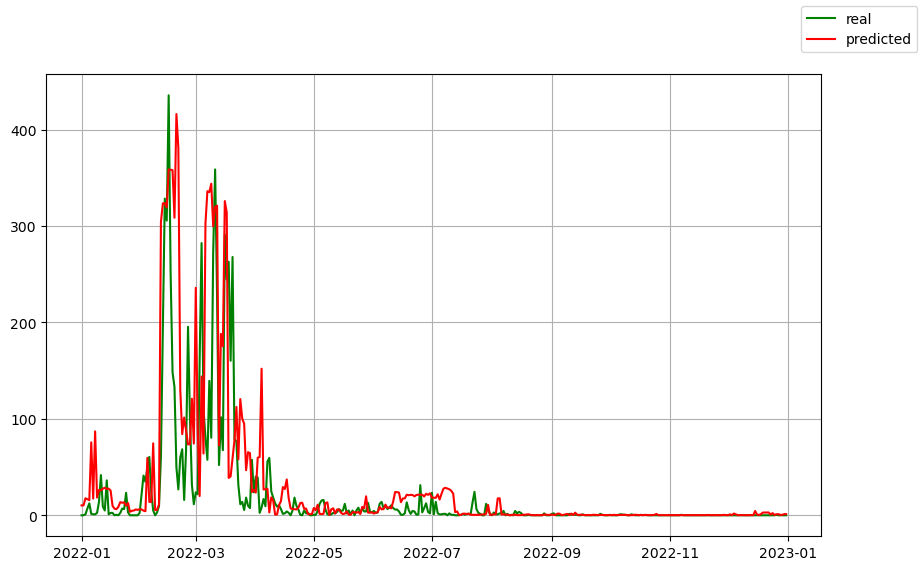

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best parameters:  {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 20, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 50, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Taxon: Fraxinus
Tuned R² Score: 0.0786
Tuned Mean Squared Error: 2373.0206



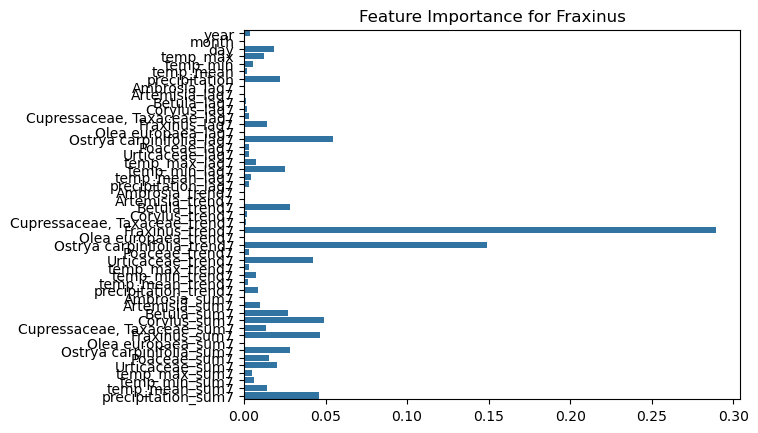

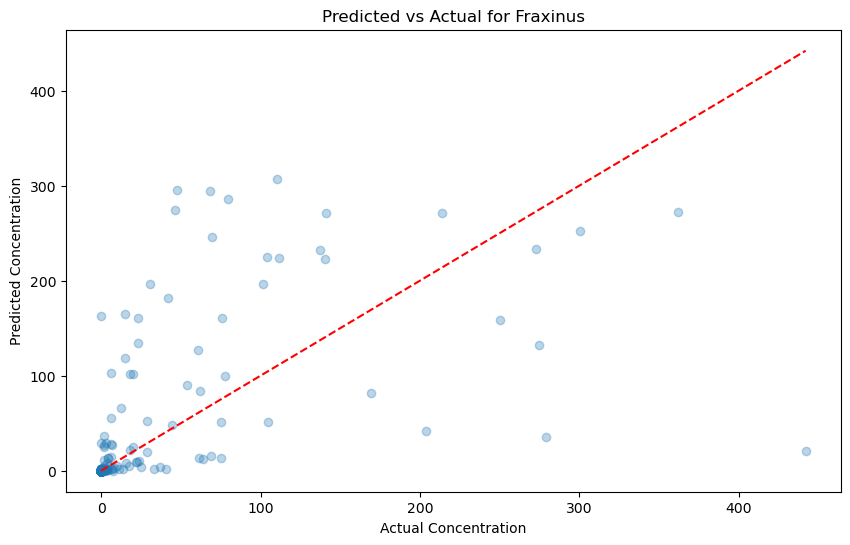

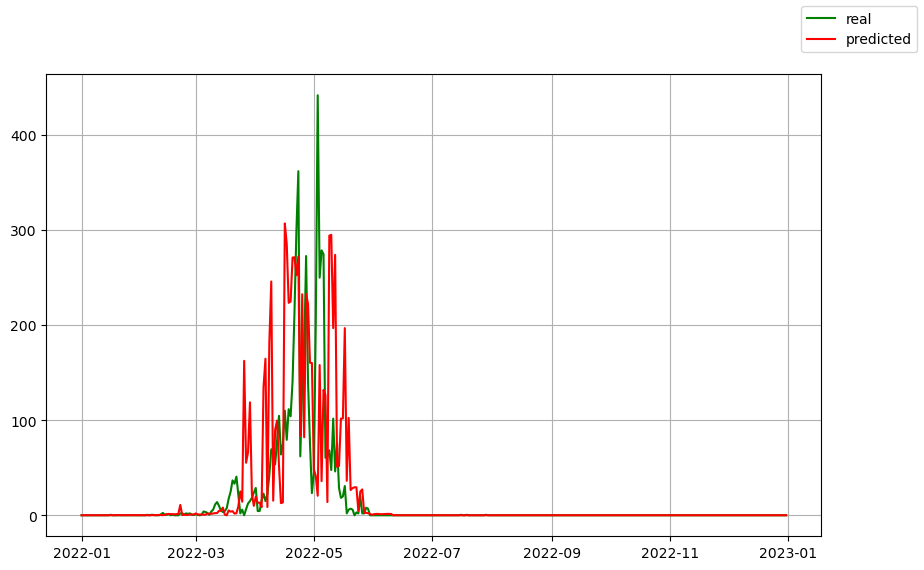

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best parameters:  {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 20, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Taxon: Olea europaea
Tuned R² Score: 0.2186
Tuned Mean Squared Error: 8.6311



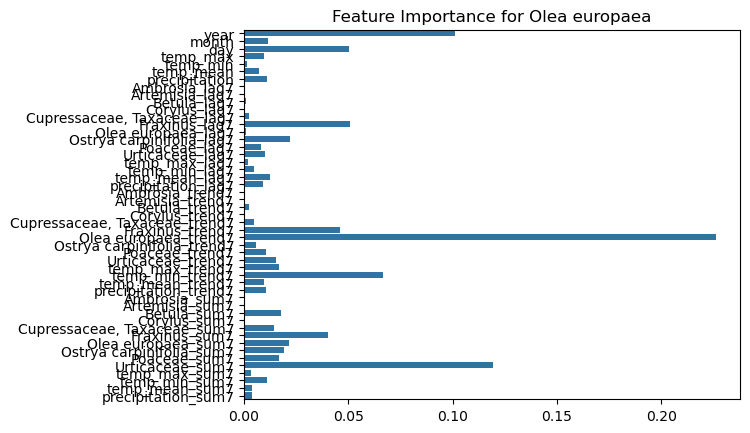

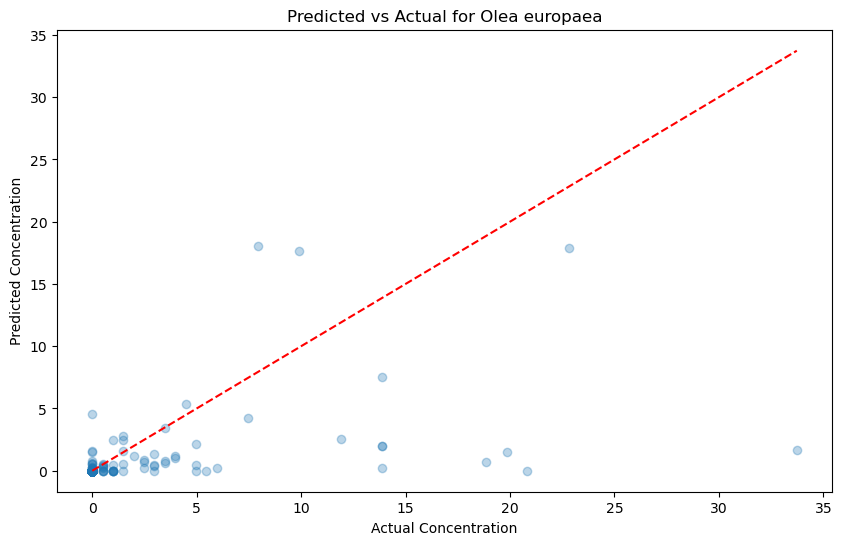

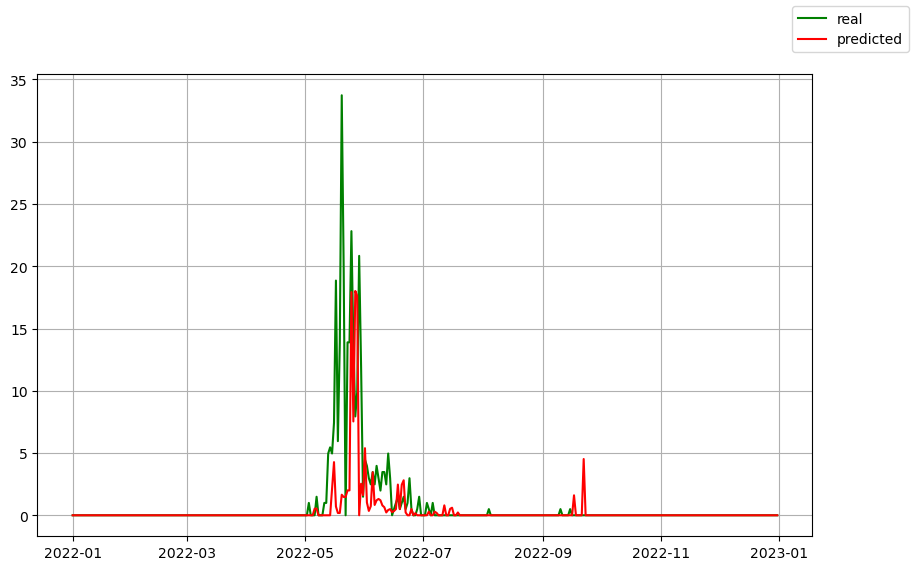

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best parameters:  {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 20, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 50, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Taxon: Ostrya carpinifolia
Tuned R² Score: 0.1223
Tuned Mean Squared Error: 59495.8889



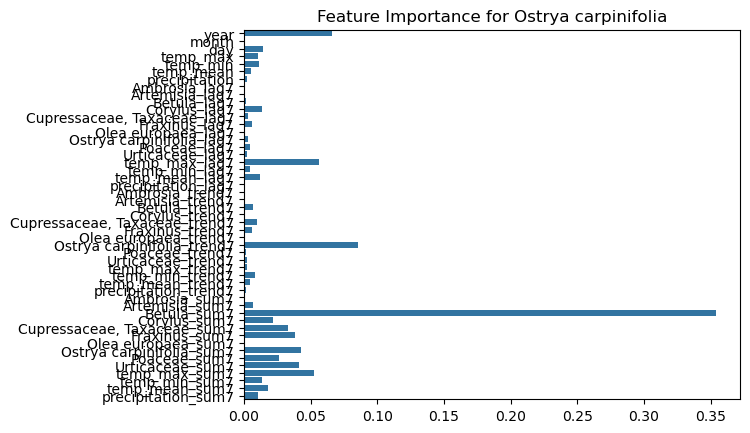

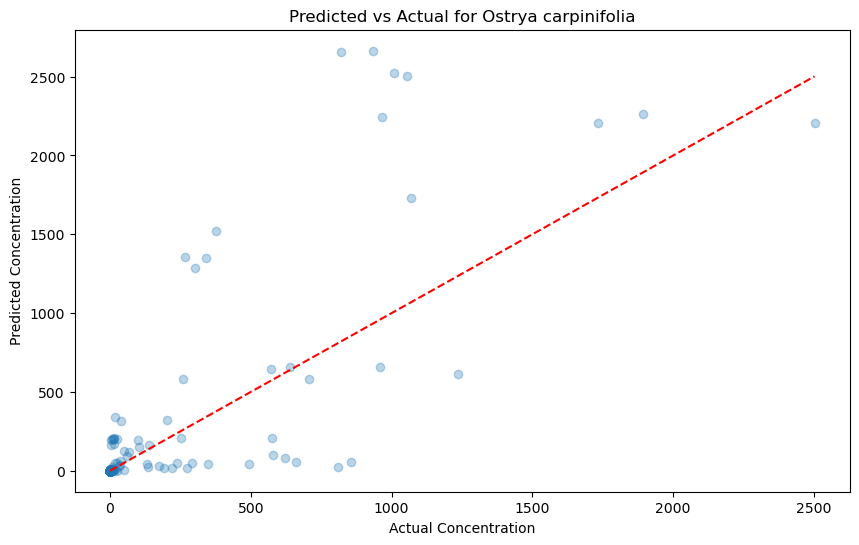

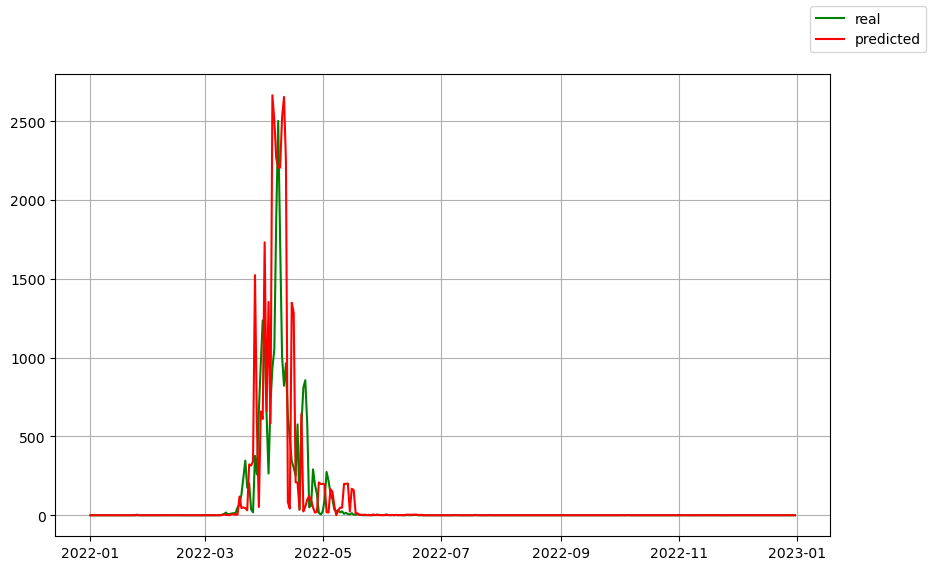

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best parameters:  {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 20, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 50, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Taxon: Poaceae
Tuned R² Score: -1.7094
Tuned Mean Squared Error: 3421.7618



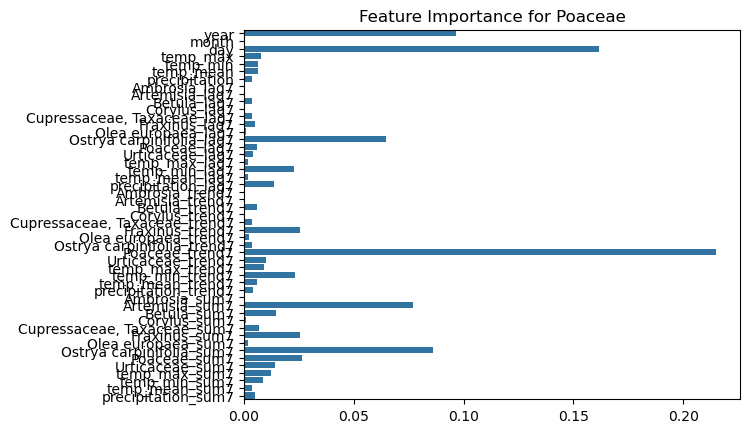

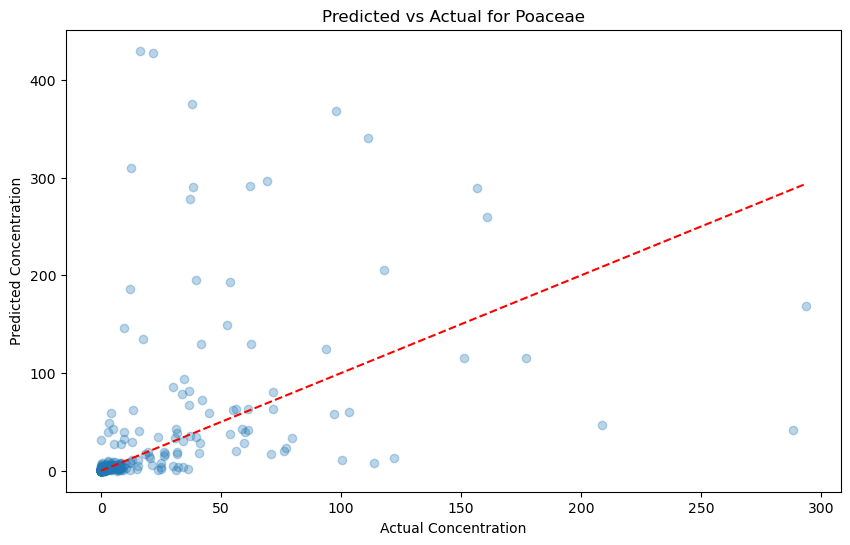

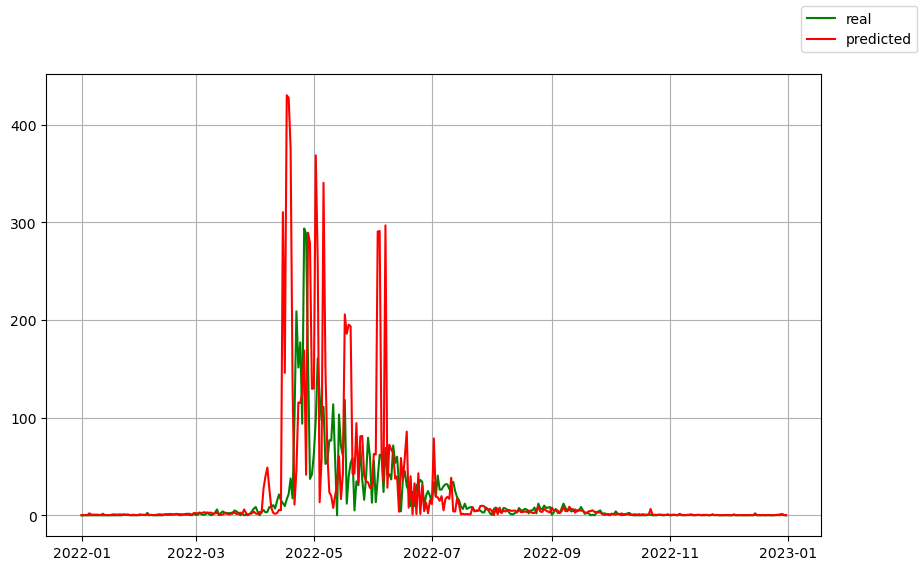

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best parameters:  {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 20, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 50, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Taxon: Urticaceae
Tuned R² Score: 0.0044
Tuned Mean Squared Error: 1114.1716



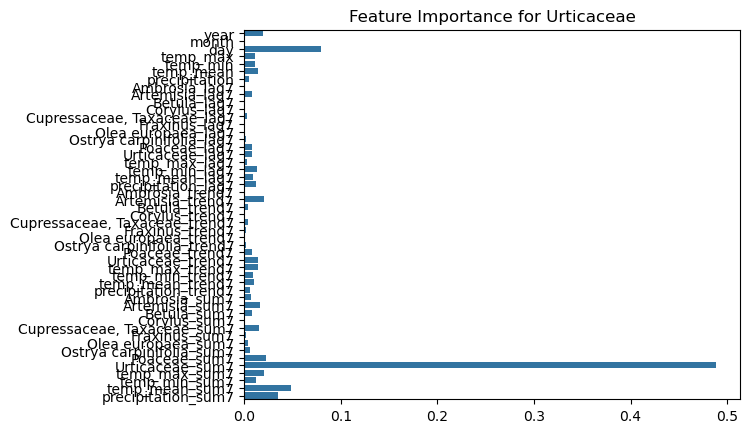

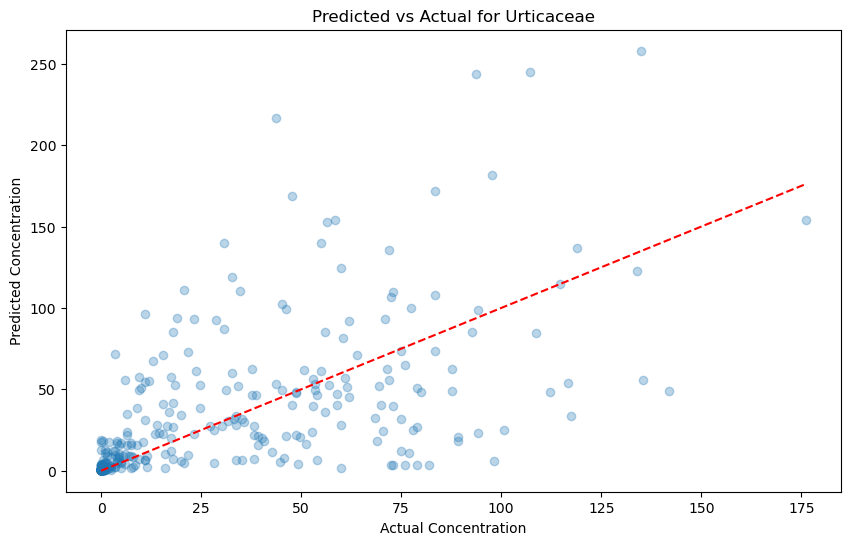

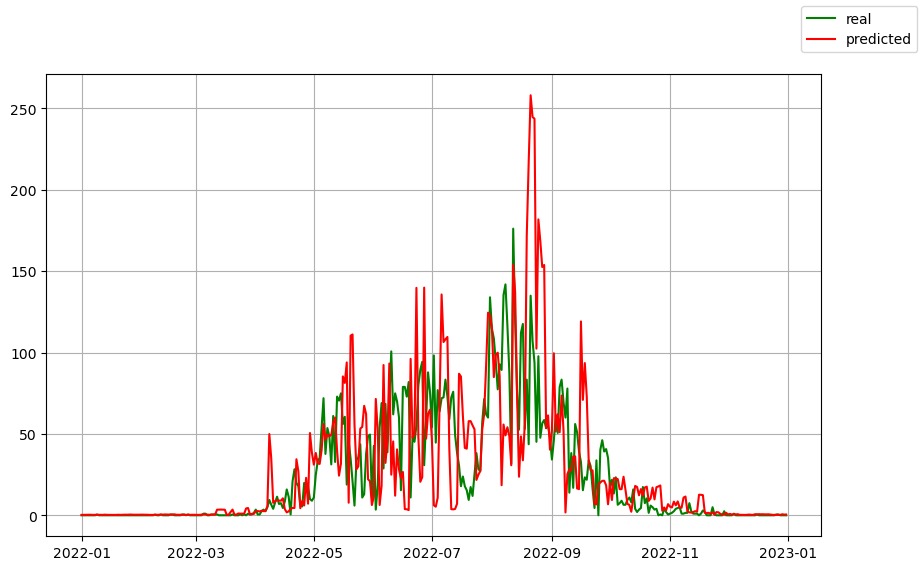

In [10]:
from sklearn.ensemble import GradientBoostingRegressor

# Parameters to choose 
param_grid = {
    "n_estimators": [100, 50],
    "max_depth": [20, None],
}

reg = GradientBoostingRegressor() 
gradient_boosting_results = {}

# Show best model results for each taxon 
for taxon, best_model in train_model(reg, train_data, features, taxa, param_grid):
    # Extract test data for a specific taxon 
    X_test, y_test = extract_xy(test_data, features, taxon) 

    print("Best parameters: ", best_model.get_params())
    y_pred = best_model.predict(X_test).clip(0) # Negative values are non-sense
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    print(f"Taxon: {taxon}")
    print(f"Tuned R² Score: {r2:.4f}") #Higher is better; measure of how well the model explains variance in the test data
    print(f"Tuned Mean Squared Error: {mse:.4f}\n") #Lower is better; Average squared difference between predicted and actual values 
        
    #Showing each feature importance for future feature tuning/adjustments
    feature_importances = best_model.feature_importances_
    sns.barplot(x=feature_importances, y=features)
    plt.title(f"Feature Importance for {taxon}")
    plt.show()
    
    
    plot_pred(y_test, y_pred, test_data['datetime'], taxon)

    # Save the achieved score for this taxon 
    gradient_boosting_results[taxon] = r2 

# Store the achieved results in a global results table 
results['Gradient Boosting'] = gradient_boosting_results 

# MultiLayer regressor

In case someone wants to try with NN 

In [11]:
# sklearn.neural_network.MLPRegressor

# Random forests 

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 5, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Taxon: Ambrosia
Tuned R² Score: -3.8695
Tuned Mean Squared Error: 0.3649



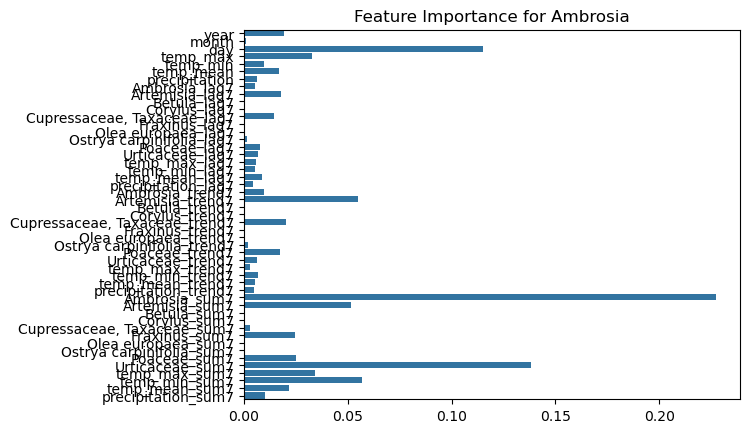

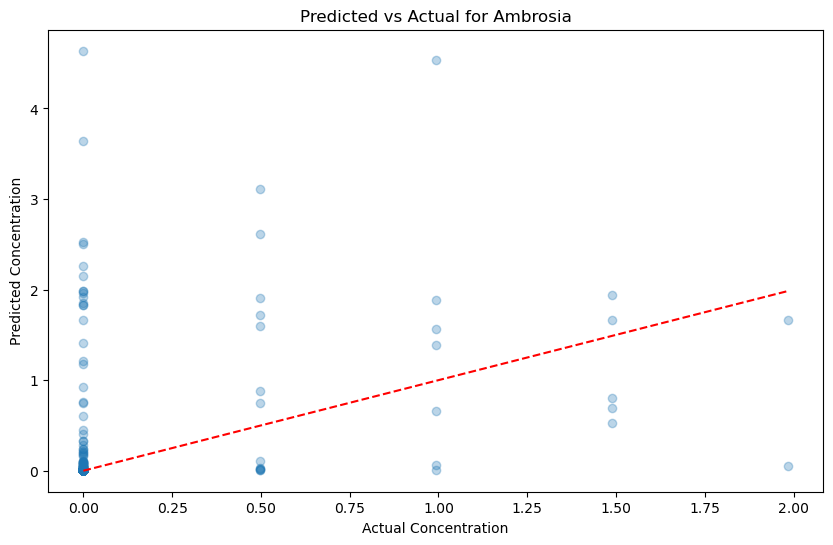

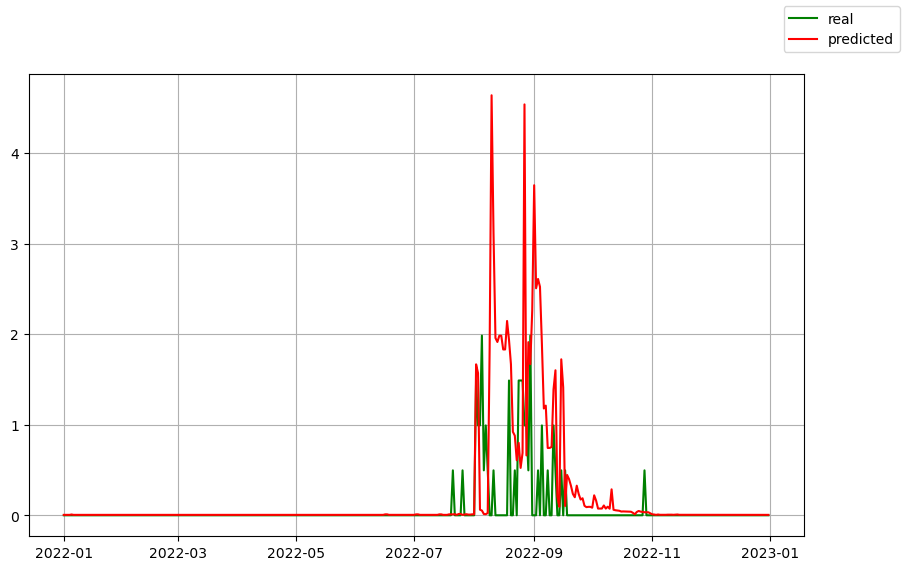

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Taxon: Artemisia
Tuned R² Score: -0.9871
Tuned Mean Squared Error: 82.4985



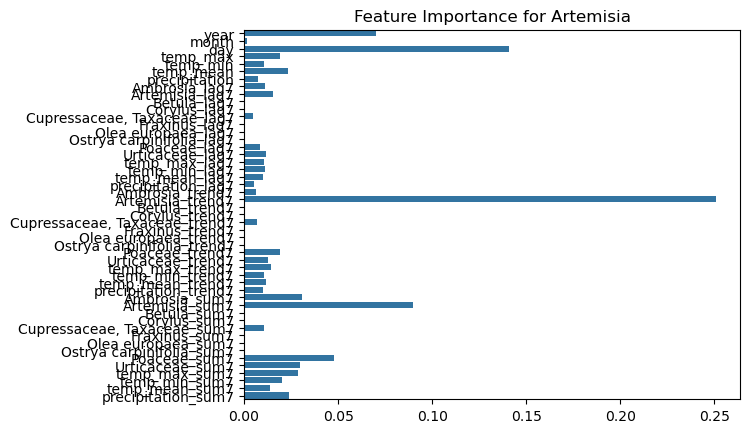

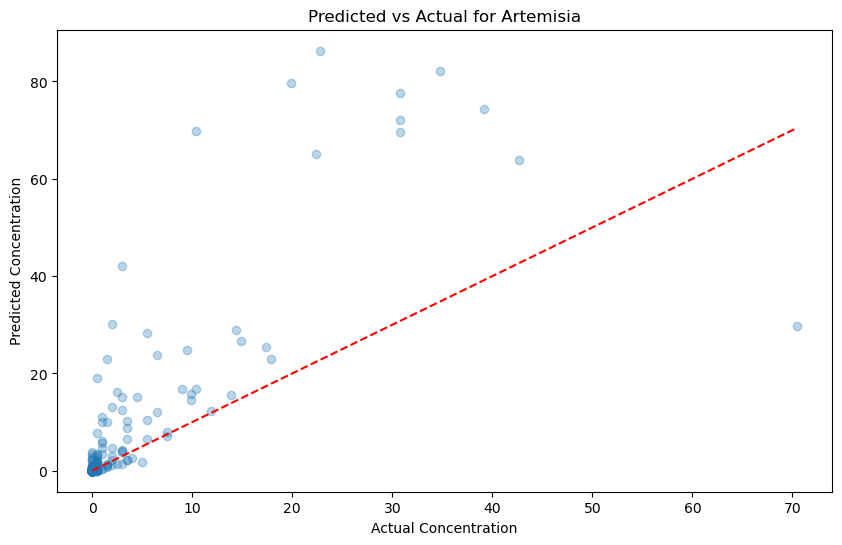

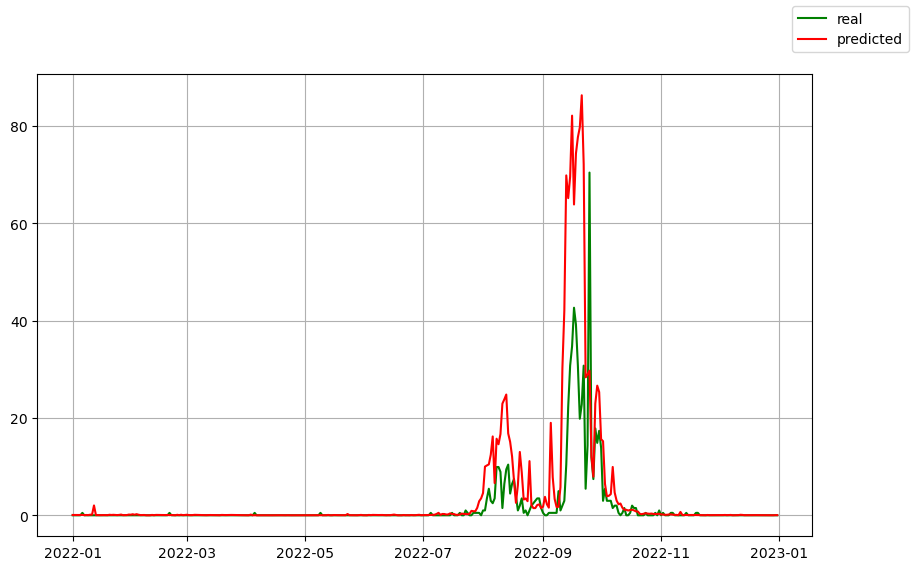

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 5, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Taxon: Betula
Tuned R² Score: 0.4100
Tuned Mean Squared Error: 338.4171



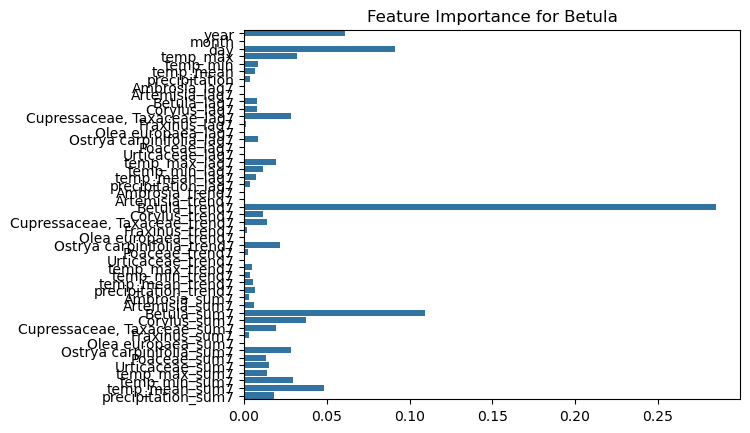

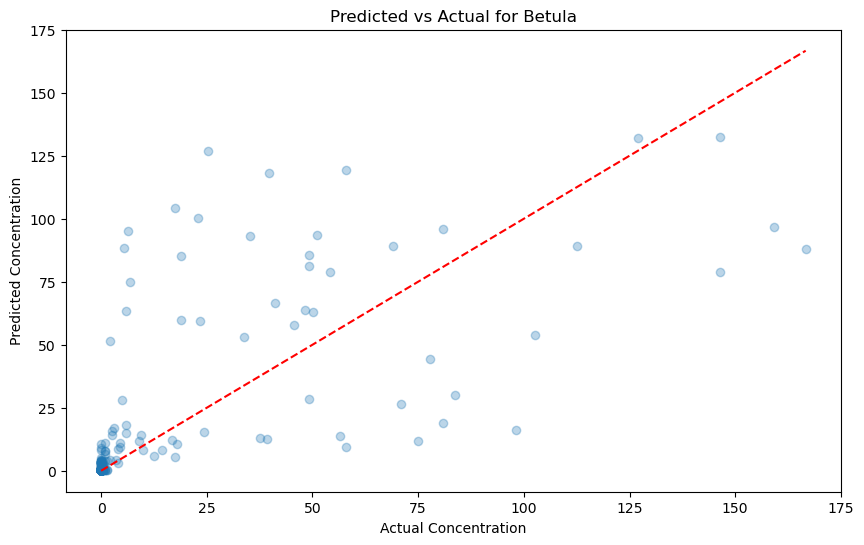

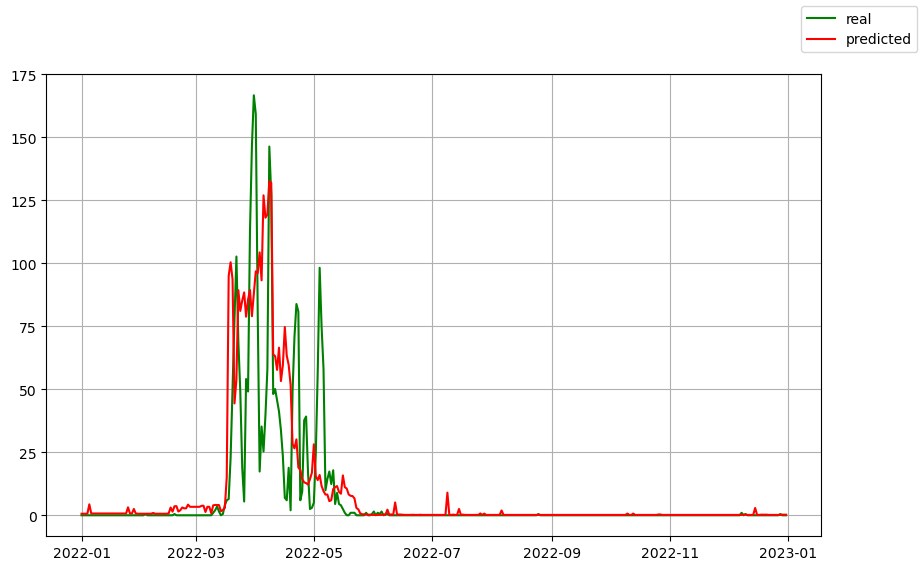

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 5, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Taxon: Corylus
Tuned R² Score: 0.1917
Tuned Mean Squared Error: 258.1780



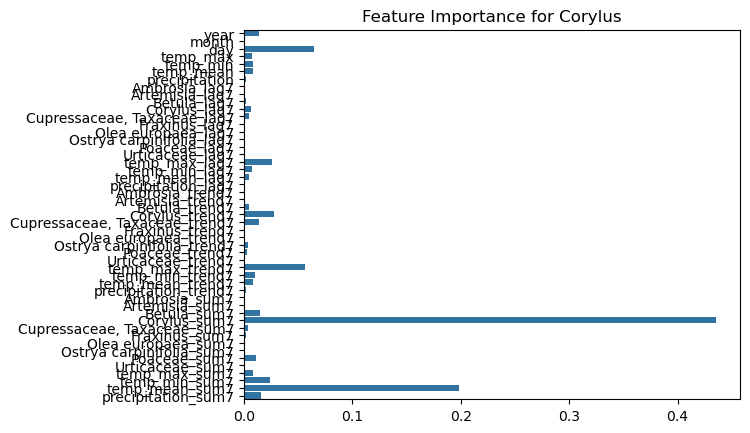

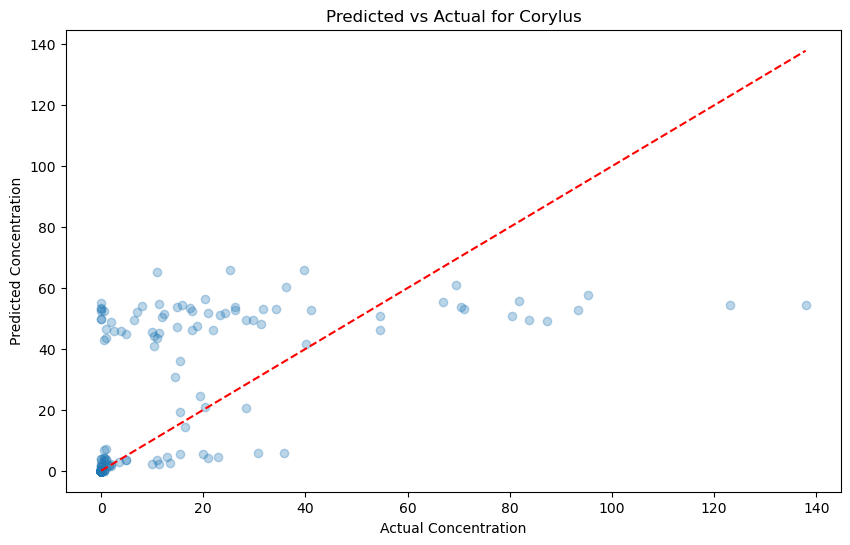

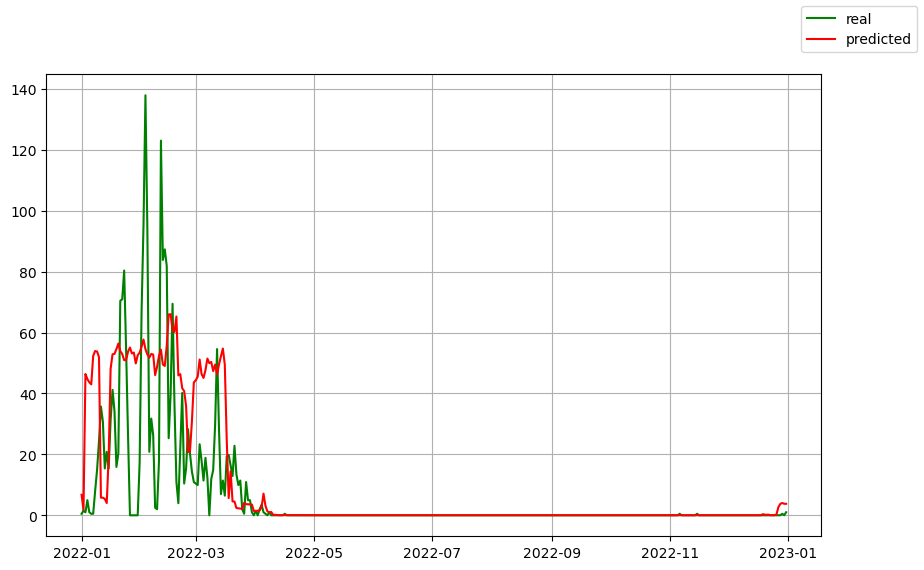

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 5, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Taxon: Cupressaceae, Taxaceae
Tuned R² Score: 0.4370
Tuned Mean Squared Error: 1909.2257



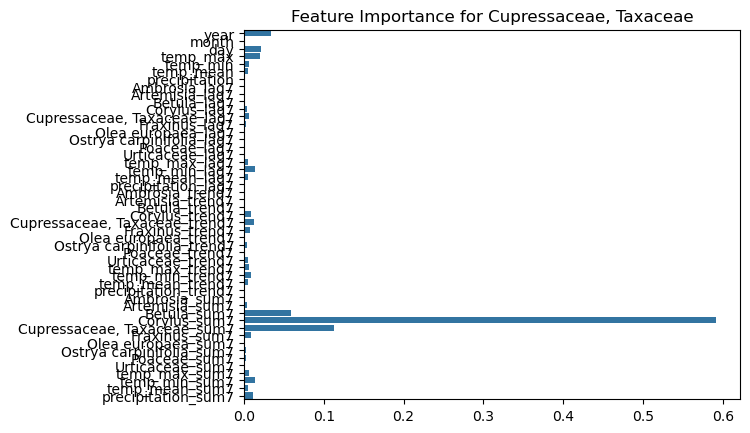

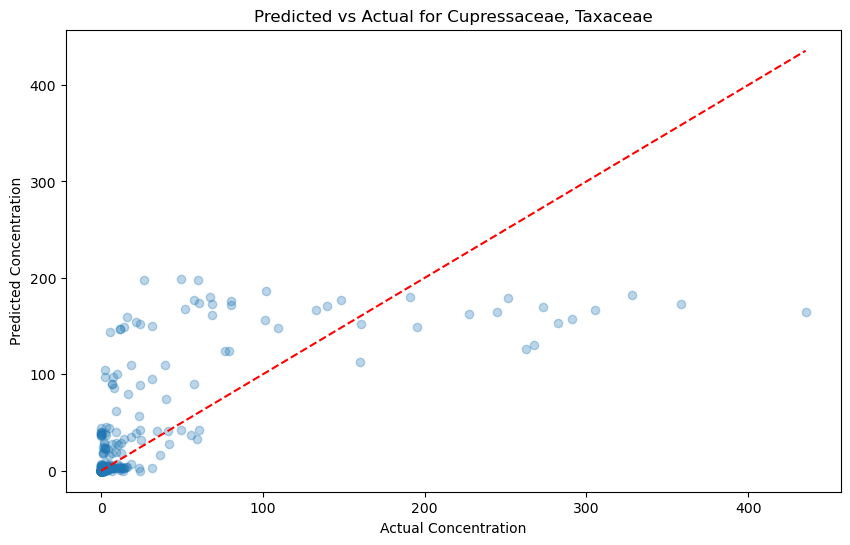

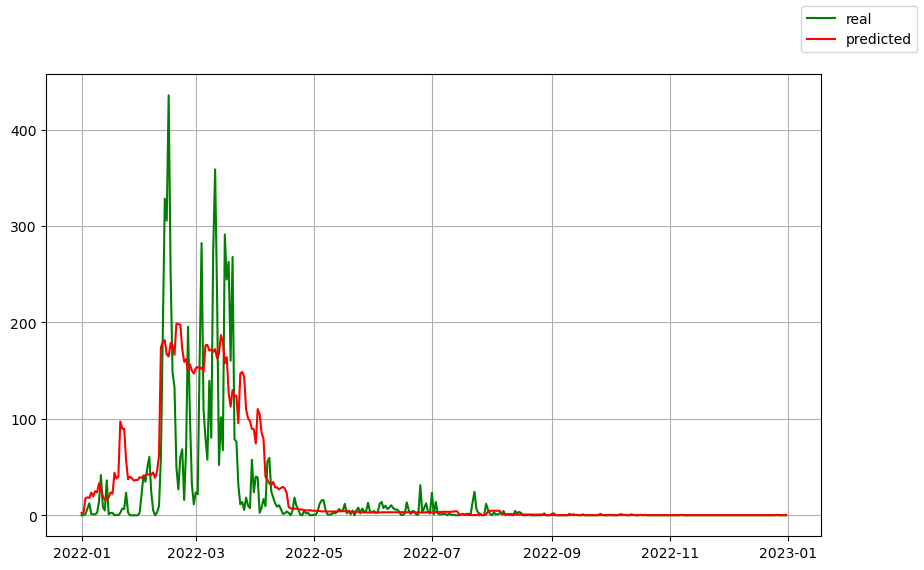

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 5, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Taxon: Fraxinus
Tuned R² Score: 0.4800
Tuned Mean Squared Error: 1339.1858



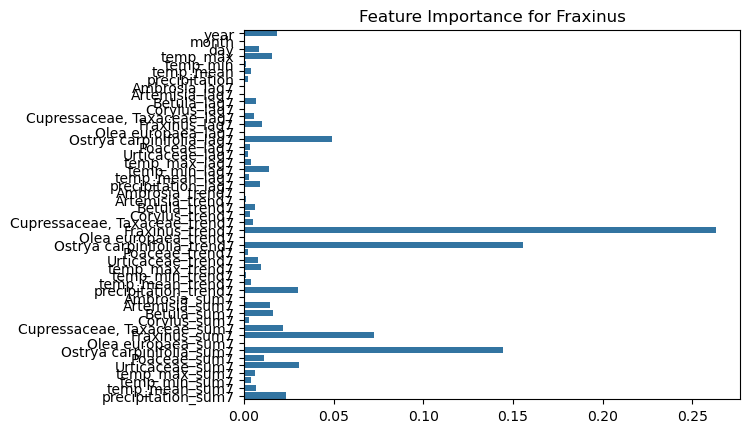

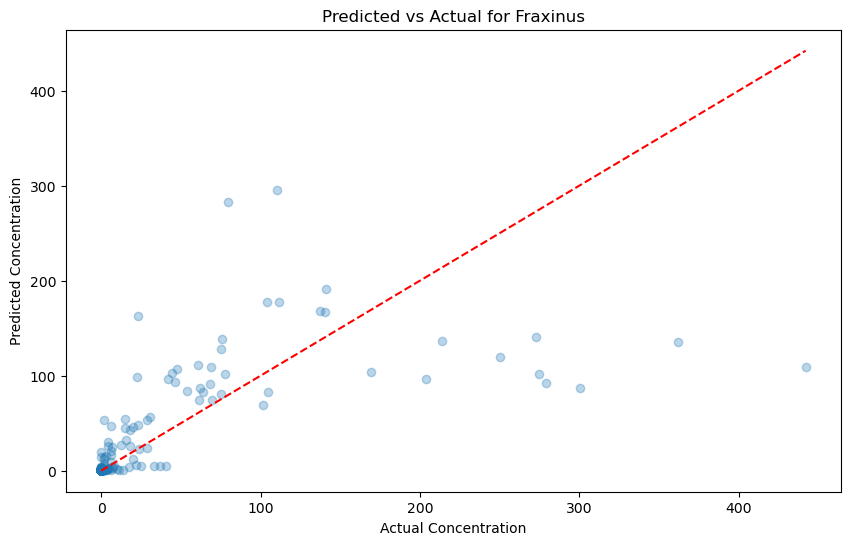

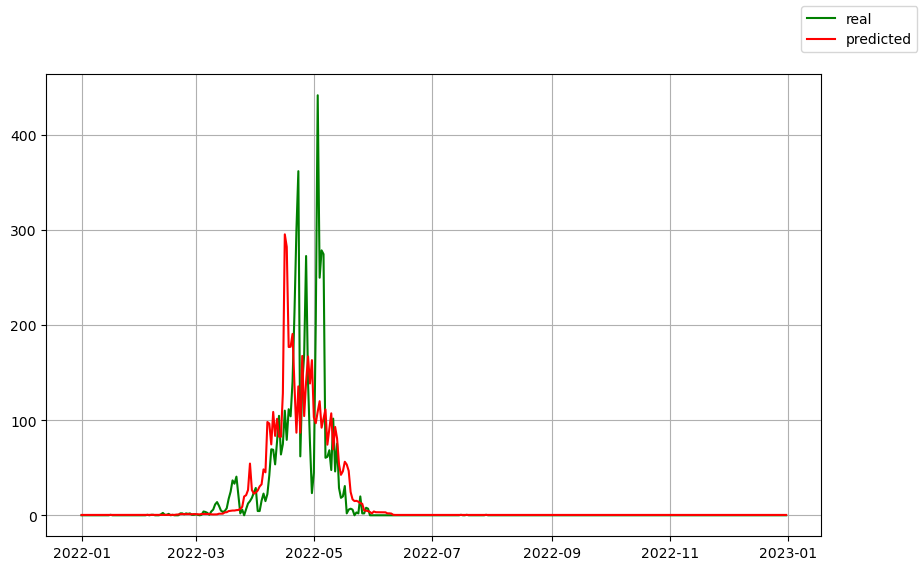

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 20, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Taxon: Olea europaea
Tuned R² Score: 0.2956
Tuned Mean Squared Error: 7.7813



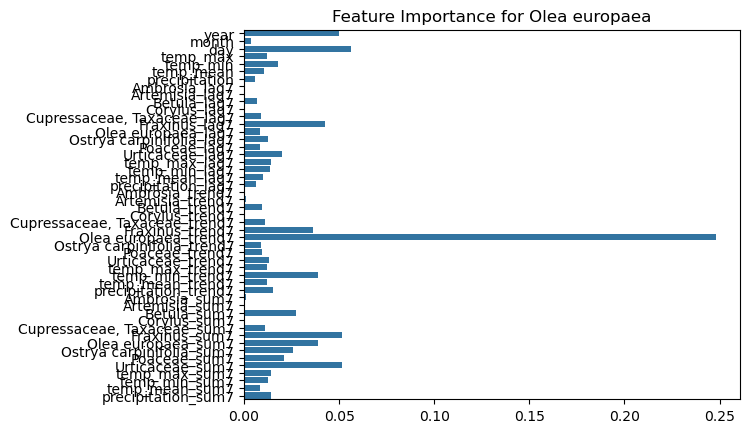

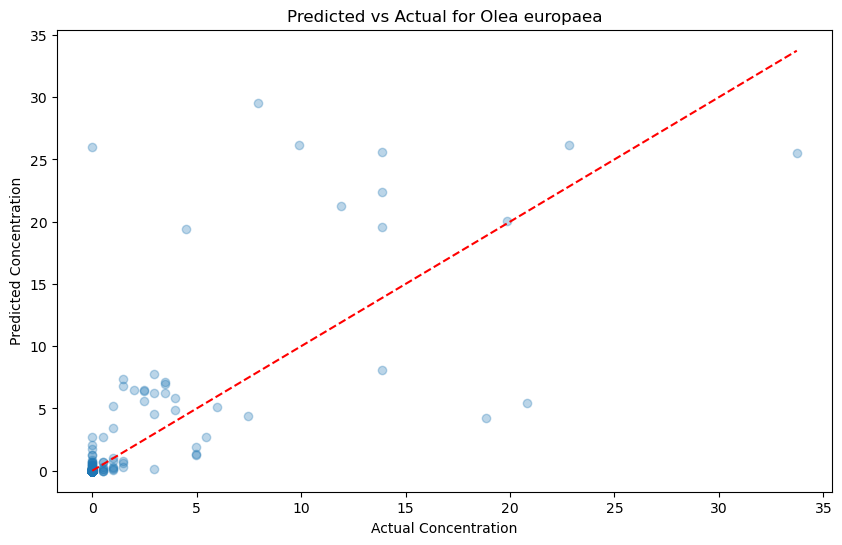

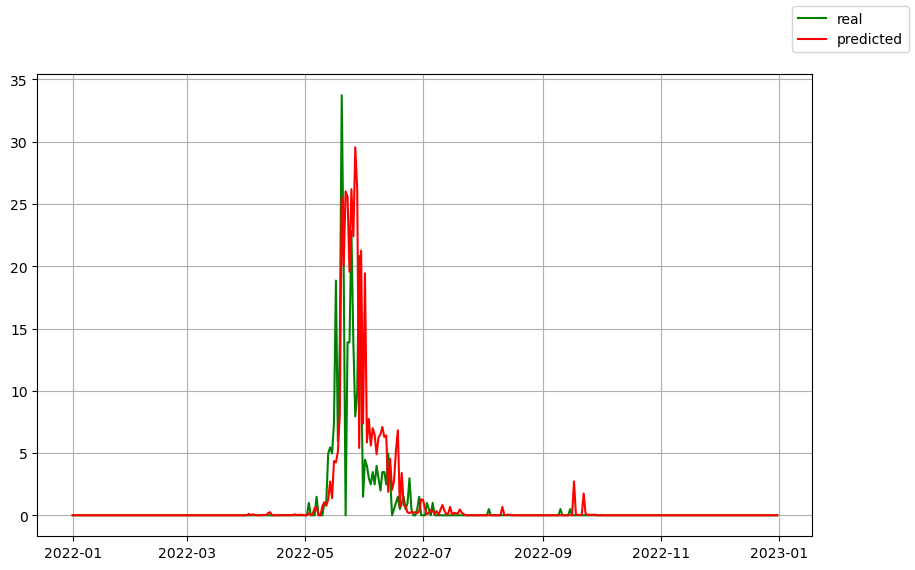

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 5, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Taxon: Ostrya carpinifolia
Tuned R² Score: 0.7057
Tuned Mean Squared Error: 19950.0907



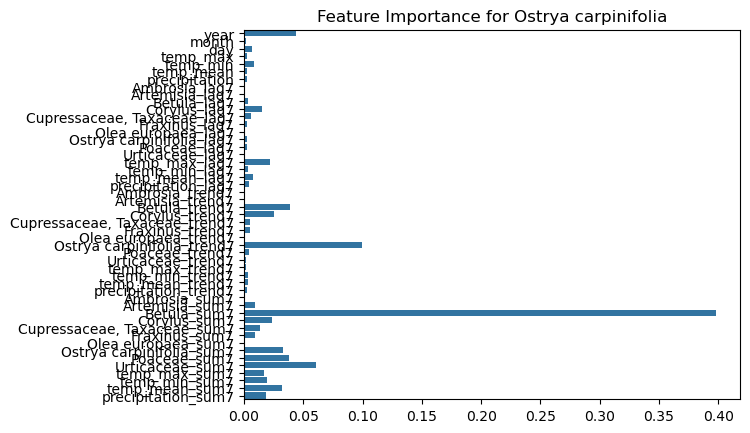

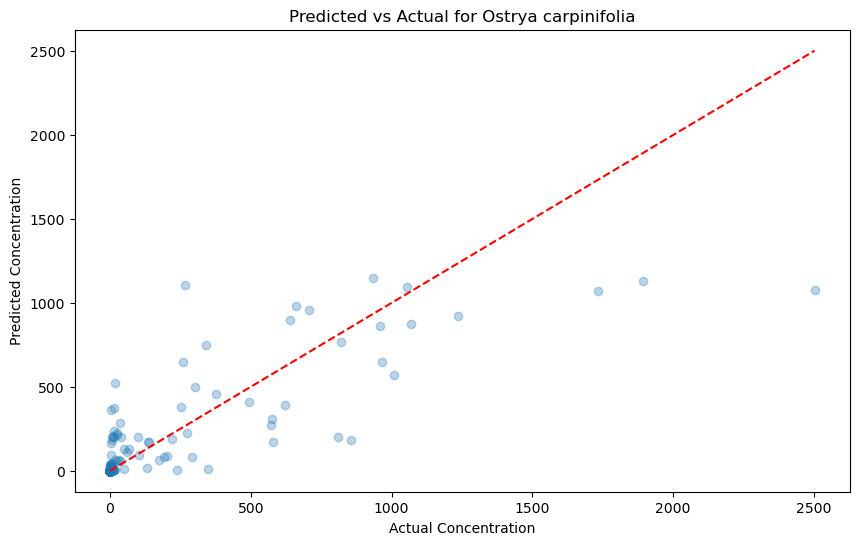

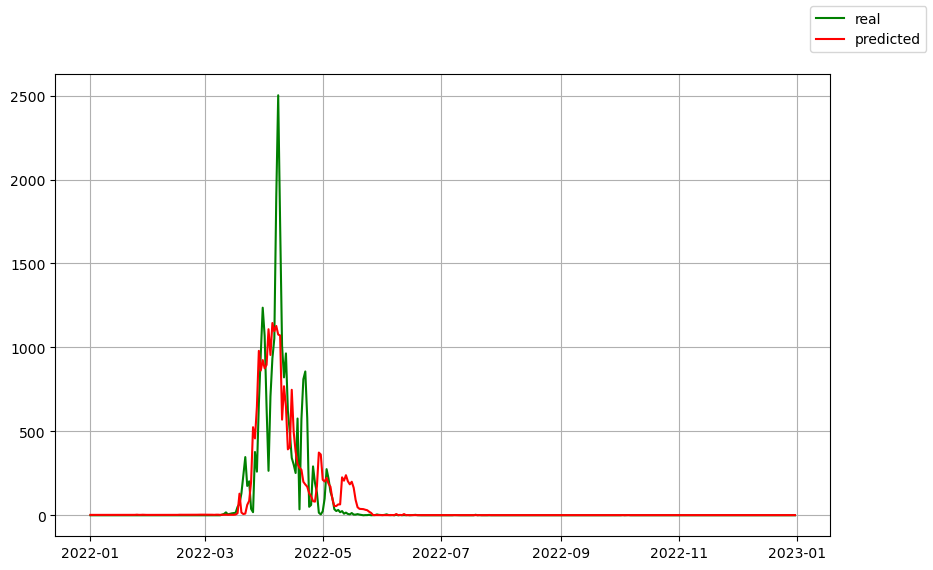

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 5, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Taxon: Poaceae
Tuned R² Score: 0.5684
Tuned Mean Squared Error: 545.0666



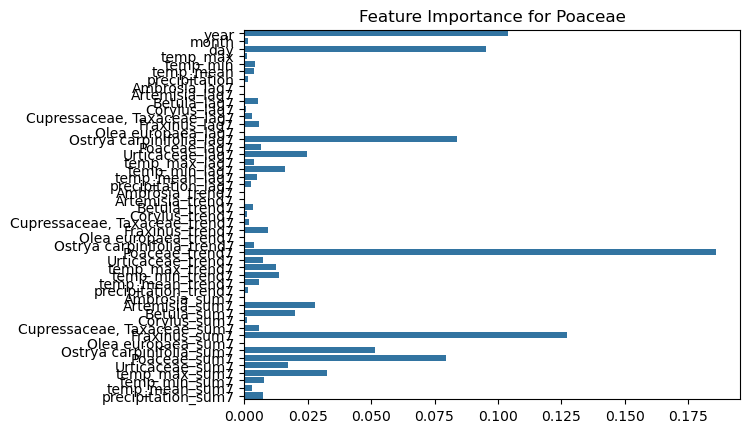

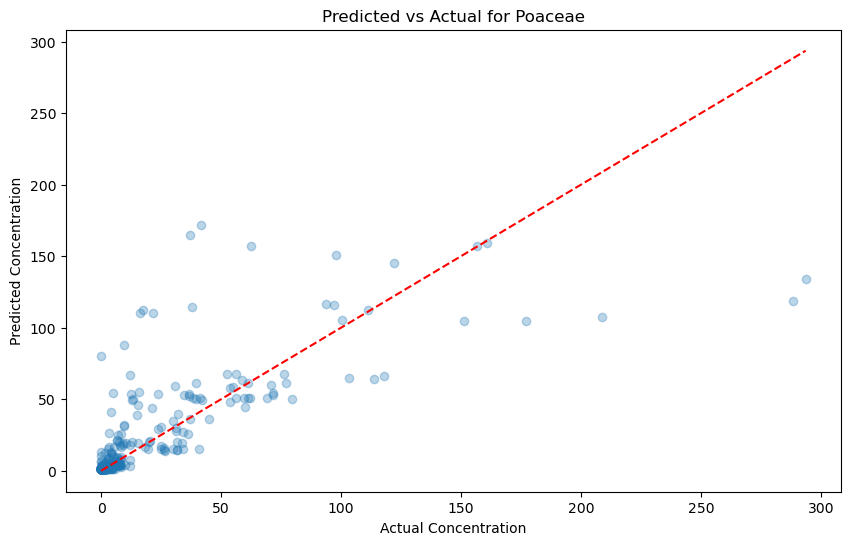

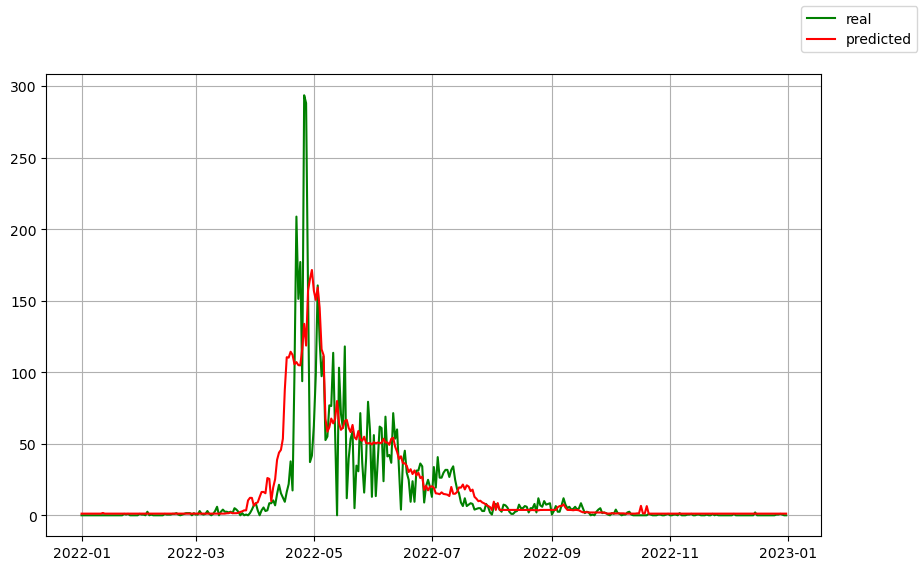

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 5, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Taxon: Urticaceae
Tuned R² Score: 0.1303
Tuned Mean Squared Error: 973.2813



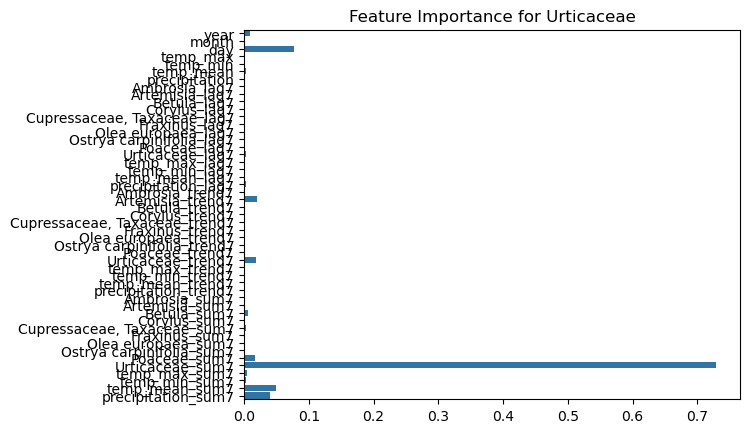

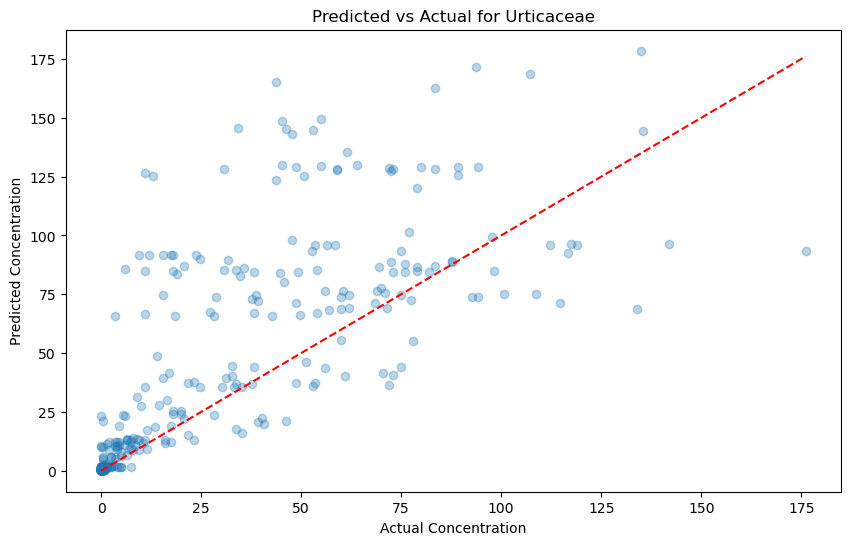

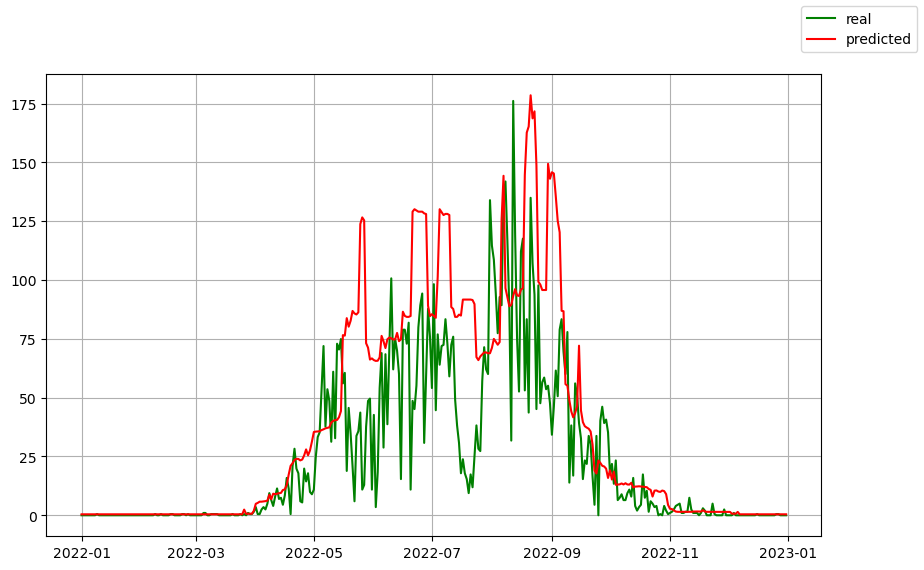

In [12]:
# Parameters grid used to look for the most fitting max_depth parameter
param_grid = {
    'max_depth': [5, 10, 15, 20, None],
    # 'max_leaf_nodes': [None, 50],
}

# Random Forest here created with no hyperparameters (such as max_depth) because of the following tuning process
rf = RandomForestRegressor()

rf_results = {} 
# Show best model results for each taxon 
for taxon, best_model in train_model(rf, train_data, features, taxa, param_grid):
    # Extract test data for a specific taxon 
    X_test, y_test = extract_xy(test_data, features, taxon) 

    print("Best parameters: ", best_model.get_params())
    y_pred = best_model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    print(f"Taxon: {taxon}")
    print(f"Tuned R² Score: {r2:.4f}") #Higher is better; measure of how well the model explains variance in the test data
    print(f"Tuned Mean Squared Error: {mse:.4f}\n") #Lower is better; Average squared difference between predicted and actual values 
        
    #Showing each feature importance for future feature tuning/adjustments
    feature_importances = best_model.feature_importances_
    sns.barplot(x=feature_importances, y=features)
    plt.title(f"Feature Importance for {taxon}")
    plt.show()


    plot_pred(y_test, y_pred, test_data['datetime'], taxon)

    # Save the achieved score for this taxon 
    rf_results[taxon] = r2 

# Store the achieved results in a global results table 
results['random_forest'] = rf_results 

# Final results

In [13]:
results_df = pd.DataFrame(results).T
print(results_df)

                   Ambrosia  Artemisia    Betula   Corylus  \
ridge             -0.005475   0.115446  0.407241  0.408590   
lasso              0.048999   0.158834  0.412837  0.417233   
Linear SVR         0.071915   0.207331  0.254431  0.388225   
K neighbors       -0.076641  -0.550564  0.336842  0.109971   
Gradient Boosting -5.178103  -5.732167 -0.340900 -4.490236   
random_forest     -3.869493  -0.987150  0.409954  0.191688   

                   Cupressaceae, Taxaceae  Fraxinus  Olea europaea  \
ridge                            0.347692  0.216001       0.239685   
lasso                            0.344253  0.222982       0.231696   
Linear SVR                       0.047534 -0.486835       0.313729   
K neighbors                      0.562204  0.205725       0.166105   
Gradient Boosting                0.151280  0.078632       0.218647   
random_forest                    0.436959  0.480037       0.295580   

                   Ostrya carpinifolia   Poaceae  Urticaceae  
ridge      

In [14]:
results_df.to_csv('models_performance.csv', index_label='Model') 